This cell imports all necessary libraries for the project, including tools for file/utility operations, data handling (NumPy, Pandas), visualization (Matplotlib, Seaborn), deep learning with PyTorch and timm, and machine learning/evaluation utilities from scikit-learn. It also includes tqdm for progress tracking and kagglehub/Path for downloading and managing Kaggle datasets, then prints a confirmation message.

In [1]:
import os
import shutil
import random
import itertools
import time
import platform
import re


import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.optim.lr_scheduler import CosineAnnealingLR
import timm

from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc
)
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


from scipy.special import softmax
from sklearn.manifold import TSNE

from tqdm import tqdm

import kagglehub
from pathlib import Path

print("All libraries imported successfully.")


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

All libraries imported successfully.


This block imports core utilities for file handling, timing, copying objects, JSON/CSV processing, randomness, system checks, and resource monitoring (psutil), along with libraries for data analysis and visualization (NumPy, Pandas, Matplotlib, Seaborn). It also brings in image-processing tools (OpenCV and PIL) and the main PyTorch/torchvision components needed to build models, apply transforms, and load data efficiently using Dataset and DataLoader.

In [2]:
import os
import time
import copy
import json
import random
import platform
import csv
import psutil

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import cv2
import PIL
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader



This section checks the current Kaggle runtime environment.
It collects and displays:
CPU model using the platform library
Total RAM (in GB) using psutil
GPU name via the nvidia-smi command (if a GPU is available)

In [3]:
import psutil

cpu_info = platform.processor()
ram_info = psutil.virtual_memory()
total_ram_gb = ram_info.total / (1024 ** 3)

try:
    gpu_info = !nvidia-smi --query-gpu=gpu_name --format=csv
    gpu_name = gpu_info[1]
except:
    gpu_name = "No GPU available"

print("CPU:", cpu_info)
print("Total RAM (GB):", round(total_ram_gb, 2))
print("GPU:", gpu_name)

CPU: x86_64
Total RAM (GB): 31.35
GPU: Tesla P100-PCIE-16GB


This code organizes PM25Vision images by air-quality labels.
It reads metadata.csv, maps PM2.5 bins to categories (Good, Moderate, Unhealthy, etc.), creates label folders, and copies images accordingly.
Finally, it prints summary counts and skipped files — readying the dataset for training.

In [4]:
import re
import shutil
import pandas as pd
from pathlib import Path


CSV_PATH = Path("/kaggle/input/pm25vision/train/metadata.csv")
IMG_DIR  = Path("/kaggle/input/pm25vision/train/images")
OUT_DIR  = Path("/kaggle/working/dataset")
OUT_DIR.mkdir(parents=True, exist_ok=True)


AQI_BINS = [
    (0, 50, "Good"),
    (51, 100, "Moderate"),
    (101, 150, "Unhealthy_Sensitive"),
    (151, 200, "Unhealthy"),
    (201, 300, "Very_Unhealthy"),
    (301, 10000, "Hazardous"),
]

def aqi_to_label(aqi: int) -> str:
    for lo, hi, label in AQI_BINS:
        if lo <= aqi <= hi:
            return label
    return None  

def bin_to_label(bin_val) -> str:
    """
    Accepts '0–50', '0-50', '0 — 50', etc.
    Extracts the LOWER numeric bound and maps to label.
    """
    s = str(bin_val).strip()
    s = s.replace("–", "-").replace("—", "-").replace("−", "-")
    s = re.sub(r"\s*-\s*", "-", s)
    m = re.search(r"(\d+)", s)
    if not m:
        return None
    lo = int(m.group(1))
    return aqi_to_label(lo)


df = pd.read_csv(CSV_PATH)
assert "pm25_bin" in df.columns, f"Expected 'pm25_bin' column but found {df.columns}"

fname_col = "filename" if "filename" in df.columns else ("file" if "file" in df.columns else None)
if fname_col is None:
    raise ValueError(f"No image filename column found. Columns: {list(df.columns)}")

df["fname"] = df[fname_col].astype(str)
df["level"] = df["pm25_bin"].apply(bin_to_label)


df = df.dropna(subset=["level"])

print("Class counts:")
print(df["level"].value_counts(dropna=False))


for _, _, label in AQI_BINS:
    (OUT_DIR / label).mkdir(parents=True, exist_ok=True)

missing = 0
copied  = 0
valid_labels = {b[2] for b in AQI_BINS}

for _, row in df.iterrows():
    src = IMG_DIR / row["fname"]
    if not src.exists():
        missing += 1
        continue

    if row["level"] not in valid_labels:
        continue

    dst = OUT_DIR / row["level"] / src.name
    shutil.copy2(src, dst)
    copied += 1

print(f"✅ Done! Copied: {copied} | Missing files skipped: {missing}")
print(f"Output root: {OUT_DIR}")


Class counts:
level
Good                   1780
Moderate               1780
Unhealthy_Sensitive    1780
Unhealthy              1780
Very_Unhealthy          822
Hazardous               356
Name: count, dtype: int64
✅ Done! Copied: 8298 | Missing files skipped: 0
Output root: /kaggle/working/dataset


This block organizes the test images into the same labeled structure as the training dataset.
It reads metadata.csv, maps PM2.5 bins to air-quality categories, and copies each image into its respective label folder under /kaggle/working/dataset/.
Duplicate files are checked and renamed if needed, while missing images are skipped.
Finally, it prints a summary of copied, skipped, and renamed files.

In [5]:
TEST_CSV_PATH = Path("/kaggle/input/pm25vision/test/metadata.csv")
TEST_IMG_DIR  = Path("/kaggle/input/pm25vision/test/images")
OUT_DIR       = Path("/kaggle/working/dataset") 


AQI_BINS = [
    (0, 50, "Good"),
    (51, 100, "Moderate"),
    (101, 150, "Unhealthy_Sensitive"),
    (151, 200, "Unhealthy"),
    (201, 300, "Very_Unhealthy"),
    (301, 10000, "Hazardous"),
]

def aqi_to_label(aqi: int) -> str | None:
    for lo, hi, label in AQI_BINS:
        if lo <= aqi <= hi:
            return label
    return None 

def bin_to_label(bin_val) -> str | None:
    s = str(bin_val).strip()
    s = s.replace("–", "-").replace("—", "-").replace("−", "-")
    s = re.sub(r"\s*-\s*", "-", s)
    m = re.search(r"(\d+)", s)
    if not m:
        return None  
    lo = int(m.group(1))
    return aqi_to_label(lo)


df_t = pd.read_csv(TEST_CSV_PATH)
assert "pm25_bin" in df_t.columns, f"Expected 'pm25_bin' in TEST CSV, got: {df_t.columns}"

fname_col_t = "filename" if "filename" in df_t.columns else ("file" if "file" in df_t.columns else None)
if fname_col_t is None:
    raise ValueError(f"No image filename column in TEST CSV. Columns: {list(df_t.columns)}")

df_t["fname"] = df_t[fname_col_t].astype(str)
df_t["level"] = df_t["pm25_bin"].apply(bin_to_label)

missing, copied, skipped_same, renamed_dupe = 0, 0, 0, 0
valid_labels = {b[2] for b in AQI_BINS}

for _, r in df_t.iterrows():
    src = TEST_IMG_DIR / r["fname"]
    if not src.exists():
        missing += 1
        continue

 
    if r["level"] not in valid_labels:
        continue

    dest_dir = OUT_DIR / r["level"]
    dest_dir.mkdir(parents=True, exist_ok=True)

    dst = dest_dir / src.name
    if dst.exists():
     
        if os.path.getsize(dst) == os.path.getsize(src):
            skipped_same += 1
            continue
        dst = dest_dir / f"test__{src.name}"
        renamed_dupe += 1

    shutil.copy2(src, dst)
    copied += 1

print("✅ TEST merge complete.")
print(f"Copied: {copied} | Missing files: {missing} | Skipped exact-duplicates: {skipped_same} | Renamed (name clash): {renamed_dupe}")
print(f"Merged into: {OUT_DIR}")


✅ TEST merge complete.
Copied: 2905 | Missing files: 0 | Skipped exact-duplicates: 16 | Renamed (name clash): 0
Merged into: /kaggle/working/dataset


This code counts the number of images in each air-quality class under /kaggle/working/dataset/.
It prints per-class image totals and the overall dataset size — useful for confirming that all files were organized correctly.

In [6]:
from pathlib import Path
import shutil

OUT_DIR = Path("/kaggle/working/dataset")


unknown_dir = OUT_DIR / "Unknown"
if unknown_dir.exists() and unknown_dir.is_dir():
    shutil.rmtree(unknown_dir)


class_counts = {}
for sub in OUT_DIR.iterdir():
    if sub.is_dir():
        class_counts[sub.name] = len(list(sub.glob("*")))

print(" Image count per class:\n")

for k, v in sorted(class_counts.items()):
    print(f"{k:20s}: {v}")

print("\nTotal images:", sum(class_counts.values()))

 Image count per class:

Good                : 2408
Hazardous           : 481
Moderate            : 2407
Unhealthy           : 2407
Unhealthy_Sensitive : 2393
Very_Unhealthy      : 1007

Total images: 11103


This code scans the organized dataset under /kaggle/working/dataset/ and builds a DataFrame listing each image path and its label.
It filters valid image formats (.jpg, .jpeg, .png), counts total samples per class, and defines a helper function to load images as RGB arrays.
Useful for quick checks, visualization, or later data-loader creation.

In [7]:
from pathlib import Path
from PIL import Image

BASE_DIR = Path("/kaggle/working/dataset")  
assert BASE_DIR.exists(), BASE_DIR

rows = []
for label_dir in sorted([p for p in BASE_DIR.iterdir() if p.is_dir()]):
    label = label_dir.name
    for p in label_dir.glob("*"):
        if p.suffix.lower() not in {".jpg", ".jpeg", ".png"}:
            continue
        rows.append({"path": str(p), "label": label})

df = pd.DataFrame(rows)
print("Total images indexed:", len(df))
print("Class balance:\n", df["label"].value_counts())

def load_rgb(path):
    with Image.open(path) as im:
        im = im.convert("RGB")
        return np.array(im)

df.head(20)

Total images indexed: 11103
Class balance:
 label
Good                   2408
Moderate               2407
Unhealthy              2407
Unhealthy_Sensitive    2393
Very_Unhealthy         1007
Hazardous               481
Name: count, dtype: int64


,path,label
0,/kaggle/working/dataset/Good/4885856834764669.jpg,Good
1,/kaggle/working/dataset/Good/563297997990047.jpg,Good
2,/kaggle/working/dataset/Good/369599734483142.jpg,Good
3,/kaggle/working/dataset/Good/222112109934729.jpg,Good
4,/kaggle/working/dataset/Good/296304505321720.jpg,Good
5,/kaggle/working/dataset/Good/125435829665134.jpg,Good
6,/kaggle/working/dataset/Good/516985821409467.jpg,Good
7,/kaggle/working/dataset/Good/1202567341510263.jpg,Good
8,/kaggle/working/dataset/Good/626425258265563.jpg,Good
9,/kaggle/working/dataset/Good/507223953745546.jpg,Good


This code visualizes the number of images in each air-quality category using a Seaborn bar chart.
It helps verify dataset balance and ensure all classes are properly represented before training.

Ephoch Number Declaration

/tmp/ipykernel_24/3663135084.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=df["label"].value_counts().index,


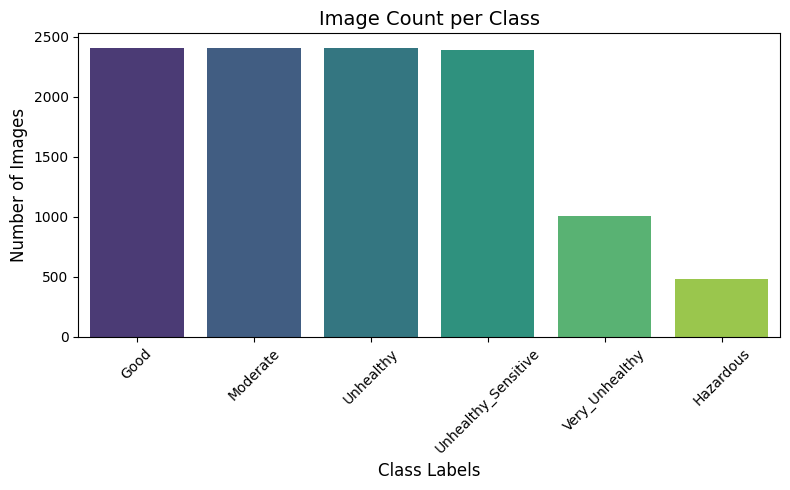

In [8]:
plt.figure(figsize=(8, 5))
sns.barplot(x=df["label"].value_counts().index,
            y=df["label"].value_counts().values,
            palette="viridis")
plt.title("Image Count per Class", fontsize=14)
plt.xlabel("Class Labels", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

This code displays a small gallery showing two random sample images from each air-quality class.
It helps visually verify the dataset and observe differences across categories such as Good, Moderate, and Unhealthy.
Useful for quick quality checks and understanding visual variation before model training.

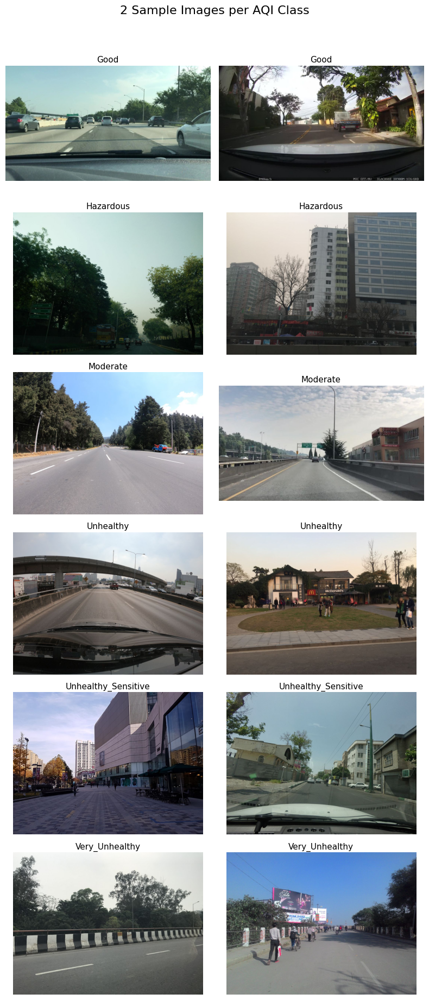

In [9]:
from PIL import Image

classes = sorted(df["label"].unique())

N_PER_CLASS = 2

plt.figure(figsize=(N_PER_CLASS * 4, len(classes) * 3))

for i, lbl in enumerate(classes):
    subset = df[df["label"] == lbl]["path"].tolist()
    sample_paths = random.sample(subset, min(N_PER_CLASS, len(subset)))
    
    for j, path in enumerate(sample_paths):
        idx = i * N_PER_CLASS + j + 1
        plt.subplot(len(classes), N_PER_CLASS, idx)
        
        img = Image.open(path)
        plt.imshow(img)
        plt.axis("off")
        
        plt.title(lbl, fontsize=11, pad=4)

plt.suptitle("2 Sample Images per AQI Class", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

This block divides the dataset into train, validation, and test sets for multiple ratios (from 90:10 down to 10:90).
Each split is stratified by class labels to keep class balance and uses a fixed random seed (42) for reproducibility.
From the training portion, 10% is further used as validation.
All splits are saved in dictionaries (SPLITS, FIXED_IDX) and a summary table shows image counts for every ratio

In [10]:
original_base_dir = "/kaggle/working/dataset"
new_base_dir = "/kaggle/working/final_data"

data = []
for label in os.listdir(original_base_dir):
    path = os.path.join(original_base_dir, label)
    if not os.path.isdir(path):
        continue
    for fname in os.listdir(path):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png', '.JPG')):
            data.append({'path': os.path.join(path, fname), 'label': label})

df = pd.DataFrame(data)

train_val, test = train_test_split(df, test_size=0.1, stratify=df['label'], random_state=42)
train, val = train_test_split(train_val, test_size=0.1, stratify=train_val['label'], random_state=42)

print(f"Total images: {len(df)}")
print(f"Train: {len(train)}, Val: {len(val)}, Test: {len(test)}")

for split_df, split in zip([train, val, test], ['train', 'val', 'test']):
    for _, row in split_df.iterrows():
        dst_dir = os.path.join(new_base_dir, split, row['label'])
        os.makedirs(dst_dir, exist_ok=True)
        shutil.copy(row['path'], os.path.join(dst_dir, os.path.basename(row['path'])))


Total images: 11103
Train: 8992, Val: 1000, Test: 1111


This code sets a fixed random seed (42) for PyTorch (CPU and CUDA), NumPy, and Python’s random module to make training and other randomized operations more reproducible across runs.

In [11]:
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)


This section defines a custom PyTorch Dataset (ImageDataset) that loads images from file paths, converts them to RGB, applies optional preprocessing/augmentation transforms, and returns each image with its label. It also provides a helper function get_dinov2_transforms() to create DINOv2-style transforms: heavier augmentations for training (flip, rotation, color jitter) and a simpler resize + normalization pipeline for evaluation.

In [12]:
from torch.utils.data import Dataset
from PIL import Image

class ImageDataset(Dataset):
    """Custom dataset for image classification"""
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label


def get_dinov3_transforms(is_training=False, img_size=224):

    if is_training:
        return transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(15),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    else:
        return transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])


This block builds a DINOv2-based image classification model using a pretrained Vision Transformer from timm. First, DINOv2FeatureExtractor loads the pretrained DINOv2 ViT backbone, optionally freezes its weights to prevent fine-tuning, and outputs feature embeddings. Then, DINOv2Classifier wraps that backbone with a lightweight classification head (LayerNorm → Dropout → Linear) to produce class logits, and also provides a get_features() method to extract embeddings without running the classifier.

In [13]:
class DINOv3FeatureExtractor(nn.Module):
    def __init__(self, model_name='vit_base_patch16_dinov3.lvd1689m', pretrained=True, freeze_backbone=True):
        super().__init__()

        # Load pretrained DINOv3 model (timm)
        self.backbone = timm.create_model(model_name, pretrained=pretrained, num_classes=0)

        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

        self.feature_dim = self.backbone.num_features

    def forward(self, x):
        return self.backbone(x)


class DINOv3Classifier(nn.Module):
    def __init__(self, num_classes, model_name='vit_base_patch16_dinov3.lvd1689m',
                 pretrained=True, freeze_backbone=True, dropout=0.1):
        super().__init__()

        self.feature_extractor = DINOv3FeatureExtractor(
            model_name=model_name,
            pretrained=pretrained,
            freeze_backbone=freeze_backbone
        )

        self.classifier = nn.Sequential(
            nn.LayerNorm(self.feature_extractor.feature_dim),
            nn.Dropout(dropout),
            nn.Linear(self.feature_extractor.feature_dim, num_classes)
        )

    def forward(self, x):
        features = self.feature_extractor(x)
        logits = self.classifier(features)
        return logits

    def get_features(self, x):
        return self.feature_extractor(x)


This section defines a create_model() helper that builds a DINOv2-based classifier using different ViT backbone sizes (small/base/large/giant) and optionally freezes the backbone for feature-extraction training. The example __main__ block then sets basic training settings (batch size, image size, device), creates the model, moves it to GPU/CPU, runs a quick forward pass on a dummy image to verify output and feature shapes, and prints total vs trainable (unfrozen) parameter counts to confirm freezing worked.

In [14]:
def create_model(num_classes, freeze_backbone=True, model_variant='base'):

    model_names = {
        'small': 'vit_small_patch16_dinov3.lvd1689m',
        'base':  'vit_base_patch16_dinov3.lvd1689m',
        'large': 'vit_large_patch16_dinov3.lvd1689m',
        'giant': 'vit_huge_patch16_dinov3.lvd1689m'   # if not available in your env, use 'vit_large...'
    }

    model_name = model_names.get(model_variant, model_names['base'])

    model = DINOv3Classifier(
        num_classes=num_classes,
        model_name=model_name,
        pretrained=True,
        freeze_backbone=freeze_backbone,
        dropout=0.1
    )
    return model


if __name__ == "__main__":
    BATCH_SIZE = 32
    IMG_SIZE = 512  # <-- changed from 518 (patch16-friendly)
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    _num_classes_placeholder = 10

    model = create_model(
        num_classes=_num_classes_placeholder,
        freeze_backbone=True,
        model_variant='base'
    )
    model = model.to(DEVICE)

    print("Model created successfully!")
    print(f"Feature dimension: {model.feature_extractor.feature_dim}")
    print(f"Number of classes: {_num_classes_placeholder}")

    dummy_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
    with torch.no_grad():
        output = model(dummy_input)
        features = model.get_features(dummy_input)

    print(f"Output shape: {output.shape}")
    print(f"Features shape: {features.shape}")

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"Total parameters: {total_params:,}")
    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Frozen parameters: {total_params - trainable_params:,}")


model.safetensors:   0%|          | 0.00/343M [00:00<?, ?B/s]

Model created successfully!
Feature dimension: 768
Number of classes: 10
Output shape: torch.Size([1, 10])
Features shape: torch.Size([1, 768])
Total parameters: 85,650,442
Trainable parameters: 9,226
Frozen parameters: 85,641,216


This block initializes key global settings by reading the training folder to detect class names, computing NUM_CLASSES, and creating class-to-index/index-to-class mappings for label encoding. It also selects the runtime device (GPU if available), instantiates a frozen-backbone DINOv2 “base” model on that device, and sets common training constants like batch size and image size.

In [15]:
base_folder = "/kaggle/working/final_data/train"
all_class_dirs = sorted(os.listdir(base_folder))

NUM_CLASSES = len(all_class_dirs)
print(f"Global NUM_CLASSES set to: {NUM_CLASSES}")

class_to_idx = {class_name: i for i, class_name in enumerate(all_class_dirs)}
idx_to_class = {i: class_name for class_name, i in class_to_idx.items()}

print("Class mapping:", class_to_idx)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", DEVICE)

m_model = create_model(
    num_classes=NUM_CLASSES,
    freeze_backbone=True,
    model_variant='base'
).to(DEVICE)

print("Global DINOv3 model instantiated.")
BATCH_SIZE = 32
IMG_SIZE = 512


Global NUM_CLASSES set to: 6
Class mapping: {'Good': 0, 'Hazardous': 1, 'Moderate': 2, 'Unhealthy': 3, 'Unhealthy_Sensitive': 4, 'Very_Unhealthy': 5}
Using device: cuda
Global DINOv3 model instantiated.


This block builds the train/validation/test pipelines by scanning each split directory, collecting image file paths and their class labels into Pandas DataFrames, and converting the string labels into integer IDs using class_to_idx. It then applies DINOv2-style transforms (augmented for training, standard for validation/testing), wraps the data in the custom ImageDataset, and finally creates PyTorch DataLoaders with the chosen batch size and shuffling settings, confirming that all loaders are ready.

In [16]:
train_dir = "/kaggle/working/final_data/train"
val_dir = "/kaggle/working/final_data/val"
test_dir = "/kaggle/working/final_data/test"

train_df = []
for label in os.listdir(train_dir):
    for f in os.listdir(os.path.join(train_dir, label)):
        train_df.append({"path": os.path.join(train_dir, label, f), "label": label})
train_df = pd.DataFrame(train_df)

val_df = []
for label in os.listdir(val_dir):
    for f in os.listdir(os.path.join(val_dir, label)):
        val_df.append({"path": os.path.join(val_dir, label, f), "label": label})
val_df = pd.DataFrame(val_df)

test_df = []
for label in os.listdir(test_dir):
    for f in os.listdir(os.path.join(test_dir, label)):
        test_df.append({"path": os.path.join(test_dir, label, f), "label": label})
test_df = pd.DataFrame(test_df)

def prepare_data_lists(dataframe, class_to_idx):
    return dataframe["path"].tolist(), [class_to_idx[x] for x in dataframe["label"]]

train_image_paths, train_labels_int = prepare_data_lists(train_df, class_to_idx)
val_image_paths, val_labels_int = prepare_data_lists(val_df, class_to_idx)
test_image_paths, test_labels_int = prepare_data_lists(test_df, class_to_idx)

train_transform = get_dinov3_transforms(is_training=True, img_size=IMG_SIZE)
val_transform = get_dinov3_transforms(is_training=False, img_size=IMG_SIZE)

train_dataset = ImageDataset(train_image_paths, train_labels_int, train_transform)
val_dataset = ImageDataset(val_image_paths, val_labels_int, val_transform)
test_dataset = ImageDataset(test_image_paths, test_labels_int, val_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("Train, Val, Test loaders ready.")


Train, Val, Test loaders ready.


This block creates a full embedding-visualization pipeline for your DINOv2 model. It first defines extract_embeddings() (run in inference mode with @torch.no_grad()) to loop through a DataLoader and collect either the classifier head outputs (logits) or the backbone feature vectors into NumPy arrays. Then it defines visualize_tsne() to reduce those embeddings to 2D using t-SNE and plot them with colors per class (optionally showing class names on the colorbar and saving the figure). Finally, run_tsne_analysis() runs the whole process twice—once for logits and once for backbone features—generating and saving both t-SNE plots, and the __main__ example applies this to the test set and also compares multiple perplexity values by plotting several t-SNE projections side by side.


Using current DINOv3Classifier model weights.

Extracting Classification Head Output (Logits, 6-dim)


Extracting embeddings: 100%|██████████| 35/35 [00:43<00:00,  1.26s/it]
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Logits embedding shape: (1111, 6)
Labels shape: (1111,)

Running t-SNE with perplexity=30...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1111 samples in 0.004s...
[t-SNE] Computed neighbors for 1111 samples in 0.035s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1111
[t-SNE] Computed conditional probabilities for sample 1111 / 1111
[t-SNE] Mean sigma: 0.224562
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.263344
[t-SNE] KL divergence after 1000 iterations: 1.359145
Saved: tsne_logits_test.png


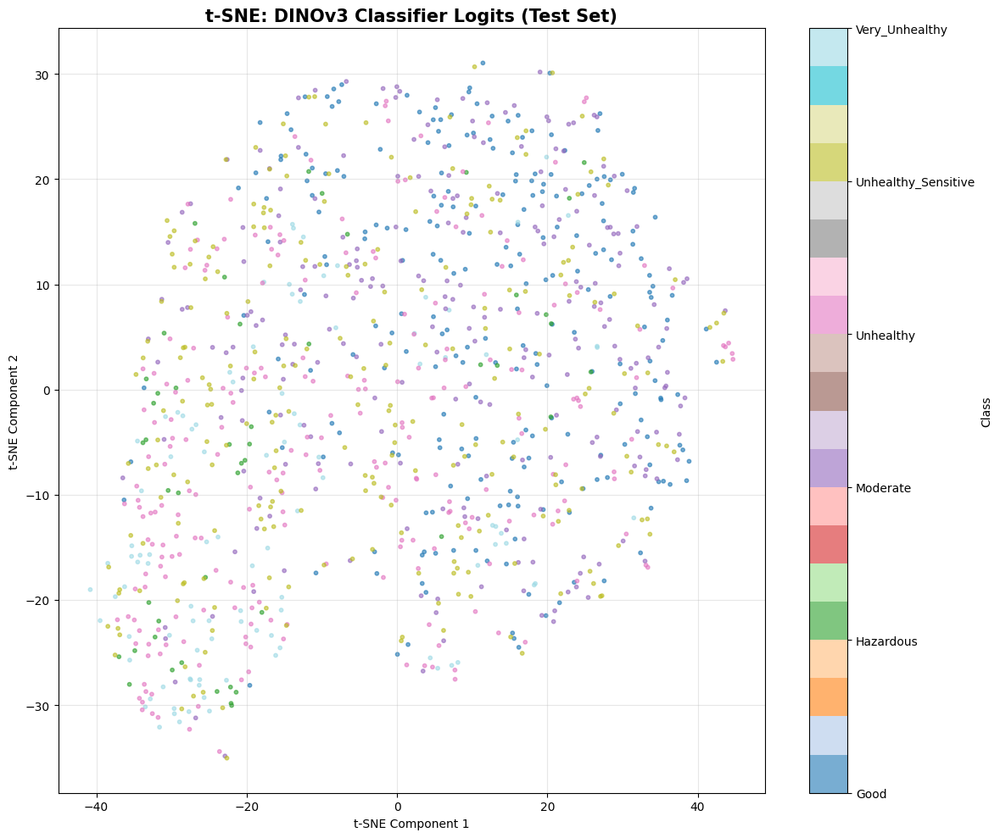


Extracting DINOv3 Backbone Features (768-dim)


Extracting embeddings: 100%|██████████| 35/35 [00:44<00:00,  1.27s/it]
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Backbone embedding shape: (1111, 768)

Running t-SNE with perplexity=30...
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1111 samples in 0.001s...
[t-SNE] Computed neighbors for 1111 samples in 0.234s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1111
[t-SNE] Computed conditional probabilities for sample 1111 / 1111
[t-SNE] Mean sigma: 1.376225
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.004311
[t-SNE] KL divergence after 1000 iterations: 1.179205
Saved: tsne_features_test.png


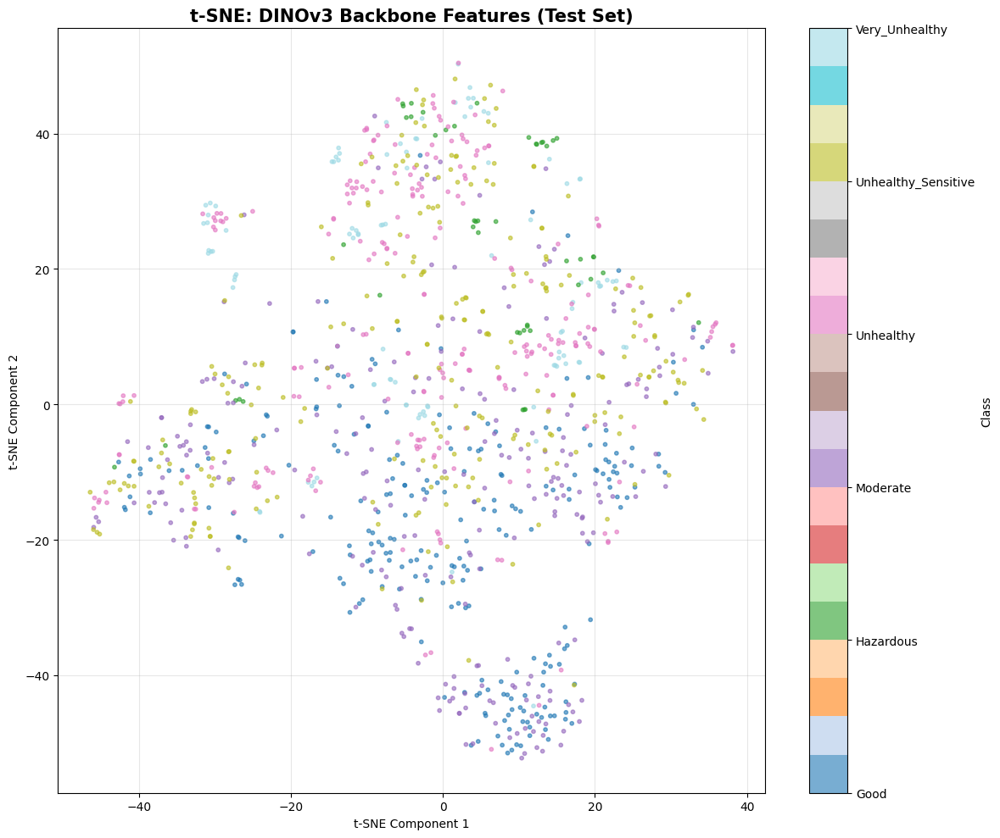


Comparing Different Perplexity Values for DINOv3 Backbone Features


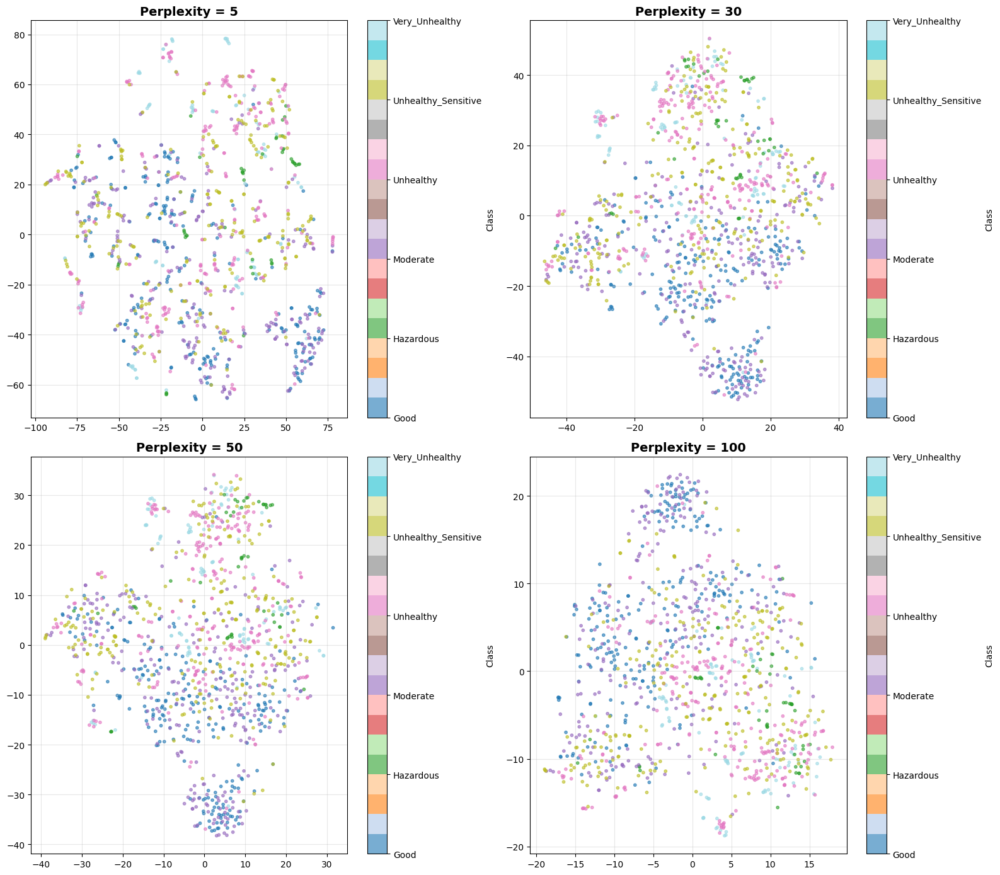


✅ t-SNE analysis complete!


In [17]:
@torch.no_grad()
def extract_embeddings(model, loader, device, use_classifier_output=True):
    
    model.eval()
    all_embeddings = []
    all_labels = []

    for images, labels in tqdm(loader, desc="Extracting embeddings"):
        images = images.to(device)

        if use_classifier_output:
            embeddings = model(images)
        else:
            embeddings = model.get_features(images)

        all_embeddings.append(embeddings.cpu().numpy())
        all_labels.append(labels.numpy())

    embeddings = np.vstack(all_embeddings)
    labels = np.concatenate(all_labels)

    return embeddings, labels

def visualize_tsne(embeddings, labels, title="t-SNE Visualization",
                   perplexity=30, n_iter=1000, random_state=42,
                   figsize=(12, 10), save_path=None, class_names=None):
    

    print(f"\nRunning t-SNE with perplexity={perplexity}...")

    tsne = TSNE(
        n_components=2,
        perplexity=perplexity,
        n_iter=n_iter,
        random_state=random_state,
        verbose=1
    )
    embeddings_2d = tsne.fit_transform(embeddings)


    plt.figure(figsize=figsize)
    scatter = plt.scatter(
        embeddings_2d[:, 0],
        embeddings_2d[:, 1],
        c=labels,
        cmap='tab20',
        alpha=0.6,
        s=10
    )

    if class_names is not None:
        cbar = plt.colorbar(scatter, ticks=np.unique(labels), label='Class')
        cbar.set_ticklabels([class_names[i] for i in np.unique(labels)])
    else:
        plt.colorbar(scatter, label='Class')

    plt.title(title, fontsize=15, fontweight='bold')
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")

    plt.show()

    return embeddings_2d


def run_tsne_analysis(model, loader, device, dataset_name="Test", class_names=None):

    print("\nUsing current DINOv3Classifier model weights.")

    print("\n" + "="*60)
    print(f"Extracting Classification Head Output (Logits, {model.classifier[2].out_features}-dim)")
    print("="*60)

    logits_embeddings, labels = extract_embeddings(
        model, loader, device, use_classifier_output=True
    )

    print("Logits embedding shape:", logits_embeddings.shape)
    print("Labels shape:", labels.shape)

    visualize_tsne(
        logits_embeddings,
        labels,
        title=f"t-SNE: DINOv3 Classifier Logits ({dataset_name} Set)",
        save_path=f"tsne_logits_{dataset_name.lower()}.png",
        class_names=class_names
    )

    print("\n" + "="*60)
    print(f"Extracting DINOv3 Backbone Features ({model.feature_extractor.feature_dim}-dim)")
    print("="*60)

    feature_embeddings, labels = extract_embeddings(
        model, loader, device, use_classifier_output=False
    )

    print("Backbone embedding shape:", feature_embeddings.shape)

    visualize_tsne(
        feature_embeddings,
        labels,
        title=f"t-SNE: DINOv3 Backbone Features ({dataset_name} Set)",
        save_path=f"tsne_features_{dataset_name.lower()}.png",
        class_names=class_names
    )

    return logits_embeddings, feature_embeddings, labels


if __name__ == "__main__":

    sorted_class_names = [idx_to_class[i] for i in sorted(idx_to_class.keys())]

    logits_emb, feature_emb, test_labels = run_tsne_analysis(
        m_model,
        test_loader,
        DEVICE,
        dataset_name="Test",
        class_names=sorted_class_names
    )

    print("\n" + "="*60)
    print("Comparing Different Perplexity Values for DINOv3 Backbone Features")
    print("="*60)

    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    perplexities = [5, 30, 50, 100]

    for idx, perp in enumerate(perplexities):
        ax = axes[idx // 2, idx % 2]

        tsne = TSNE(
            n_components=2,
            perplexity=perp,
            random_state=42
        )

        emb_2d = tsne.fit_transform(feature_emb)

        scatter = ax.scatter(
            emb_2d[:, 0],
            emb_2d[:, 1],
            c=test_labels,
            cmap='tab20',
            alpha=0.6,
            s=10
        )

        ax.set_title(f"Perplexity = {perp}", fontsize=14, fontweight='bold')
        ax.grid(True, alpha=0.3)

        if sorted_class_names is not None:
            cbar = plt.colorbar(scatter, ax=ax, ticks=np.unique(test_labels), label='Class')
            cbar.set_ticklabels([sorted_class_names[i] for i in np.unique(test_labels)])

    plt.tight_layout()
    plt.savefig("tsne_perplexity_comparison_dinov2_features.png", dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✅ t-SNE analysis complete!")


This function switches the model to evaluation mode and iterates through the dataloader without tracking gradients, extracting DINOv2 backbone feature embeddings using model.get_features() for each batch. It collects all feature vectors and labels, moves them to CPU, converts them to NumPy arrays, concatenates everything into full dataset-level arrays, and returns the final (features, labels) pair.

In [18]:
def extract_features(model, dataloader, device):
    model.eval()
    all_features = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Extracting features"):
            images = images.to(device)

            feats = model.get_features(images)
            all_features.append(feats.cpu().numpy())
            all_labels.append(labels.numpy())

    all_features = np.concatenate(all_features, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    return all_features, all_labels


This block turns the DINOv2 model into a feature extractor and then trains classic machine-learning classifiers on those extracted embeddings. It first extracts backbone features for the train and validation sets, standardizes them with StandardScaler, and optionally compresses them with PCA to 512 dimensions. After that, it trains and evaluates four classifiers—MLP, linear SVM, Decision Tree, and Random Forest—on the reduced features and prints each model’s validation accuracy.

In [19]:
train_X, train_y = extract_features(m_model, train_loader, DEVICE)
val_X, val_y = extract_features(m_model, val_loader, DEVICE)
test_X, test_y = extract_features(m_model, test_loader, DEVICE)


X_all = np.concatenate([train_X, val_X, test_X], axis=0)
y_all = np.concatenate([train_y, val_y, test_y], axis=0)

split_ratios = [(90,10),(80,20),(70,30),(60,40),(50,50),(40,60),(30,70),(20,80),(10,90)]

for tr, te in split_ratios:

    print("\n" + "="*80)
    print(f"SPLIT RATIO: {tr}:{te}")
    print("="*80)

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_all,
        y_all,
        test_size=te / 100,
        stratify=y_all,
        random_state=42
    )

    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_te = scaler.transform(X_te)

    pca = PCA(n_components=512)
    X_tr = pca.fit_transform(X_tr)
    X_te = pca.transform(X_te)

    classifiers = {
        "MLP": MLPClassifier(
            hidden_layer_sizes=(1024, 512, 256),
            activation='relu',
            solver='adam',
            learning_rate_init=0.0001,
            max_iter=1000,
            random_state=42,
            verbose=False
        ),
        "SVM": SVC(kernel="linear", probability=True),
        "Decision Tree": DecisionTreeClassifier(),
        "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42)
    }

    for name, model in classifiers.items():
        model.fit(X_tr, y_tr)
        preds = model.predict(X_te)

        acc = accuracy_score(y_te, preds)
        print(f"\n{name} Accuracy ({tr}:{te}): {acc * 100:.2f}%")

        print("Classification Report:")
        print(classification_report(
            y_te,
            preds,
            target_names=[idx_to_class[i] for i in range(NUM_CLASSES)],
            digits=3
        ))


Extracting features: 100%|██████████| 35/35 [00:45<00:00,  1.29s/it]



SPLIT RATIO: 90:10

MLP Accuracy (90:10): 70.39%
Classification Report:
                     precision    recall  f1-score   support

               Good      0.667     0.672     0.669       241
          Hazardous      0.830     0.812     0.821        48
           Moderate      0.559     0.527     0.543       241
          Unhealthy      0.811     0.838     0.824       241
Unhealthy_Sensitive      0.671     0.682     0.676       239
     Very_Unhealthy      0.873     0.881     0.877       101

           accuracy                          0.704      1111
          macro avg      0.735     0.736     0.735      1111
       weighted avg      0.701     0.704     0.702      1111


SVM Accuracy (90:10): 59.68%
Classification Report:
                     precision    recall  f1-score   support

               Good      0.576     0.664     0.617       241
          Hazardous      0.692     0.750     0.720        48
           Moderate      0.457     0.469     0.463       241
          Unheal

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


This block generates multi-class ROC curves for each trained classifier (MLP, SVM, Decision Tree, Random Forest) using the validation set. For each model, it obtains class-wise probability scores (via predict_proba() when available, otherwise converting the SVM decision scores to probabilities with softmax), binarizes the true labels using one-vs-rest encoding, and then computes and plots an ROC curve and AUC for every class with the class names shown in the legend.


ROC CURVE — SPLIT 90:10

ROC Curve for MLP — Split 90:10


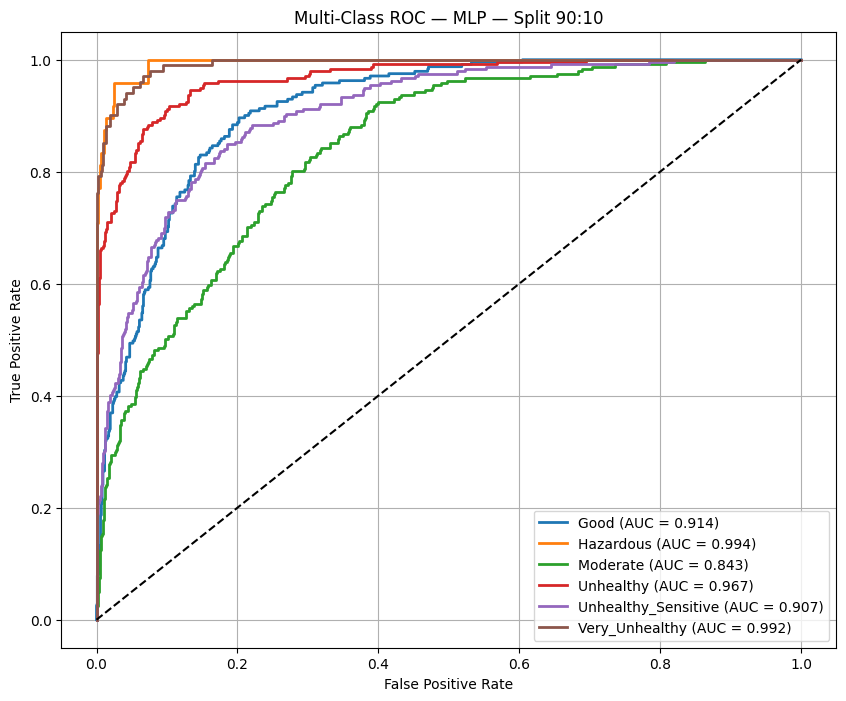


ROC Curve for SVM — Split 90:10


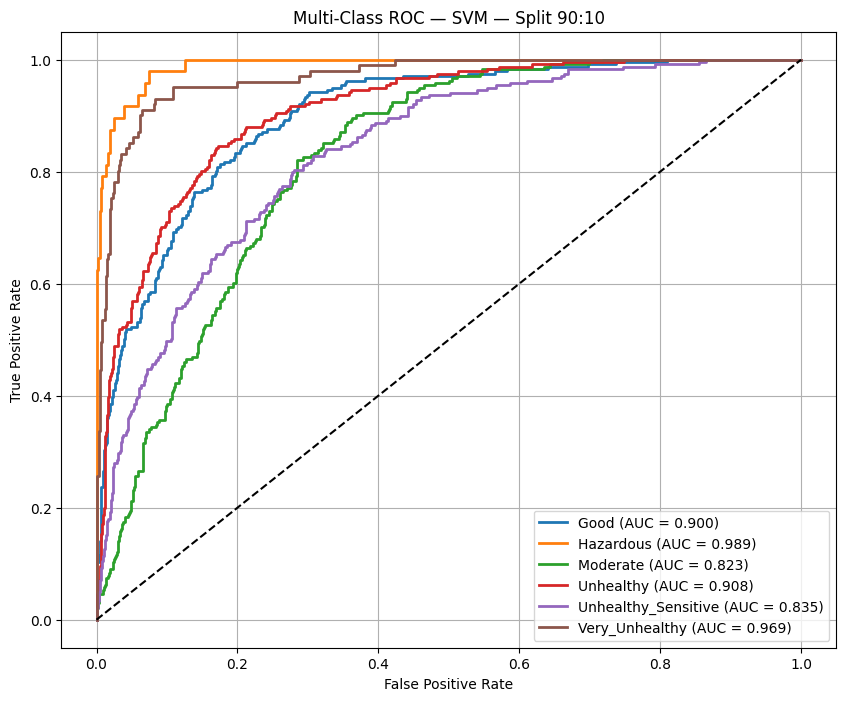


ROC Curve for DecisionTree — Split 90:10


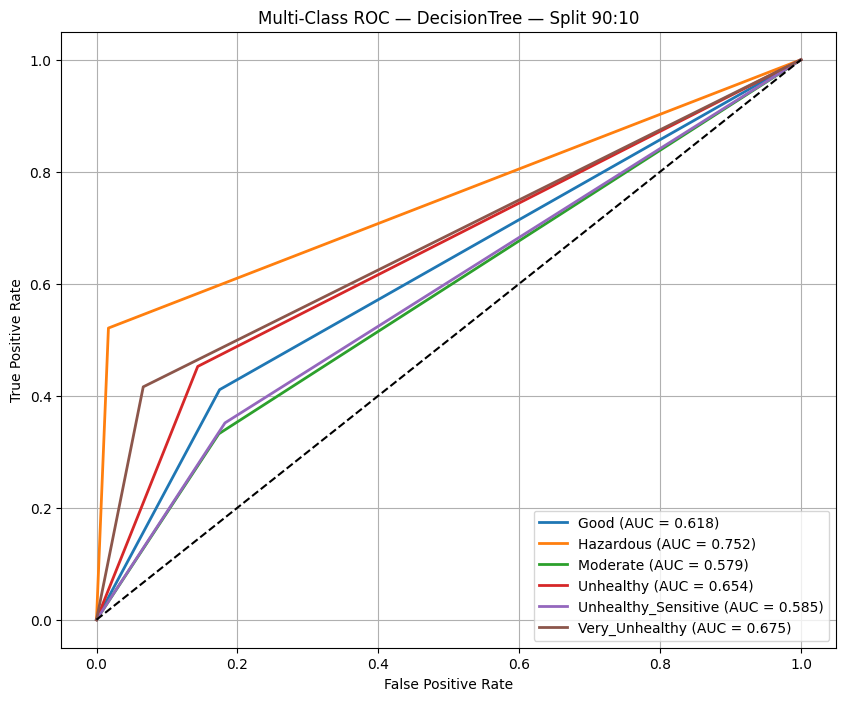


ROC Curve for RandomForest — Split 90:10


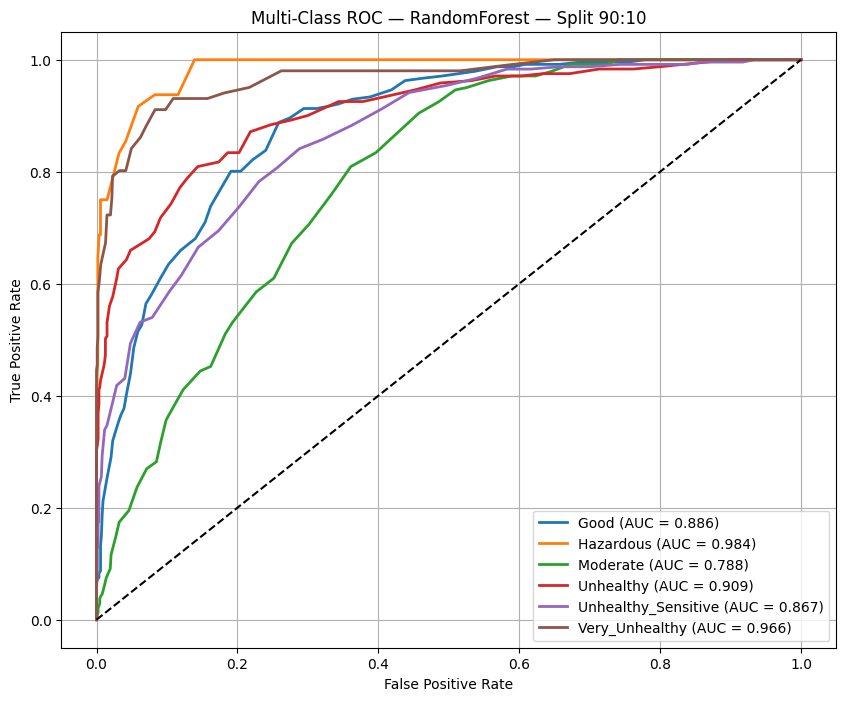


ROC CURVE — SPLIT 80:20

ROC Curve for MLP — Split 80:20


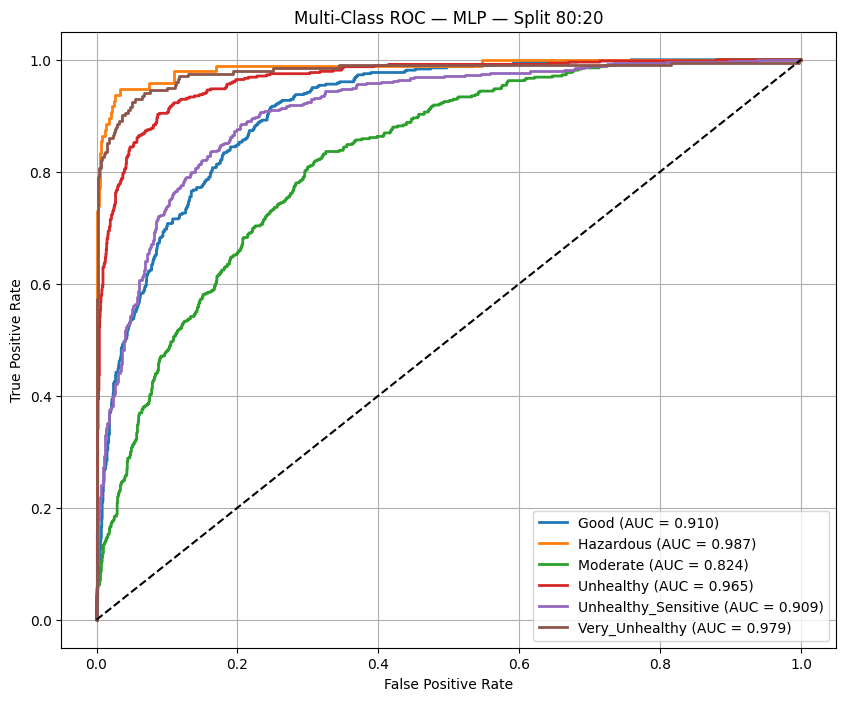


ROC Curve for SVM — Split 80:20


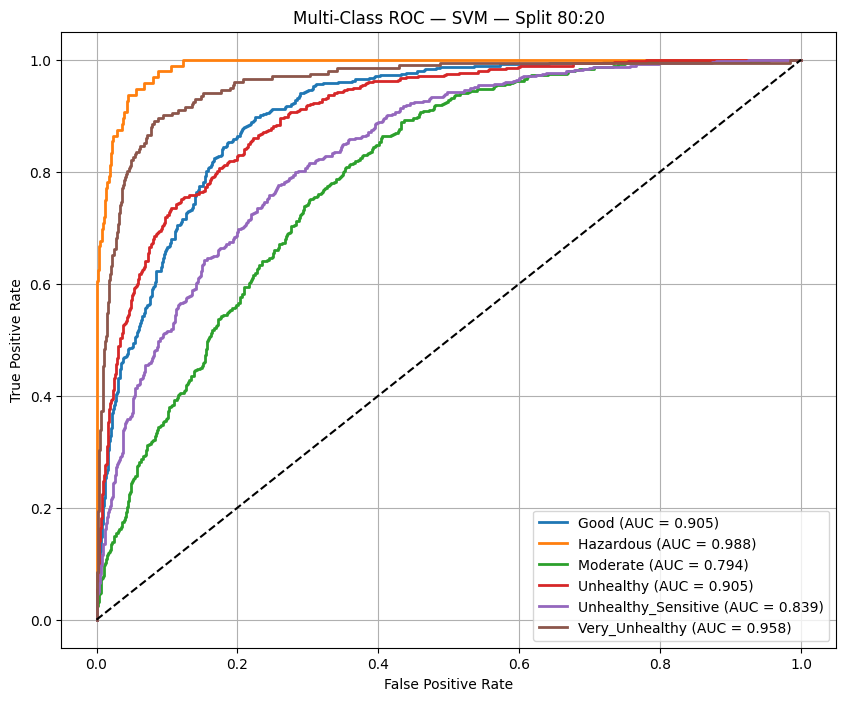


ROC Curve for DecisionTree — Split 80:20


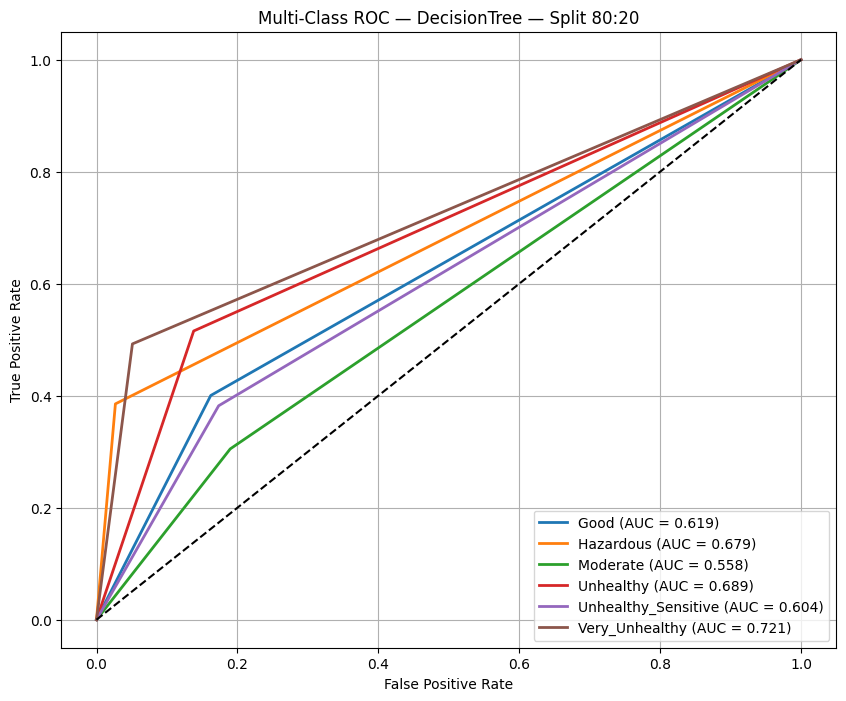


ROC Curve for RandomForest — Split 80:20


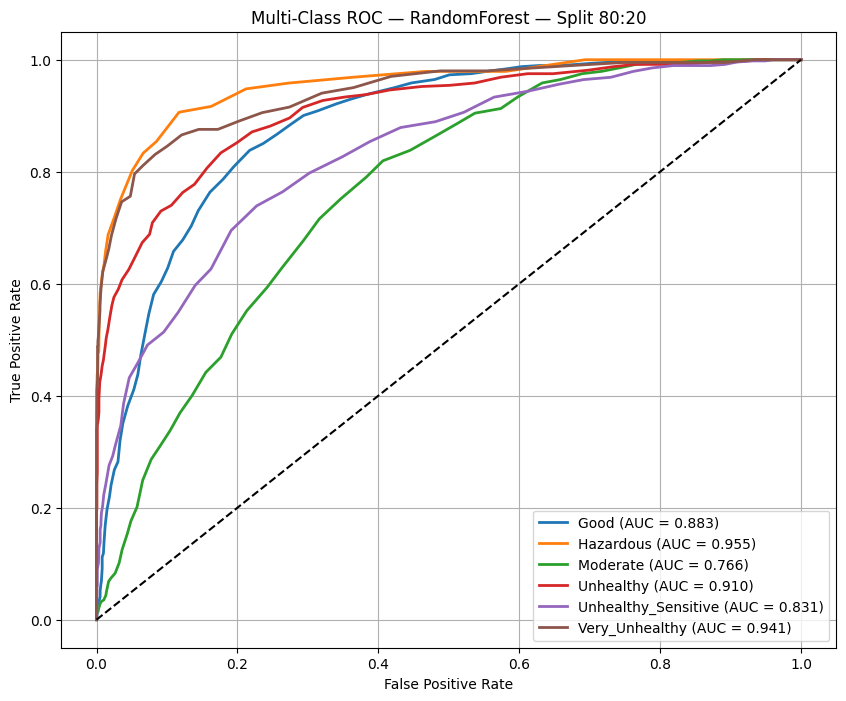


ROC CURVE — SPLIT 70:30

ROC Curve for MLP — Split 70:30


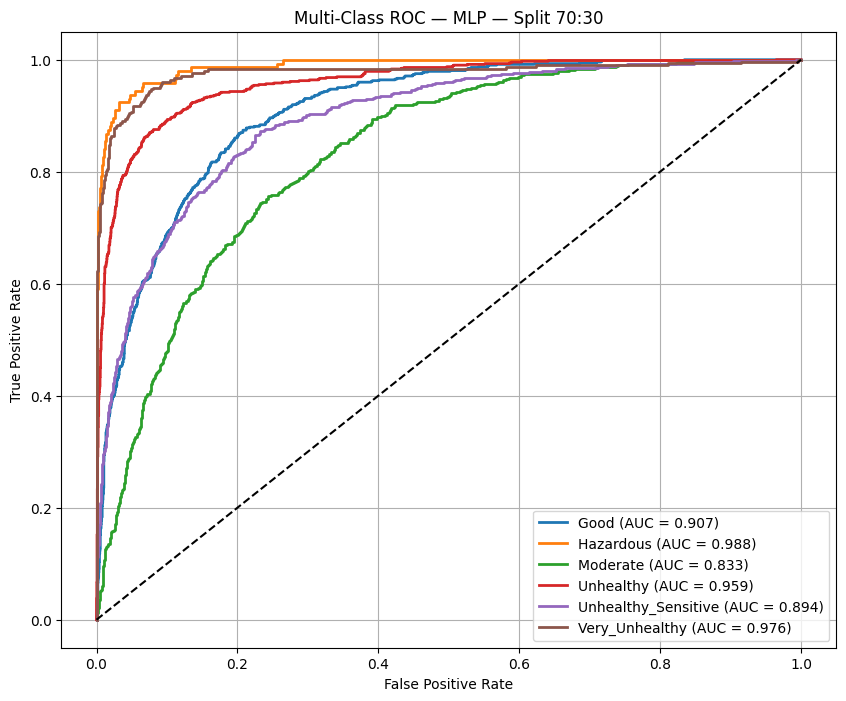


ROC Curve for SVM — Split 70:30


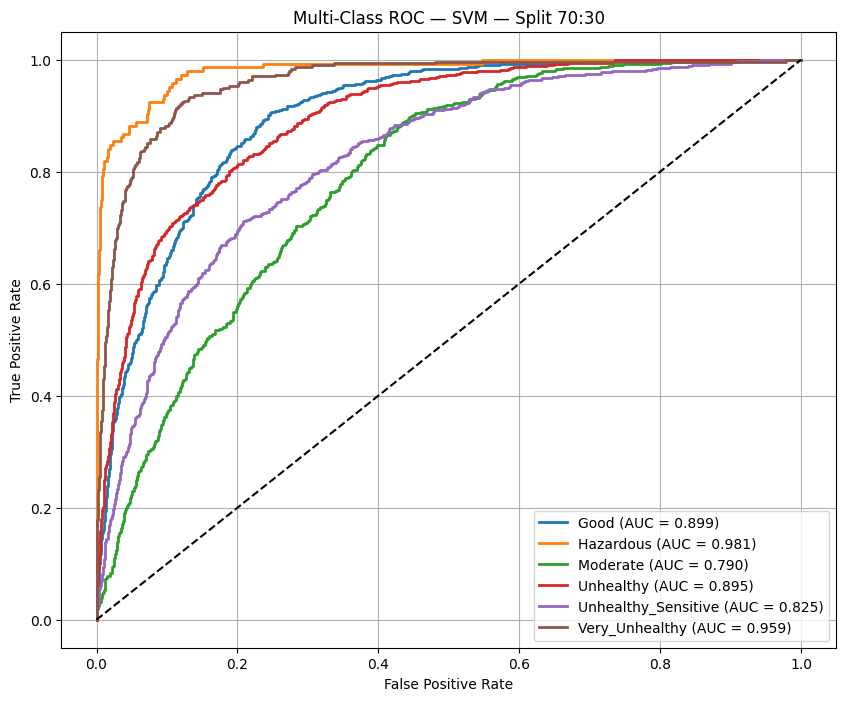


ROC Curve for DecisionTree — Split 70:30


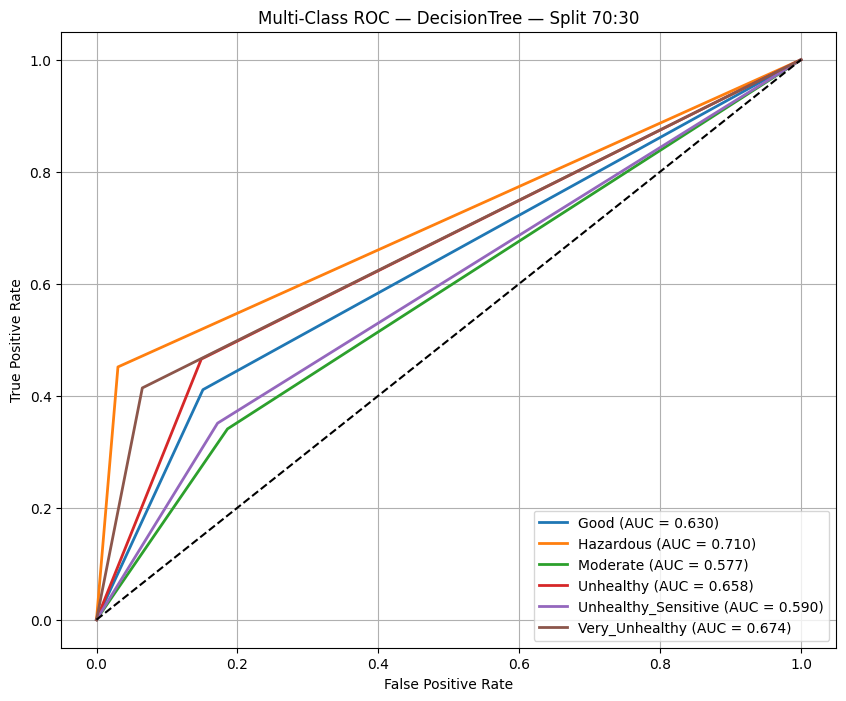


ROC Curve for RandomForest — Split 70:30


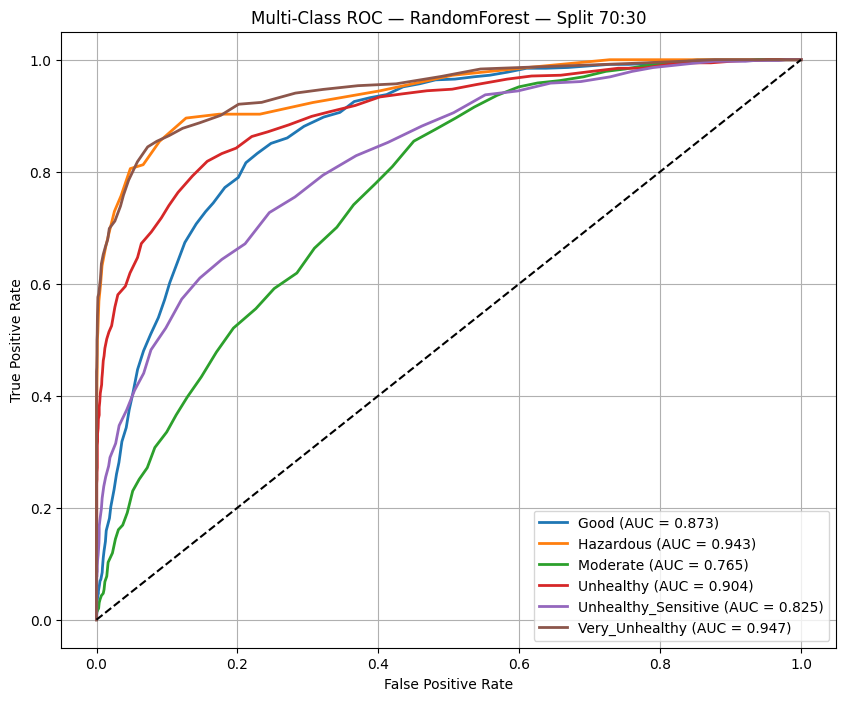


ROC CURVE — SPLIT 60:40

ROC Curve for MLP — Split 60:40


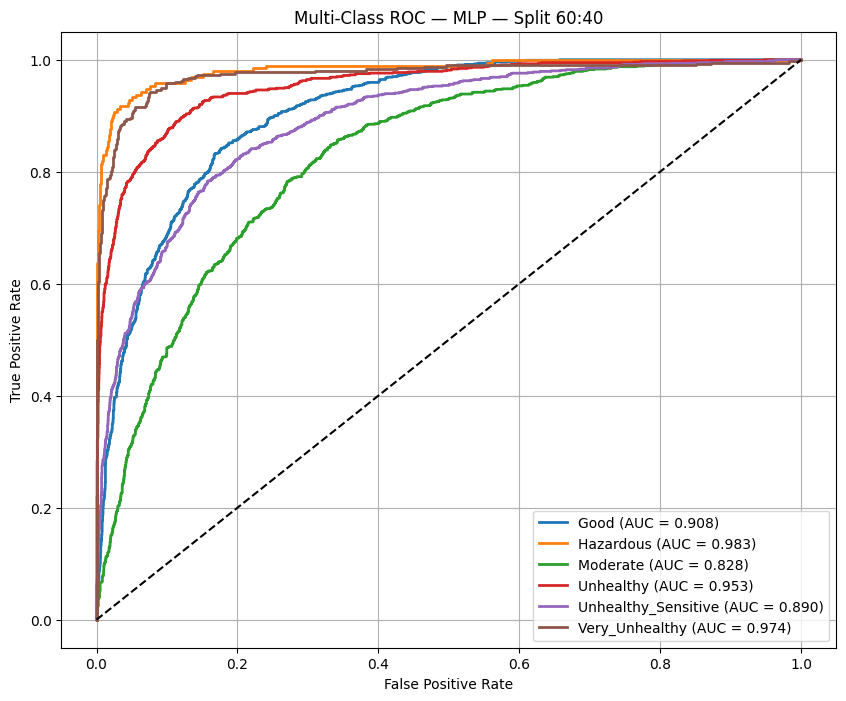


ROC Curve for SVM — Split 60:40


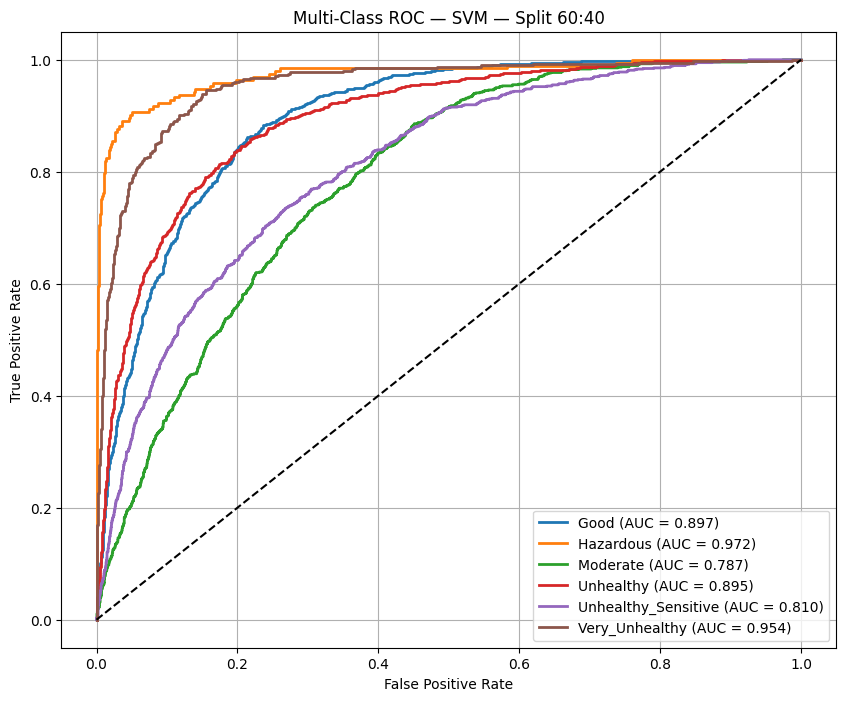


ROC Curve for DecisionTree — Split 60:40


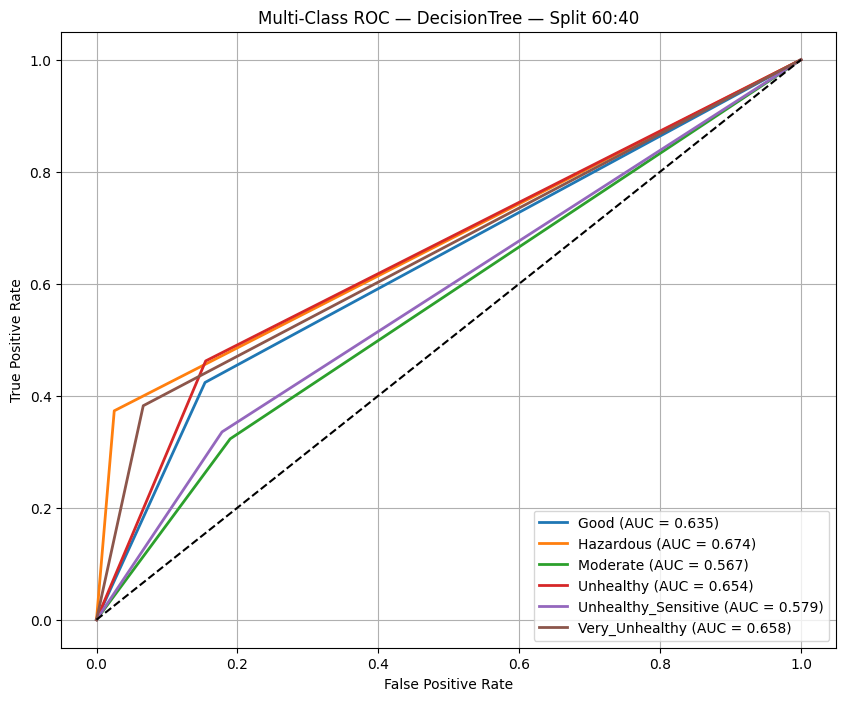


ROC Curve for RandomForest — Split 60:40


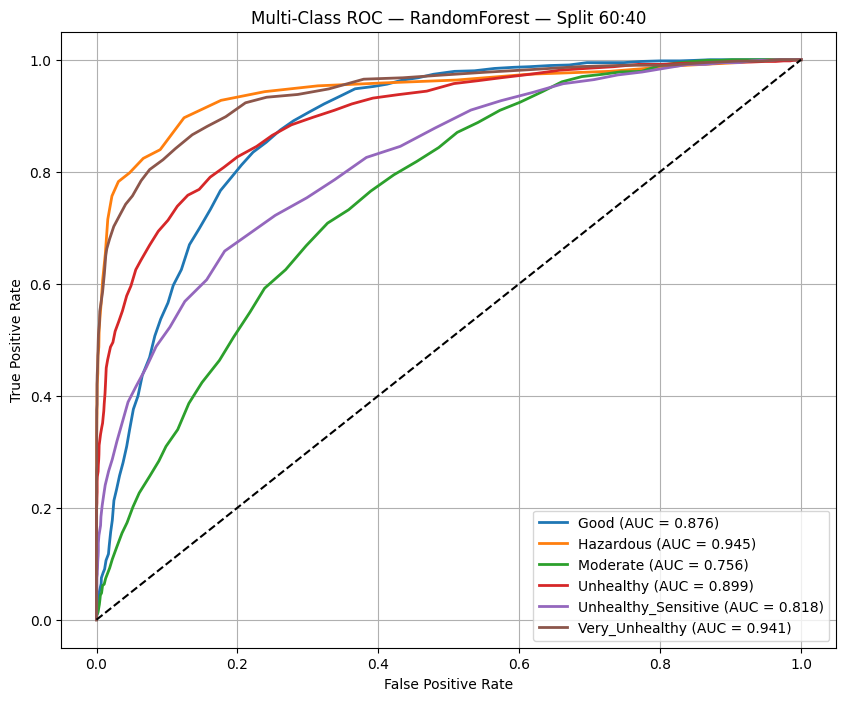


ROC CURVE — SPLIT 50:50

ROC Curve for MLP — Split 50:50


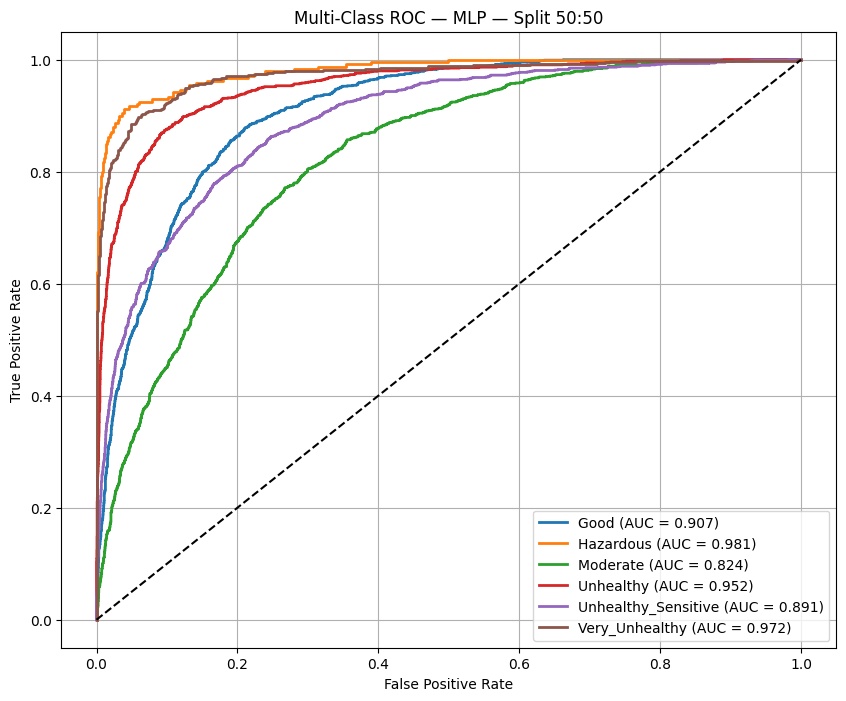


ROC Curve for SVM — Split 50:50


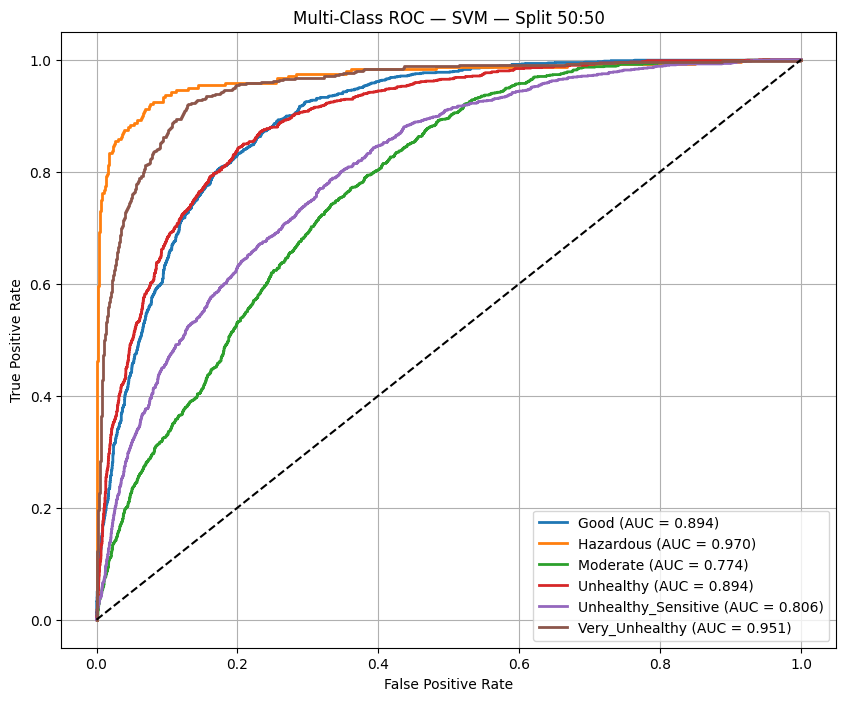


ROC Curve for DecisionTree — Split 50:50


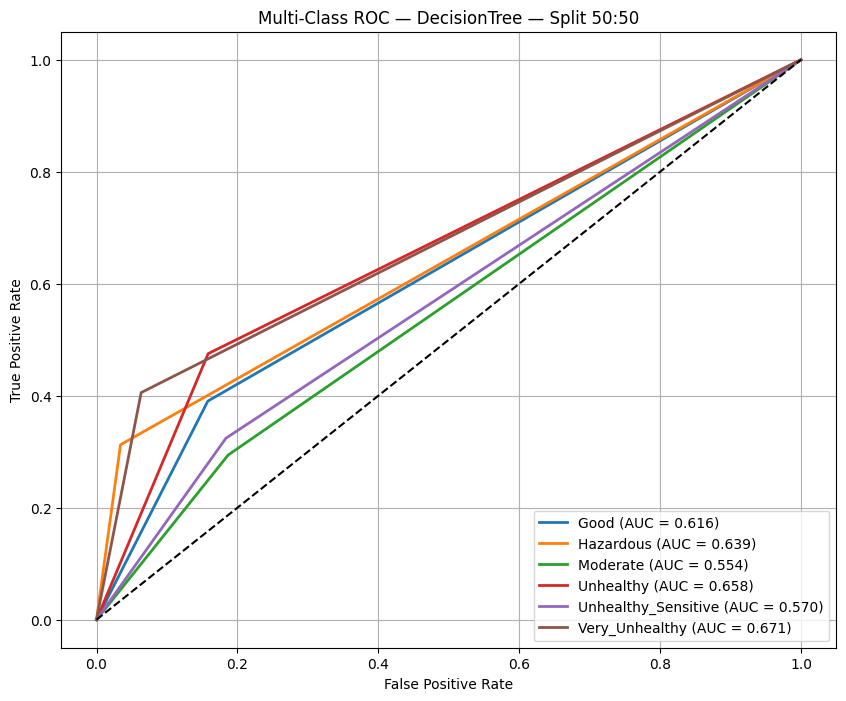


ROC Curve for RandomForest — Split 50:50


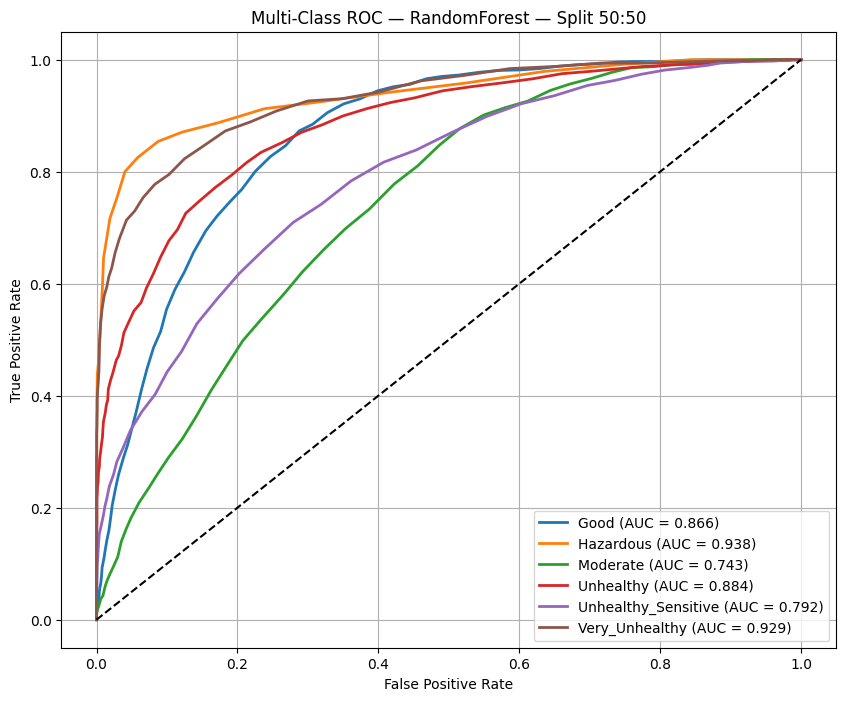


ROC CURVE — SPLIT 40:60

ROC Curve for MLP — Split 40:60


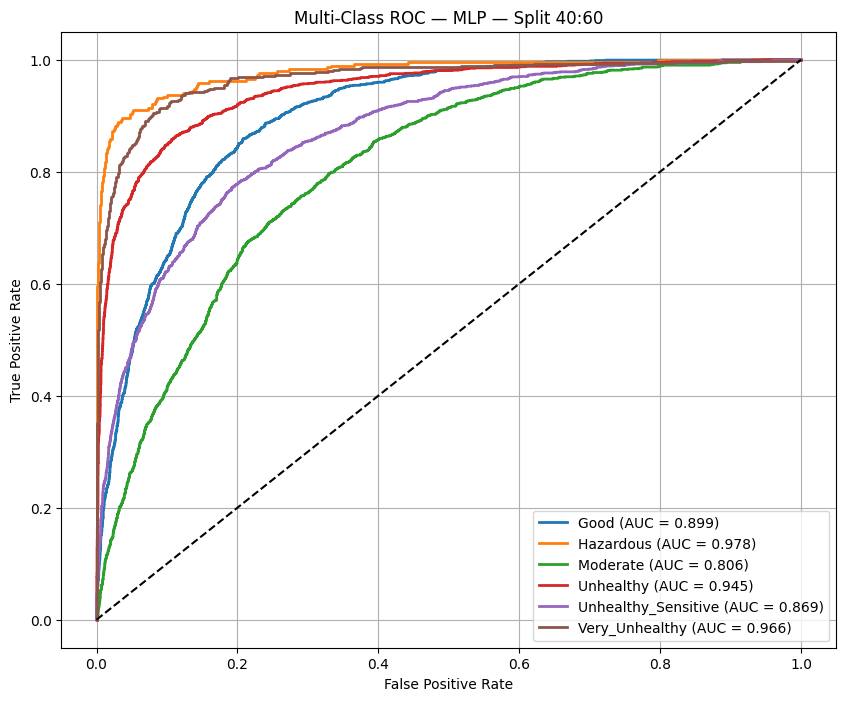


ROC Curve for SVM — Split 40:60


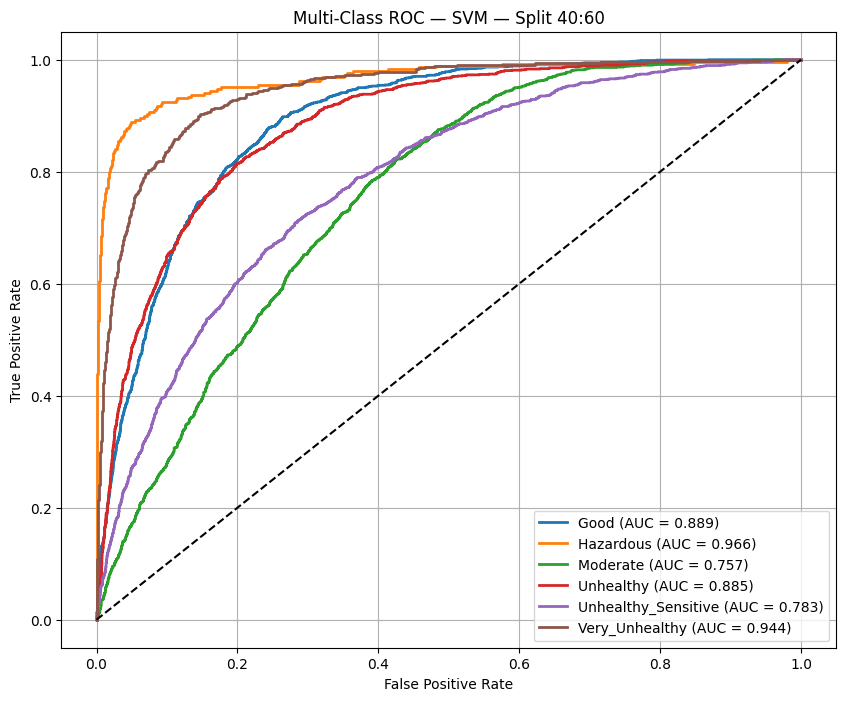


ROC Curve for DecisionTree — Split 40:60


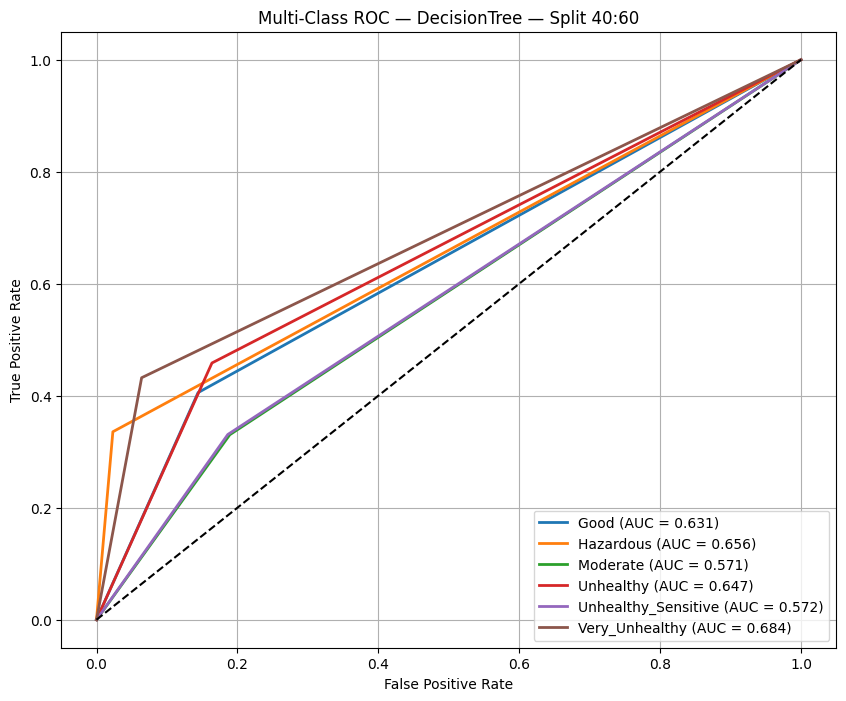


ROC Curve for RandomForest — Split 40:60


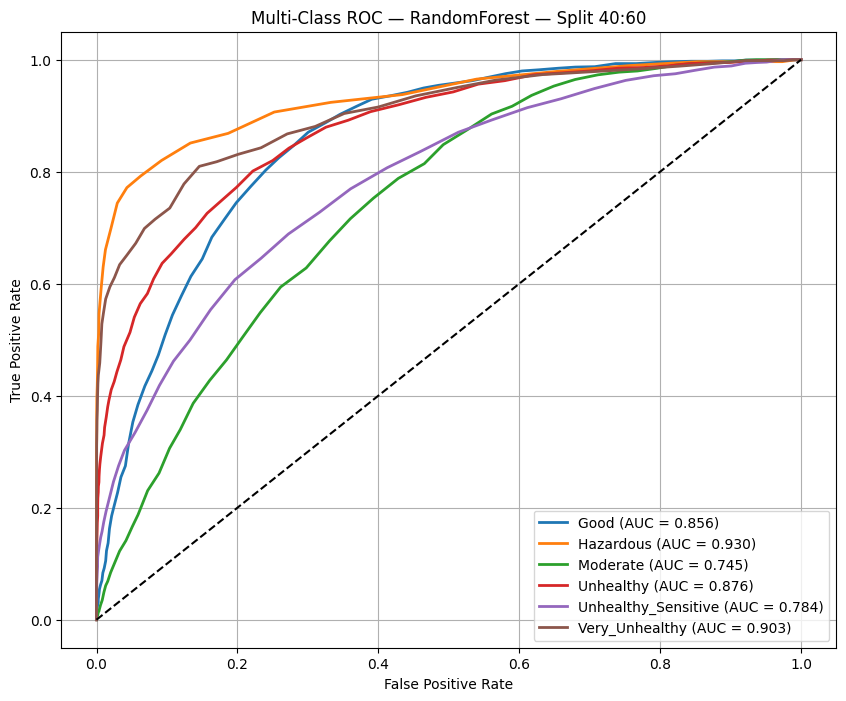


ROC CURVE — SPLIT 30:70

ROC Curve for MLP — Split 30:70


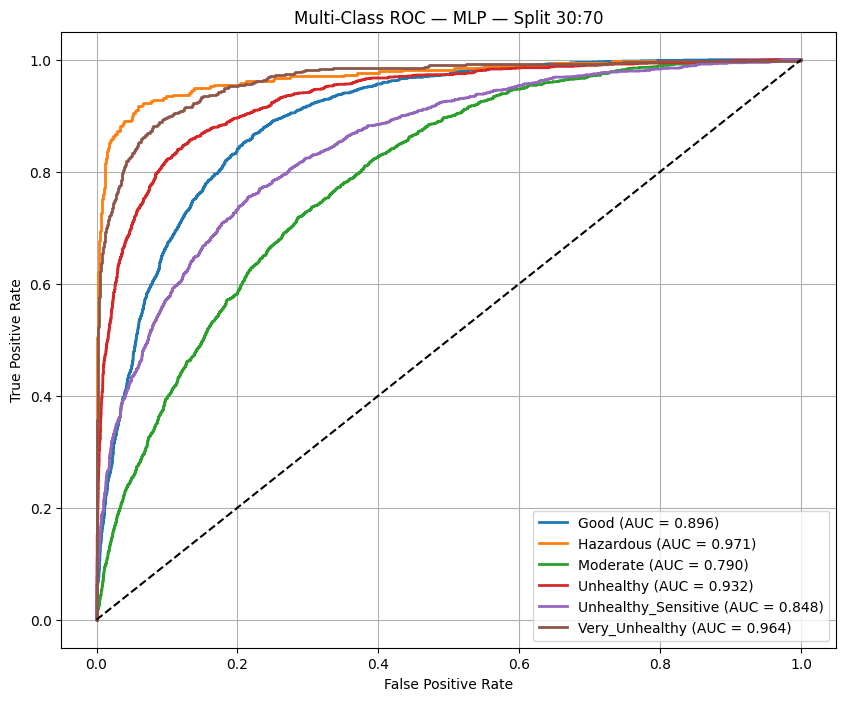


ROC Curve for SVM — Split 30:70


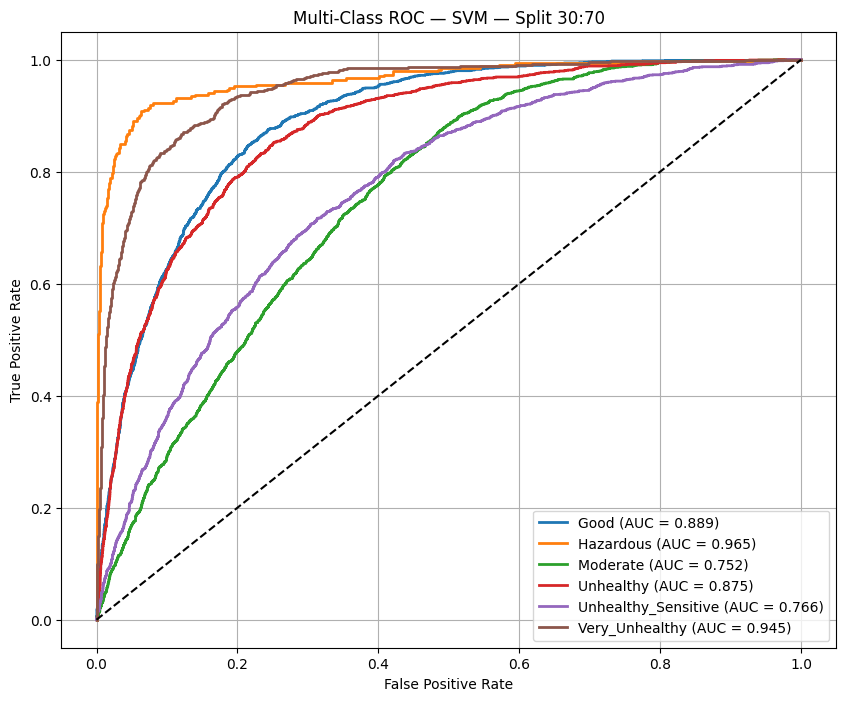


ROC Curve for DecisionTree — Split 30:70


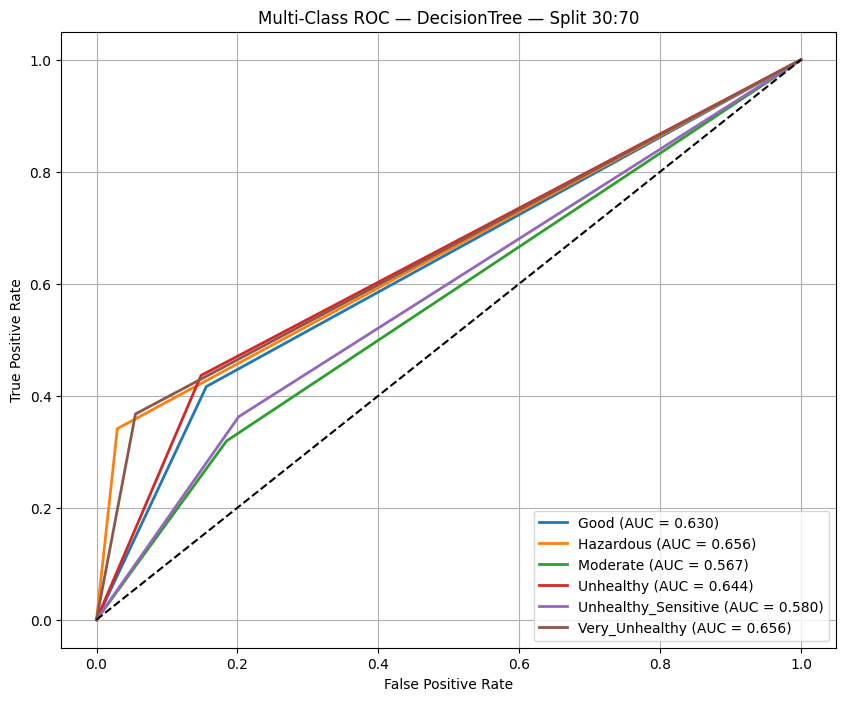


ROC Curve for RandomForest — Split 30:70


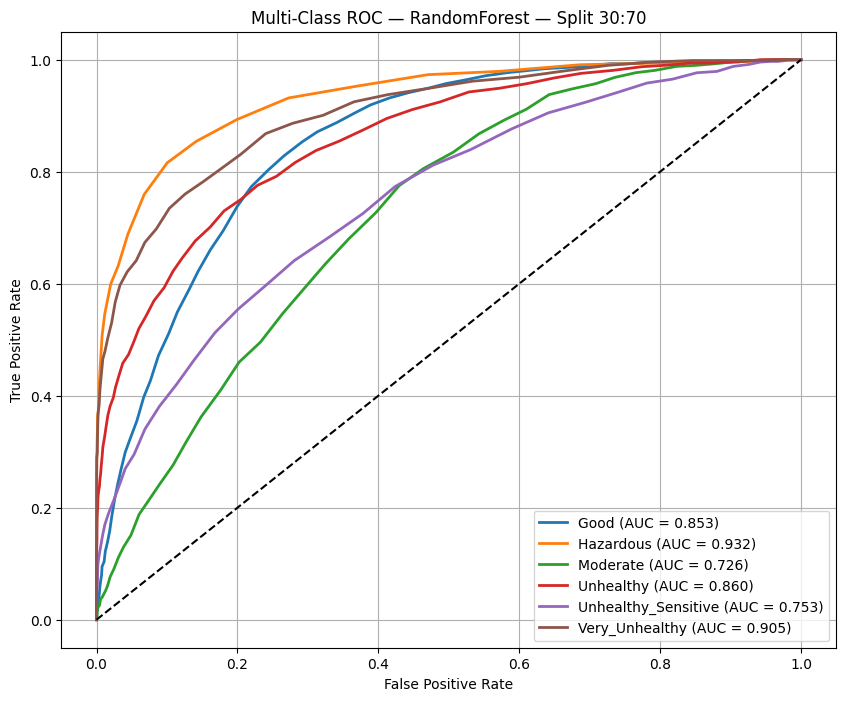


ROC CURVE — SPLIT 20:80

ROC Curve for MLP — Split 20:80


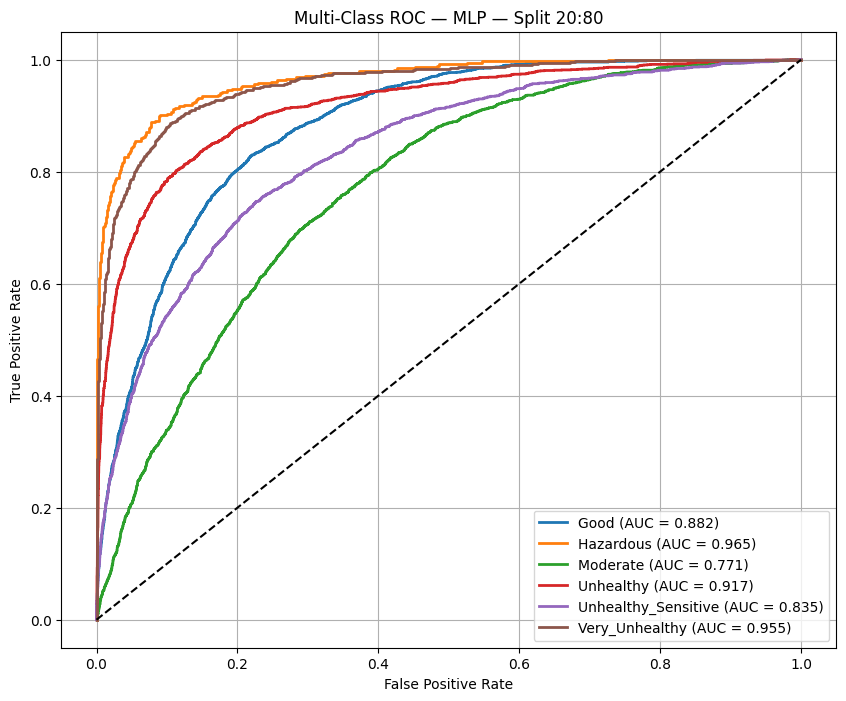


ROC Curve for SVM — Split 20:80


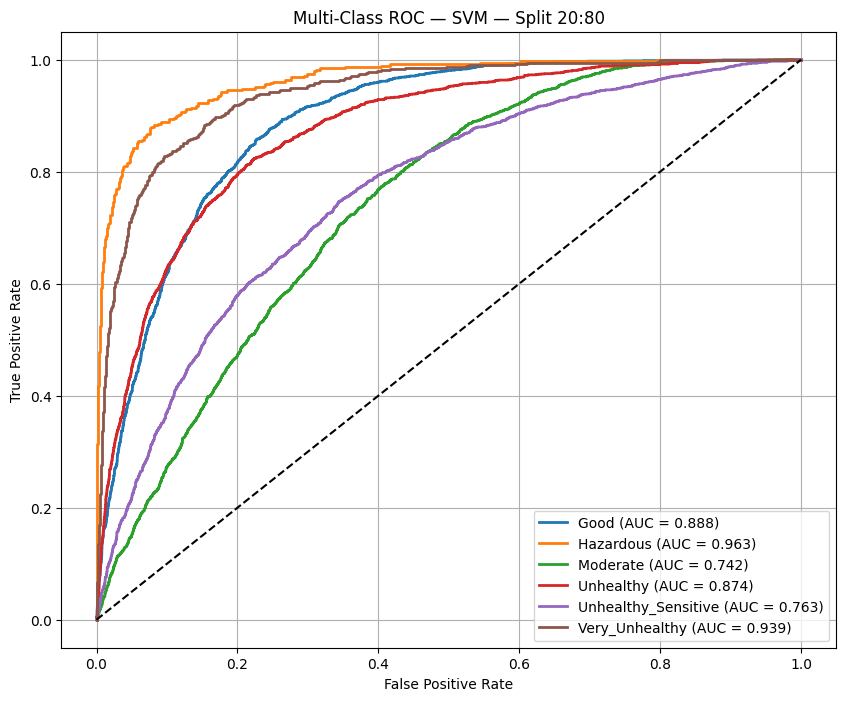


ROC Curve for DecisionTree — Split 20:80


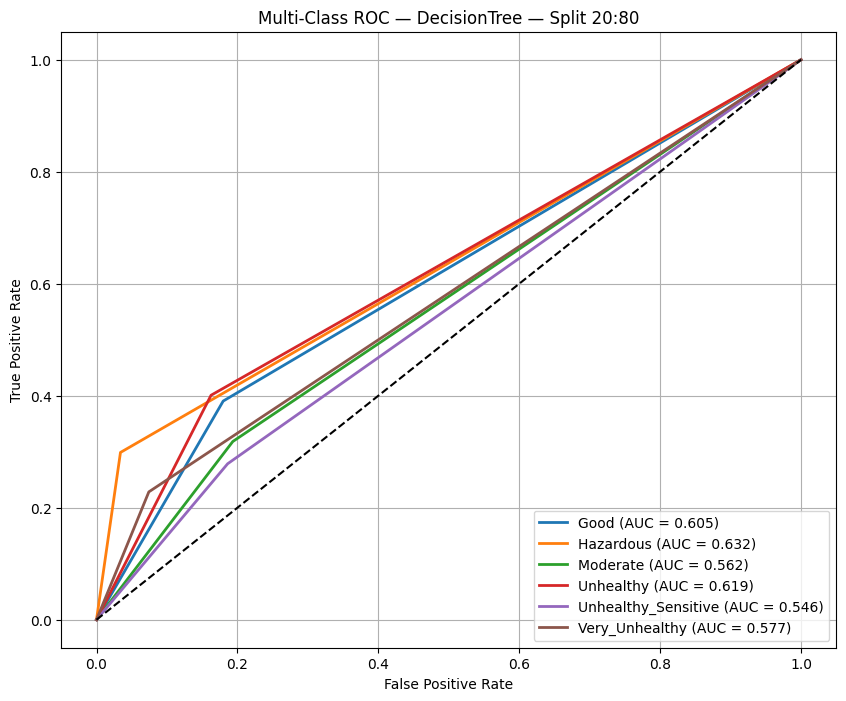


ROC Curve for RandomForest — Split 20:80


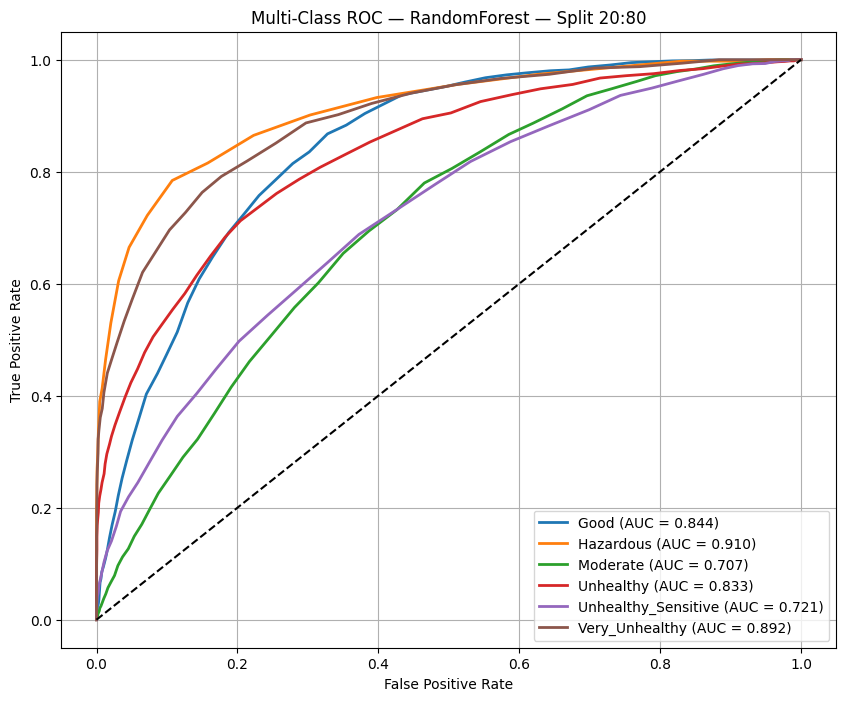


ROC CURVE — SPLIT 10:90

ROC Curve for MLP — Split 10:90


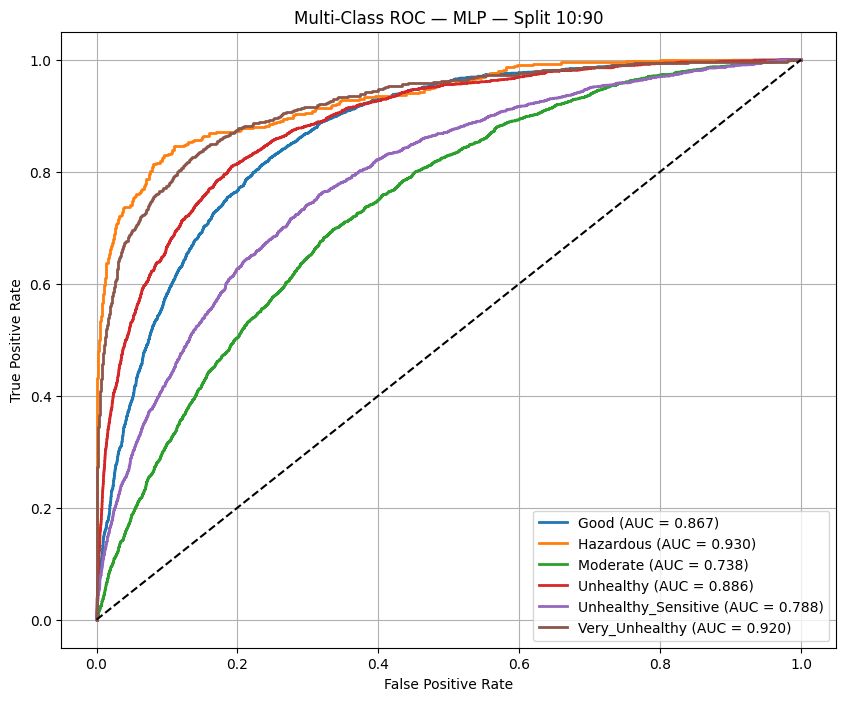


ROC Curve for SVM — Split 10:90


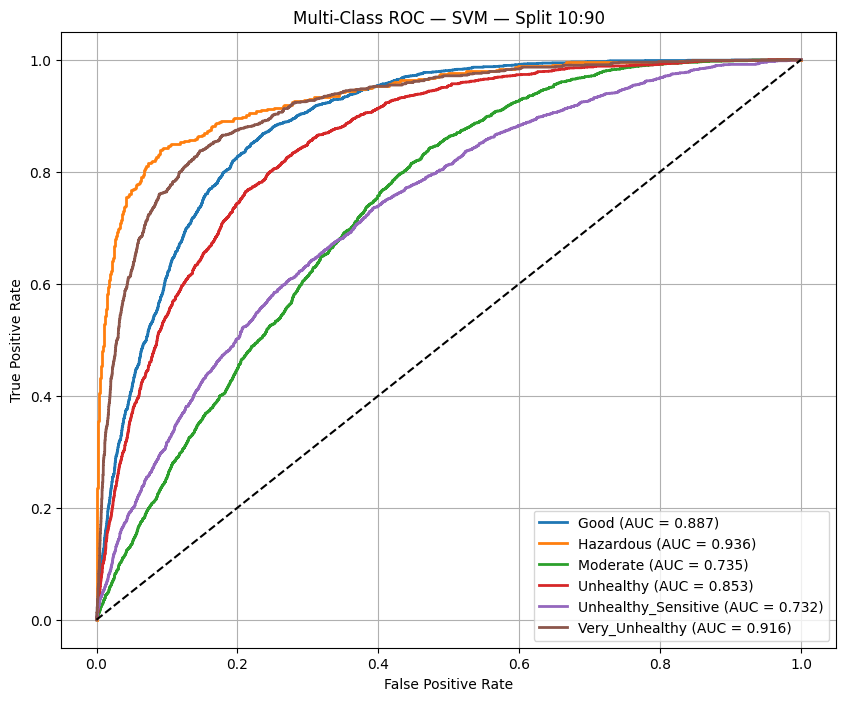


ROC Curve for DecisionTree — Split 10:90


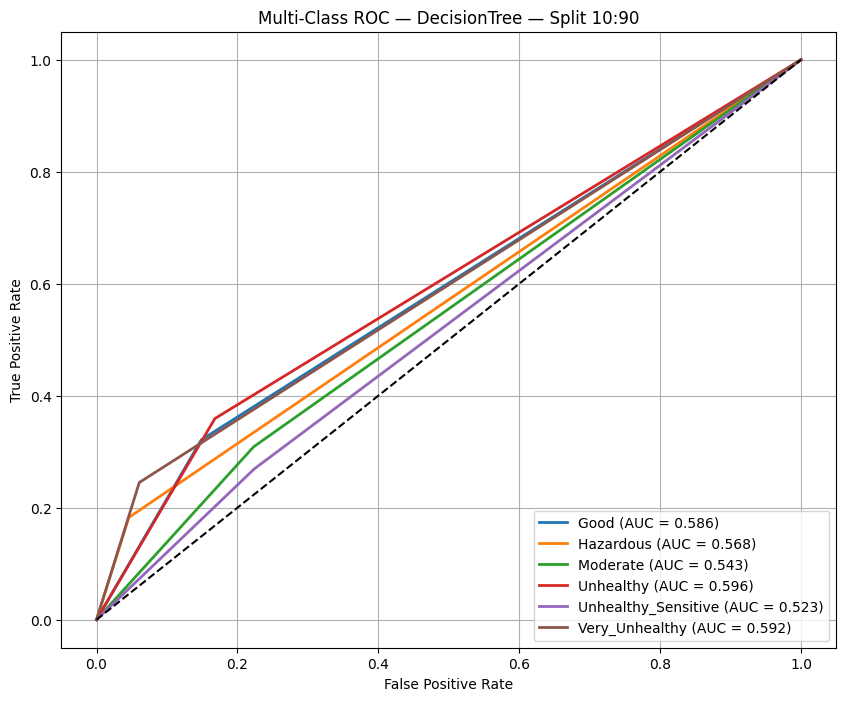


ROC Curve for RandomForest — Split 10:90


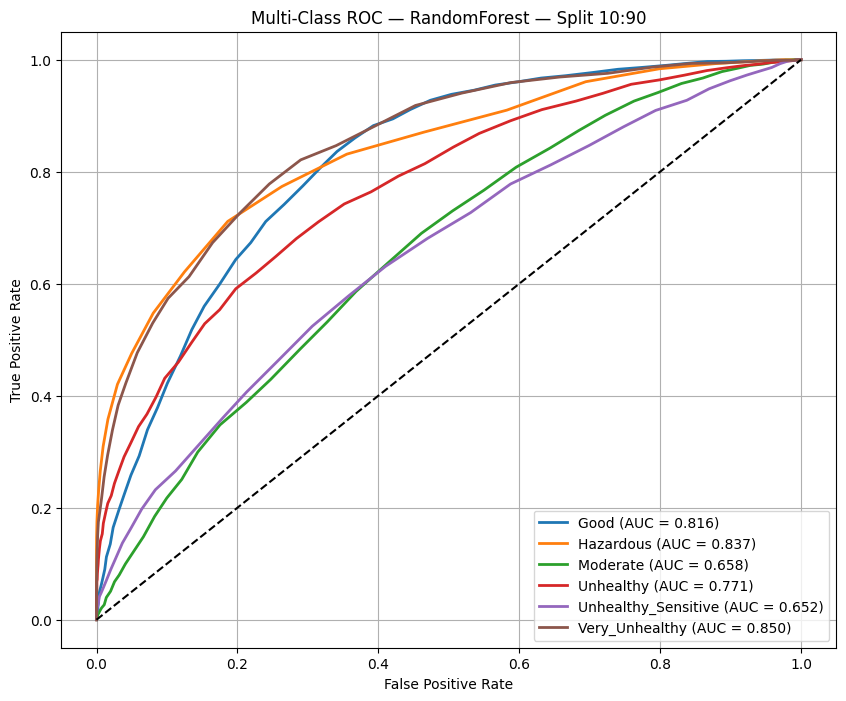

In [20]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from scipy.special import softmax
import matplotlib.pyplot as plt
import numpy as np

split_ratios = [(90,10),(80,20),(70,30),(60,40),(50,50),(40,60),(30,70),(20,80),(10,90)]

for tr, te in split_ratios:

    print("\n" + "="*90)
    print(f"ROC CURVE — SPLIT {tr}:{te}")
    print("="*90)

    # Make split for this ratio (must exist)
    X_tr, X_te, y_tr, y_te = train_test_split(
        X_all, y_all,
        test_size=te / 100,
        stratify=y_all,
        random_state=42
    )

    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_te = scaler.transform(X_te)

    pca = PCA(n_components=512)
    X_tr = pca.fit_transform(X_tr)
    X_te = pca.transform(X_te)

    classifiers = {
        "MLP": MLPClassifier(
            hidden_layer_sizes=(1024, 512, 256),
            activation='relu',
            solver='adam',
            learning_rate_init=0.0001,
            max_iter=1000,
            random_state=42
        ),
        "SVM": SVC(kernel="linear", probability=True),
        "DecisionTree": DecisionTreeClassifier(),
        "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42)
    }

    y_bin = label_binarize(y_te, classes=list(range(NUM_CLASSES)))

    for name, model in classifiers.items():

        print(f"\n======================")
        print(f"ROC Curve for {name} — Split {tr}:{te}")
        print(f"======================")

        model.fit(X_tr, y_tr)

        if hasattr(model, "predict_proba"):
            probs = model.predict_proba(X_te)
        else:
            probs = softmax(model.decision_function(X_te), axis=1)

        plt.figure(figsize=(10, 8))
        for i in range(NUM_CLASSES):
            fpr, tpr, _ = roc_curve(y_bin[:, i], probs[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, lw=2, label=f"{idx_to_class[i]} (AUC = {roc_auc:.3f})")

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"Multi-Class ROC — {name} — Split {tr}:{te}")
        plt.legend(loc="lower right")
        plt.grid(True)
        plt.show()

This block evaluates each trained classifier (MLP, SVM, Decision Tree, Random Forest) on the validation set by generating predictions, computing overall accuracy, and calculating per-class accuracy by filtering validation samples class-wise. It then prints a detailed classification_report (precision/recall/F1 per class) and visualizes the confusion matrix for each model using a Seaborn heatmap with class names on both axes.


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 90:10

------------------------------
MLP — Split 90:10
------------------------------
Accuracy (MLP) — Split 90:10: 70.39%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.667     0.672     0.669       241
          Hazardous      0.830     0.812     0.821        48
           Moderate      0.559     0.527     0.543       241
          Unhealthy      0.811     0.838     0.824       241
Unhealthy_Sensitive      0.671     0.682     0.676       239
     Very_Unhealthy      0.873     0.881     0.877       101

           accuracy                          0.704      1111
          macro avg      0.735     0.736     0.735      1111
       weighted avg      0.701     0.704     0.702      1111



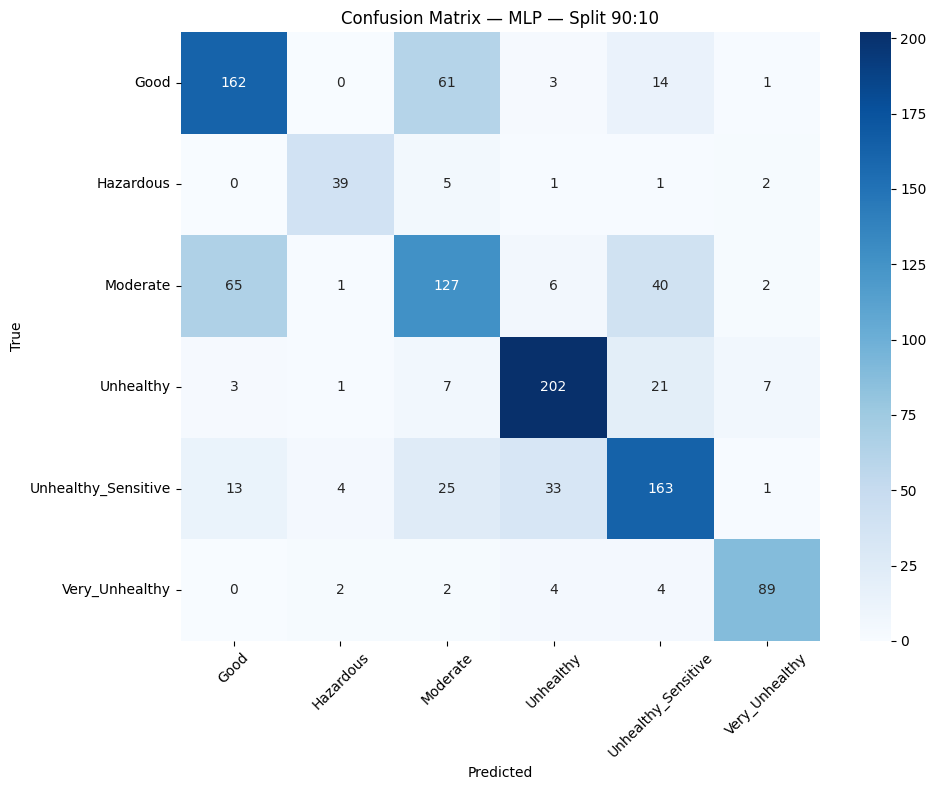


------------------------------
SVM — Split 90:10
------------------------------
Accuracy (SVM) — Split 90:10: 59.68%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.576     0.664     0.617       241
          Hazardous      0.692     0.750     0.720        48
           Moderate      0.457     0.469     0.463       241
          Unhealthy      0.676     0.693     0.684       241
Unhealthy_Sensitive      0.587     0.481     0.529       239
     Very_Unhealthy      0.791     0.713     0.750       101

           accuracy                          0.597      1111
          macro avg      0.630     0.628     0.627      1111
       weighted avg      0.599     0.597     0.596      1111



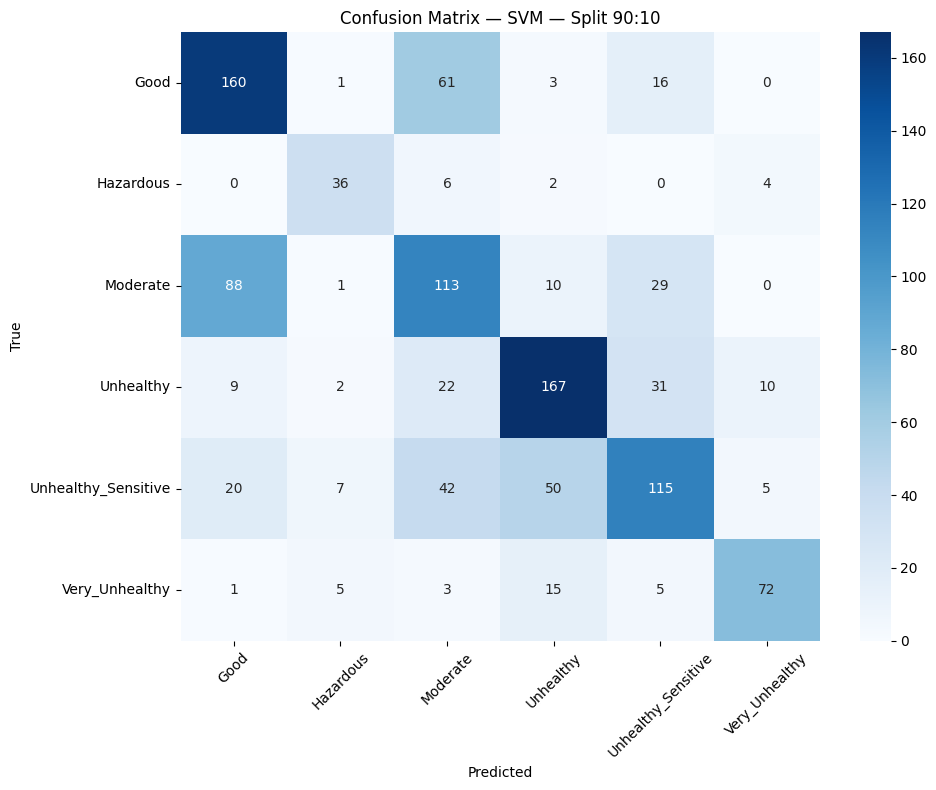


------------------------------
DecisionTree — Split 90:10
------------------------------
Accuracy (DecisionTree) — Split 90:10: 40.23%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.404     0.378     0.391       241
          Hazardous      0.605     0.542     0.571        48
           Moderate      0.328     0.332     0.330       241
          Unhealthy      0.473     0.473     0.473       241
Unhealthy_Sensitive      0.371     0.372     0.372       239
     Very_Unhealthy      0.398     0.465     0.429       101

           accuracy                          0.402      1111
          macro avg      0.430     0.427     0.428      1111
       weighted avg      0.404     0.402     0.403      1111



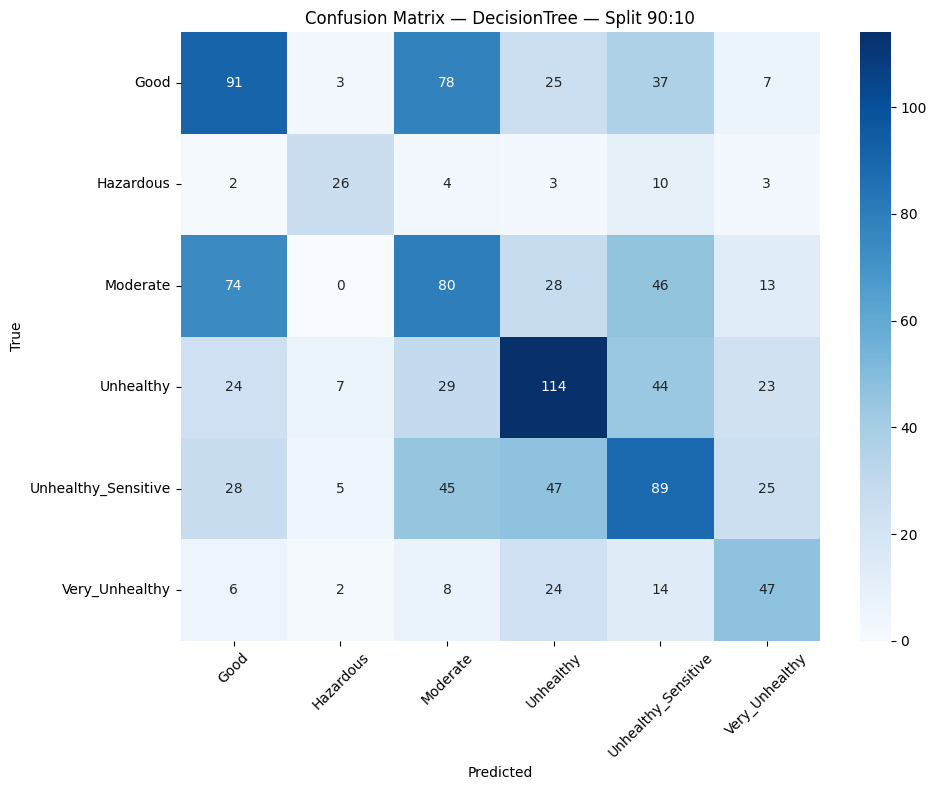


------------------------------
RandomForest — Split 90:10
------------------------------
Accuracy (RandomForest) — Split 90:10: 60.04%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.572     0.693     0.627       241
          Hazardous      1.000     0.292     0.452        48
           Moderate      0.493     0.419     0.453       241
          Unhealthy      0.651     0.805     0.720       241
Unhealthy_Sensitive      0.570     0.615     0.592       239
     Very_Unhealthy      1.000     0.436     0.607       101

           accuracy                          0.600      1111
          macro avg      0.714     0.543     0.575      1111
       weighted avg      0.629     0.600     0.592      1111



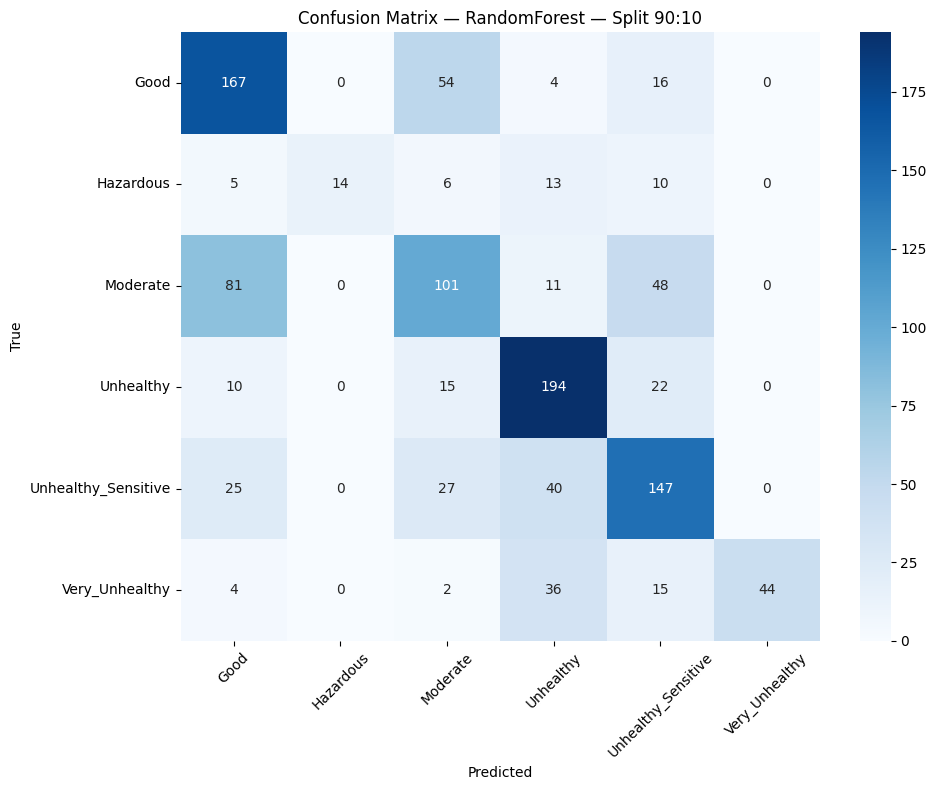


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 80:20

------------------------------
MLP — Split 80:20
------------------------------
Accuracy (MLP) — Split 80:20: 70.78%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.659     0.693     0.675       482
          Hazardous      0.860     0.833     0.847        96
           Moderate      0.565     0.494     0.527       482
          Unhealthy      0.808     0.857     0.831       481
Unhealthy_Sensitive      0.693     0.708     0.700       479
     Very_Unhealthy      0.841     0.841     0.841       201

           accuracy                          0.708      2221
          macro avg      0.738     0.738     0.737      2221
       weighted avg      0.703     0.708     0.705      2221



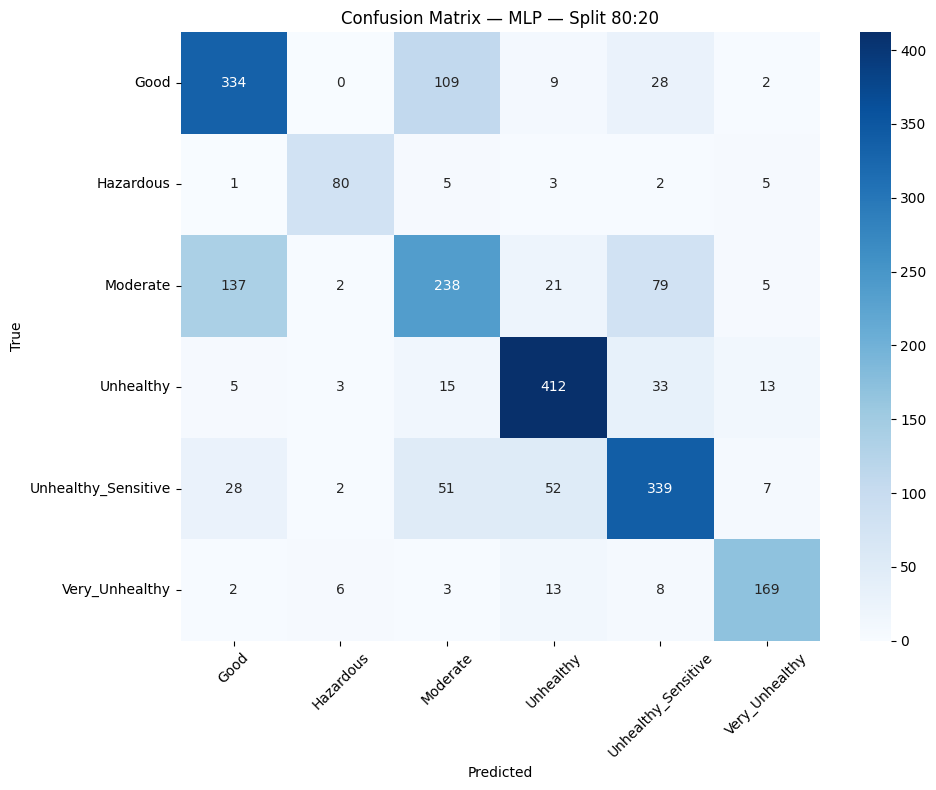


------------------------------
SVM — Split 80:20
------------------------------
Accuracy (SVM) — Split 80:20: 60.06%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.598     0.662     0.629       482
          Hazardous      0.676     0.760     0.716        96
           Moderate      0.464     0.459     0.461       482
          Unhealthy      0.680     0.688     0.684       481
Unhealthy_Sensitive      0.599     0.526     0.560       479
     Very_Unhealthy      0.704     0.687     0.695       201

           accuracy                          0.601      2221
          macro avg      0.620     0.630     0.624      2221
       weighted avg      0.600     0.601     0.599      2221



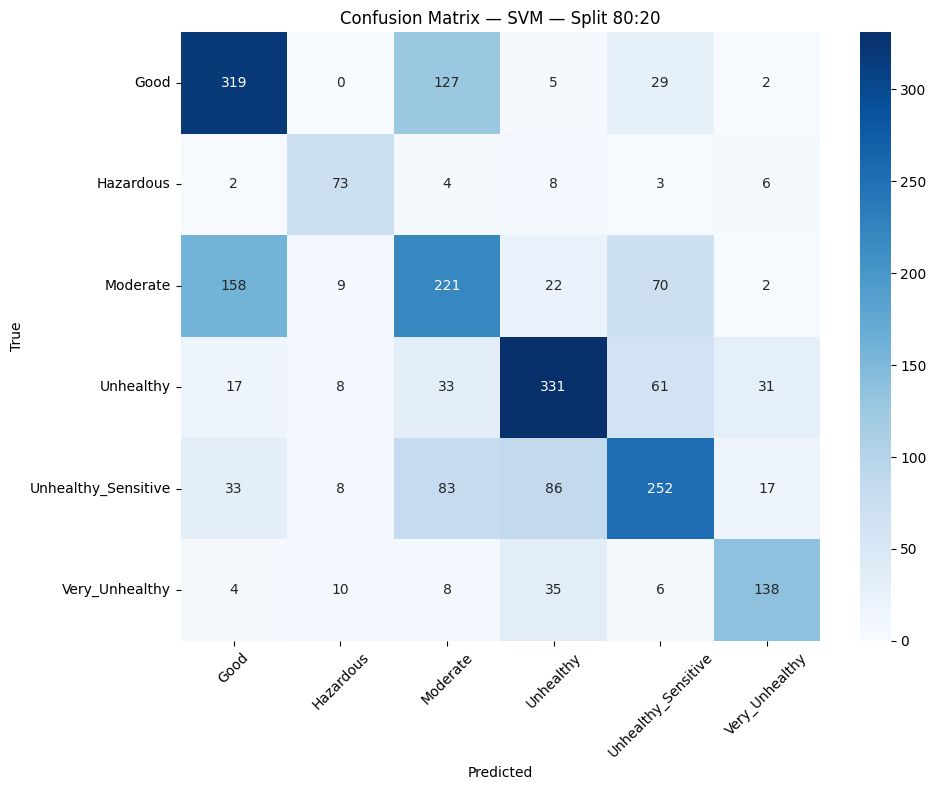


------------------------------
DecisionTree — Split 80:20
------------------------------
Accuracy (DecisionTree) — Split 80:20: 40.70%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.403     0.415     0.409       482
          Hazardous      0.463     0.385     0.420        96
           Moderate      0.311     0.309     0.310       482
          Unhealthy      0.497     0.518     0.507       481
Unhealthy_Sensitive      0.377     0.374     0.375       479
     Very_Unhealthy      0.474     0.448     0.460       201

           accuracy                          0.407      2221
          macro avg      0.421     0.408     0.414      2221
       weighted avg      0.407     0.407     0.407      2221



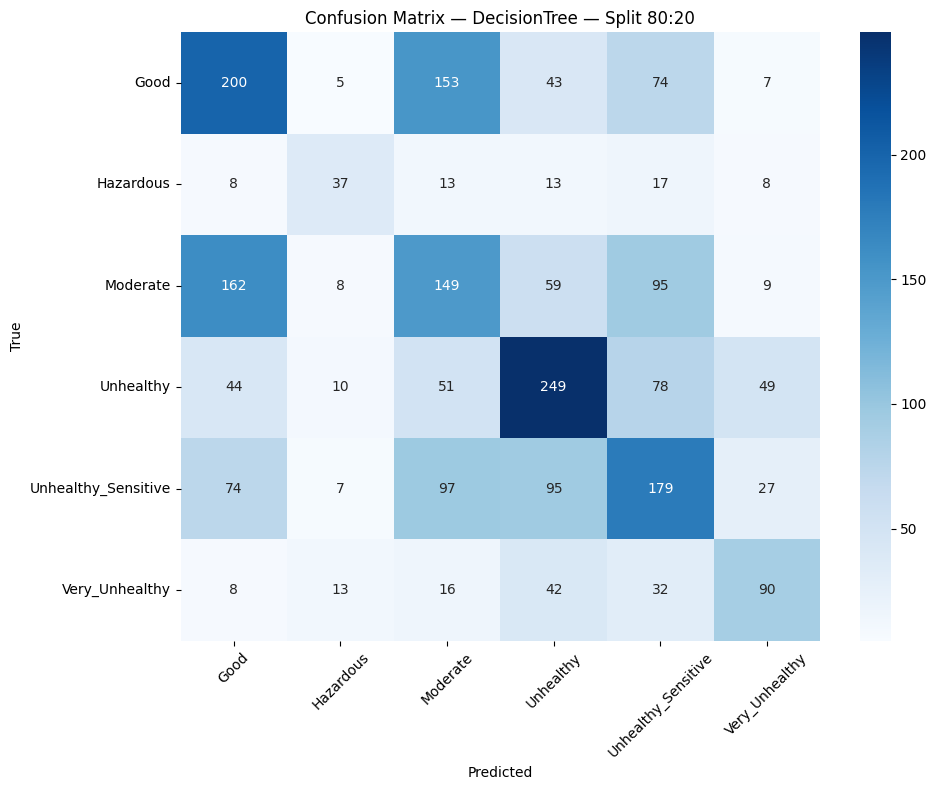


------------------------------
RandomForest — Split 80:20
------------------------------
Accuracy (RandomForest) — Split 80:20: 58.31%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.554     0.687     0.613       482
          Hazardous      1.000     0.240     0.387        96
           Moderate      0.453     0.413     0.432       482
          Unhealthy      0.633     0.790     0.703       481
Unhealthy_Sensitive      0.588     0.589     0.588       479
     Very_Unhealthy      0.988     0.398     0.567       201

           accuracy                          0.583      2221
          macro avg      0.703     0.519     0.548      2221
       weighted avg      0.615     0.583     0.574      2221



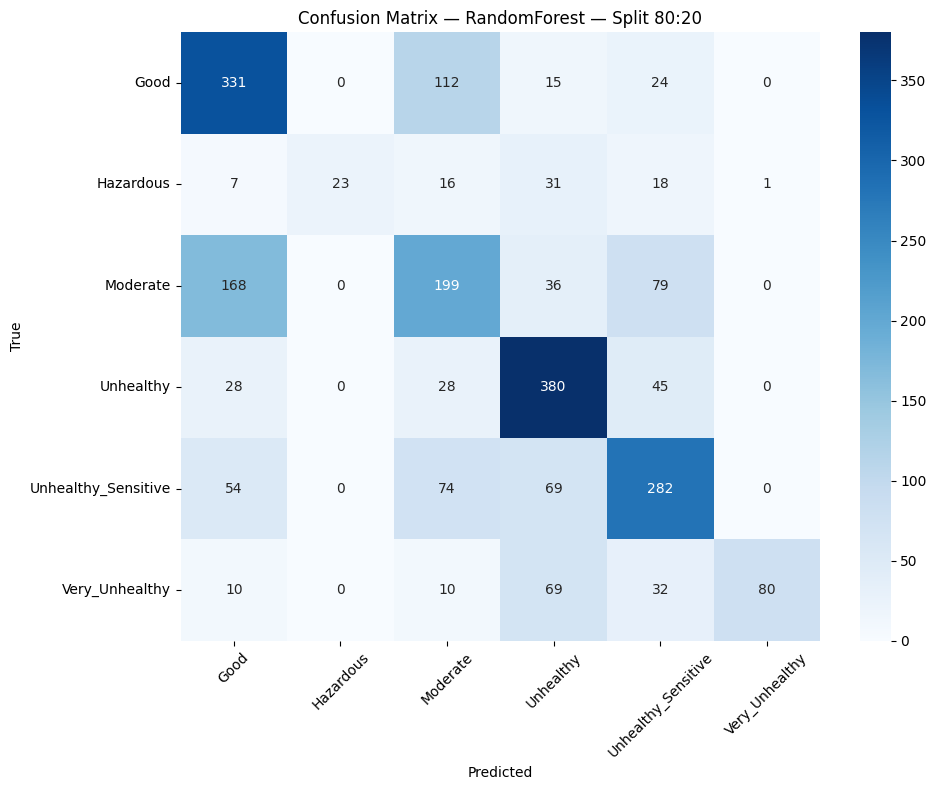


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 70:30

------------------------------
MLP — Split 70:30
------------------------------
Accuracy (MLP) — Split 70:30: 69.56%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.659     0.678     0.668       723
          Hazardous      0.842     0.778     0.809       144
           Moderate      0.560     0.529     0.544       722
          Unhealthy      0.813     0.819     0.816       722
Unhealthy_Sensitive      0.665     0.678     0.672       718
     Very_Unhealthy      0.815     0.844     0.829       302

           accuracy                          0.696      3331
          macro avg      0.726     0.721     0.723      3331
       weighted avg      0.694     0.696     0.695      3331



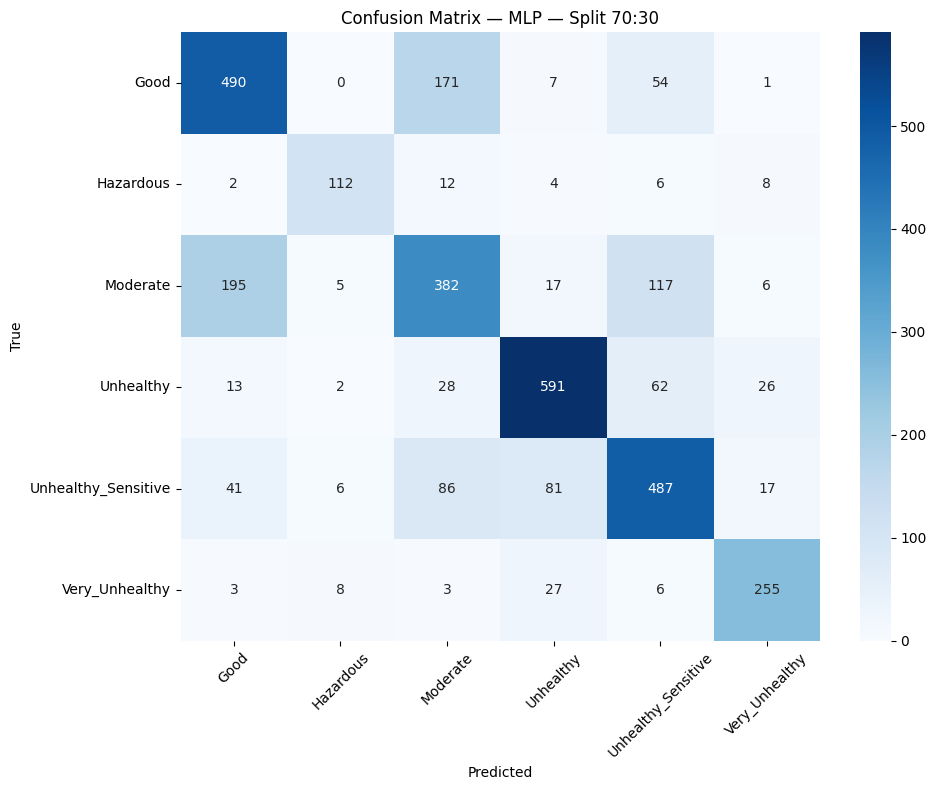


------------------------------
SVM — Split 70:30
------------------------------
Accuracy (SVM) — Split 70:30: 58.57%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.586     0.671     0.625       723
          Hazardous      0.719     0.799     0.757       144
           Moderate      0.444     0.449     0.447       722
          Unhealthy      0.673     0.663     0.668       722
Unhealthy_Sensitive      0.566     0.489     0.525       718
     Very_Unhealthy      0.699     0.652     0.675       302

           accuracy                          0.586      3331
          macro avg      0.614     0.620     0.616      3331
       weighted avg      0.586     0.586     0.584      3331



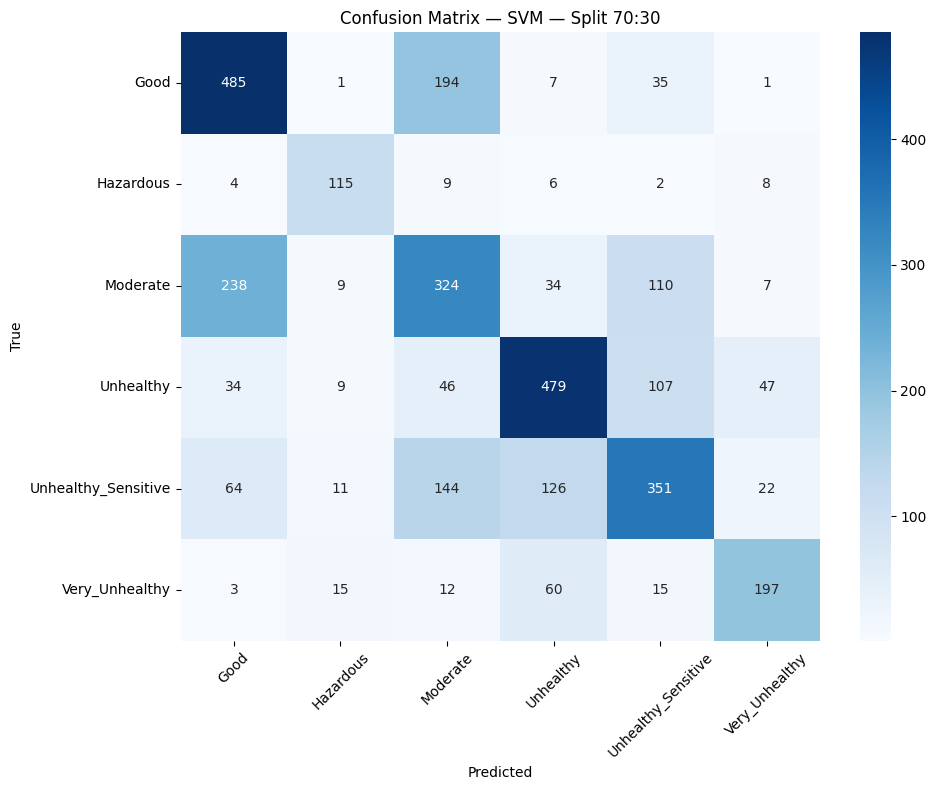


------------------------------
DecisionTree — Split 70:30
------------------------------
Accuracy (DecisionTree) — Split 70:30: 39.48%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.421     0.414     0.417       723
          Hazardous      0.398     0.458     0.426       144
           Moderate      0.333     0.330     0.331       722
          Unhealthy      0.476     0.460     0.468       722
Unhealthy_Sensitive      0.347     0.354     0.350       718
     Very_Unhealthy      0.406     0.417     0.412       302

           accuracy                          0.395      3331
          macro avg      0.397     0.405     0.401      3331
       weighted avg      0.395     0.395     0.395      3331



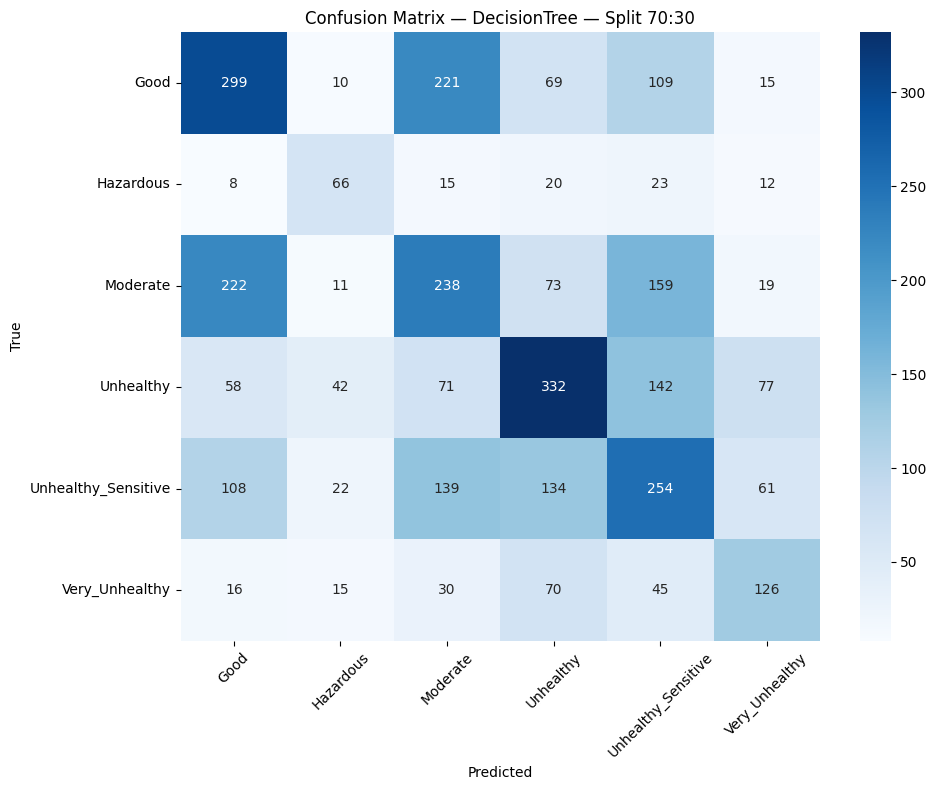


------------------------------
RandomForest — Split 70:30
------------------------------
Accuracy (RandomForest) — Split 70:30: 57.70%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.537     0.675     0.598       723
          Hazardous      1.000     0.222     0.364       144
           Moderate      0.456     0.427     0.441       722
          Unhealthy      0.634     0.788     0.702       722
Unhealthy_Sensitive      0.578     0.554     0.566       718
     Very_Unhealthy      1.000     0.421     0.592       302

           accuracy                          0.577      3331
          macro avg      0.701     0.514     0.544      3331
       weighted avg      0.611     0.577     0.569      3331



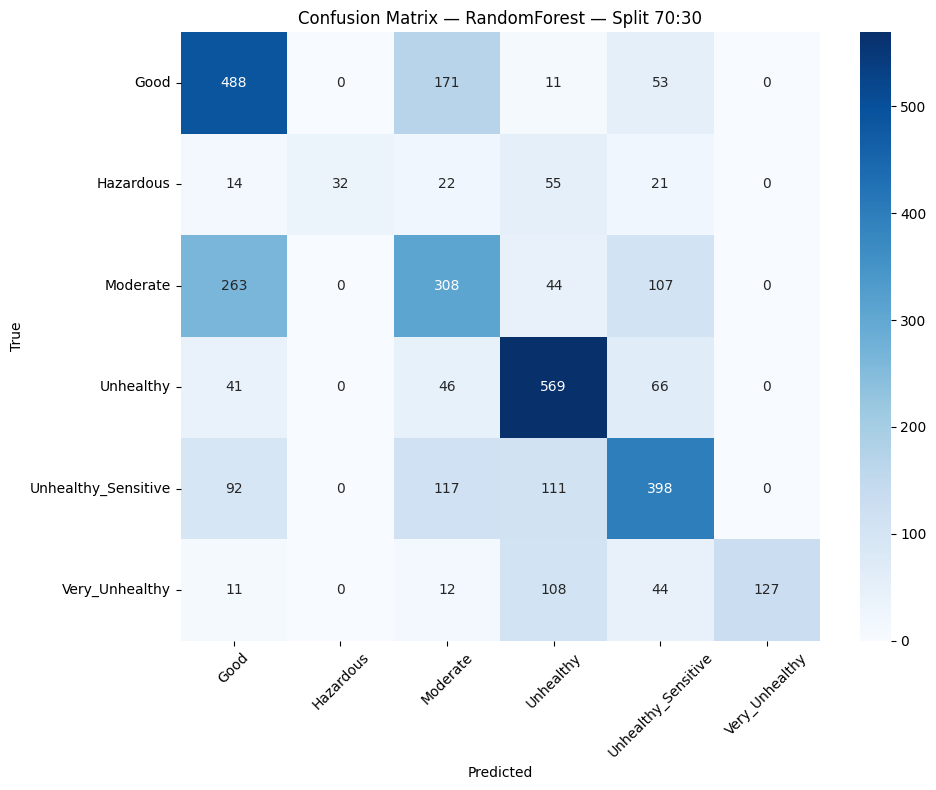


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 60:40

------------------------------
MLP — Split 60:40
------------------------------
Accuracy (MLP) — Split 60:40: 68.46%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.651     0.691     0.670       963
          Hazardous      0.814     0.793     0.803       193
           Moderate      0.554     0.515     0.534       963
          Unhealthy      0.786     0.814     0.800       963
Unhealthy_Sensitive      0.654     0.649     0.651       957
     Very_Unhealthy      0.826     0.799     0.812       403

           accuracy                          0.685      4442
          macro avg      0.714     0.710     0.712      4442
       weighted avg      0.683     0.685     0.683      4442



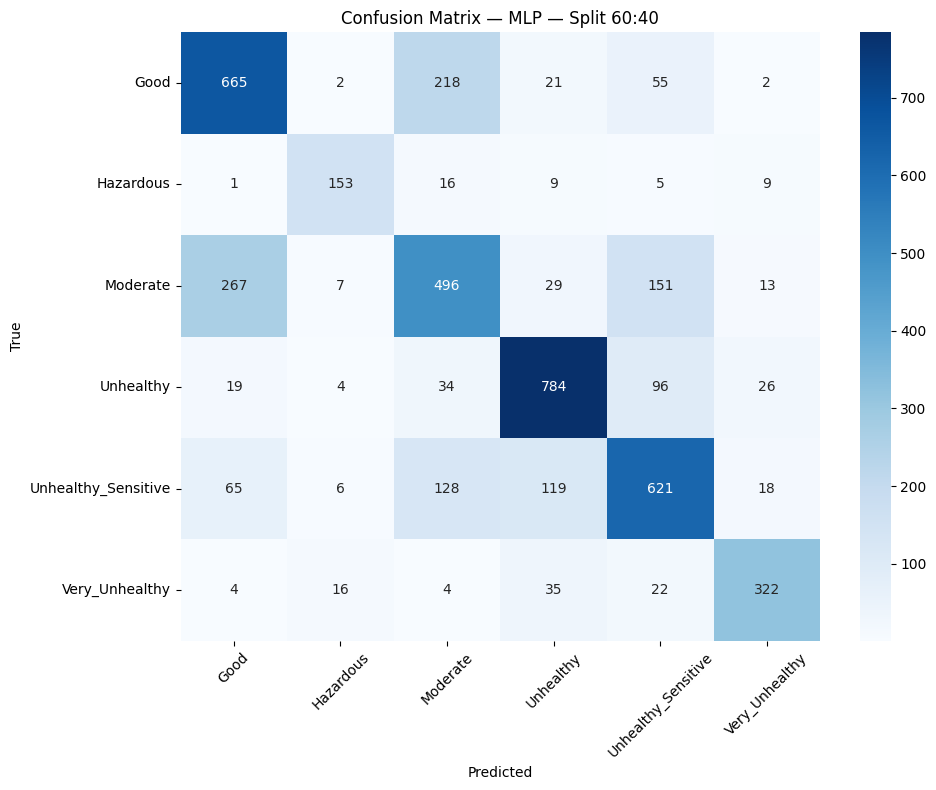


------------------------------
SVM — Split 60:40
------------------------------
Accuracy (SVM) — Split 60:40: 58.28%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.581     0.665     0.620       963
          Hazardous      0.667     0.798     0.726       193
           Moderate      0.443     0.445     0.444       963
          Unhealthy      0.680     0.675     0.677       963
Unhealthy_Sensitive      0.559     0.484     0.518       957
     Very_Unhealthy      0.709     0.628     0.666       403

           accuracy                          0.583      4442
          macro avg      0.606     0.616     0.609      4442
       weighted avg      0.583     0.583     0.581      4442



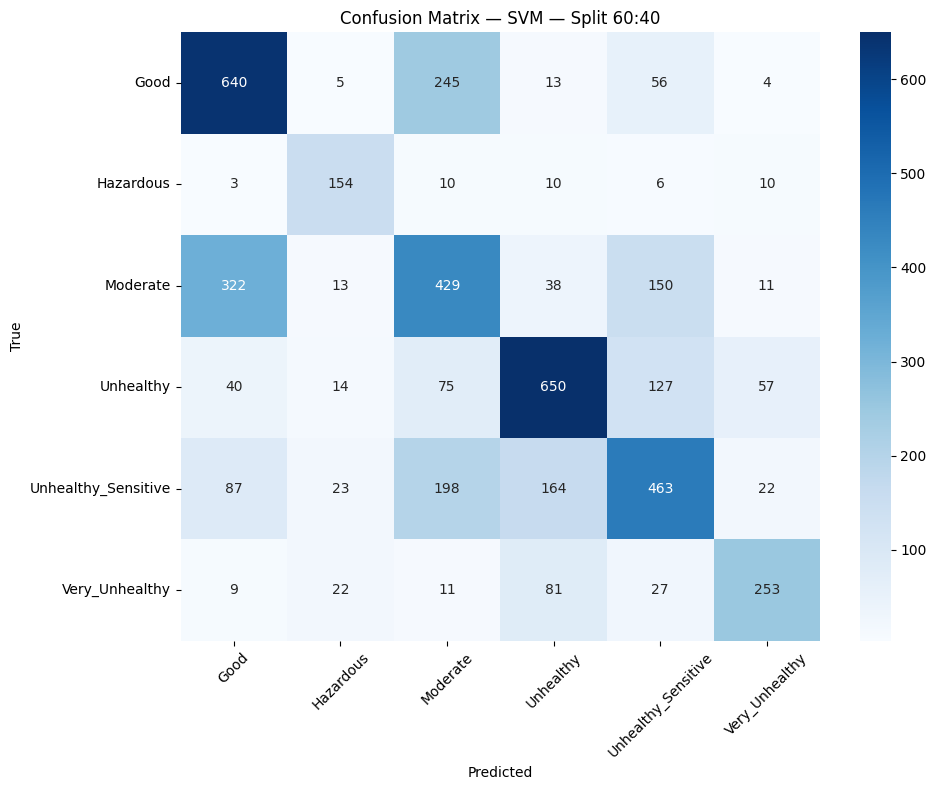


------------------------------
DecisionTree — Split 60:40
------------------------------
Accuracy (DecisionTree) — Split 60:40: 39.17%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.421     0.420     0.420       963
          Hazardous      0.358     0.332     0.344       193
           Moderate      0.327     0.333     0.330       963
          Unhealthy      0.477     0.486     0.481       963
Unhealthy_Sensitive      0.353     0.341     0.347       957
     Very_Unhealthy      0.376     0.390     0.383       403

           accuracy                          0.392      4442
          macro avg      0.385     0.383     0.384      4442
       weighted avg      0.391     0.392     0.391      4442



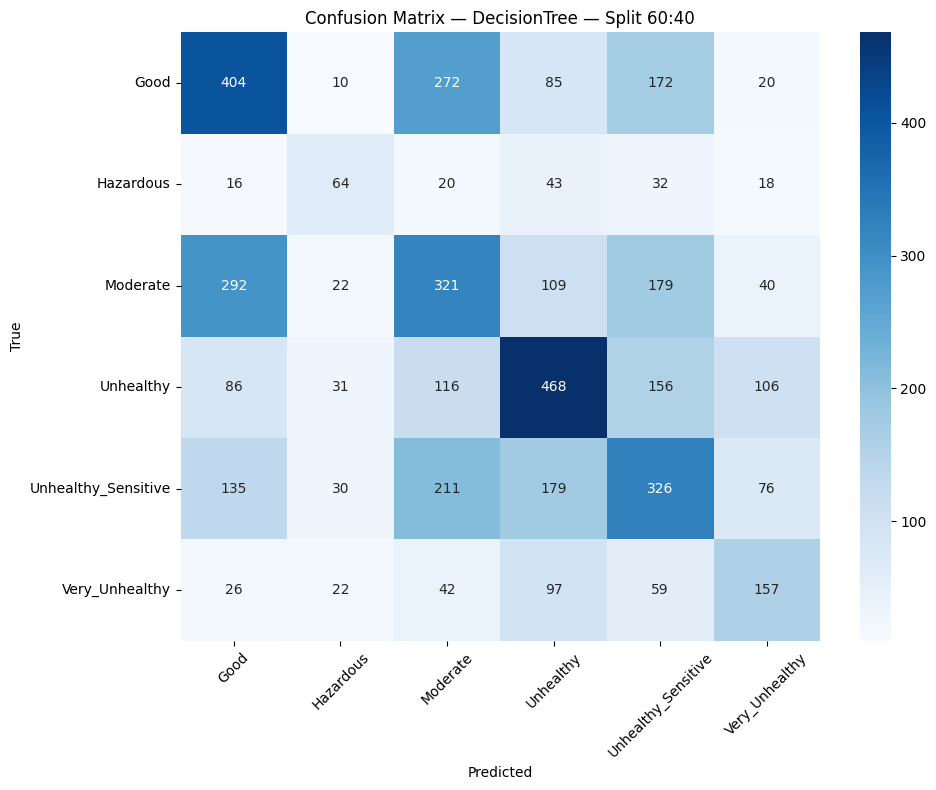


------------------------------
RandomForest — Split 60:40
------------------------------
Accuracy (RandomForest) — Split 60:40: 54.66%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.527     0.673     0.591       963
          Hazardous      1.000     0.202     0.336       193
           Moderate      0.411     0.388     0.399       963
          Unhealthy      0.621     0.757     0.682       963
Unhealthy_Sensitive      0.525     0.519     0.522       957
     Very_Unhealthy      1.000     0.350     0.518       403

           accuracy                          0.547      4442
          macro avg      0.681     0.482     0.508      4442
       weighted avg      0.585     0.547     0.537      4442



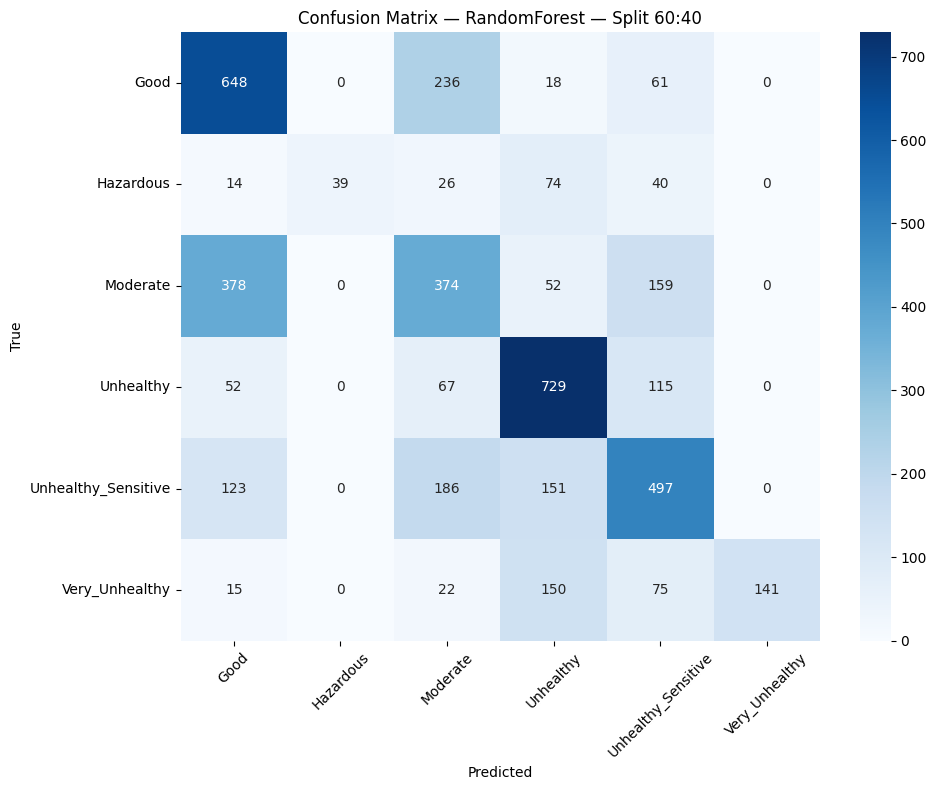


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 50:50

------------------------------
MLP — Split 50:50
------------------------------
Accuracy (MLP) — Split 50:50: 67.80%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.645     0.694     0.669      1204
          Hazardous      0.843     0.783     0.812       240
           Moderate      0.540     0.488     0.512      1204
          Unhealthy      0.777     0.805     0.791      1204
Unhealthy_Sensitive      0.652     0.660     0.656      1197
     Very_Unhealthy      0.811     0.783     0.797       503

           accuracy                          0.678      5552
          macro avg      0.711     0.702     0.706      5552
       weighted avg      0.676     0.678     0.676      5552



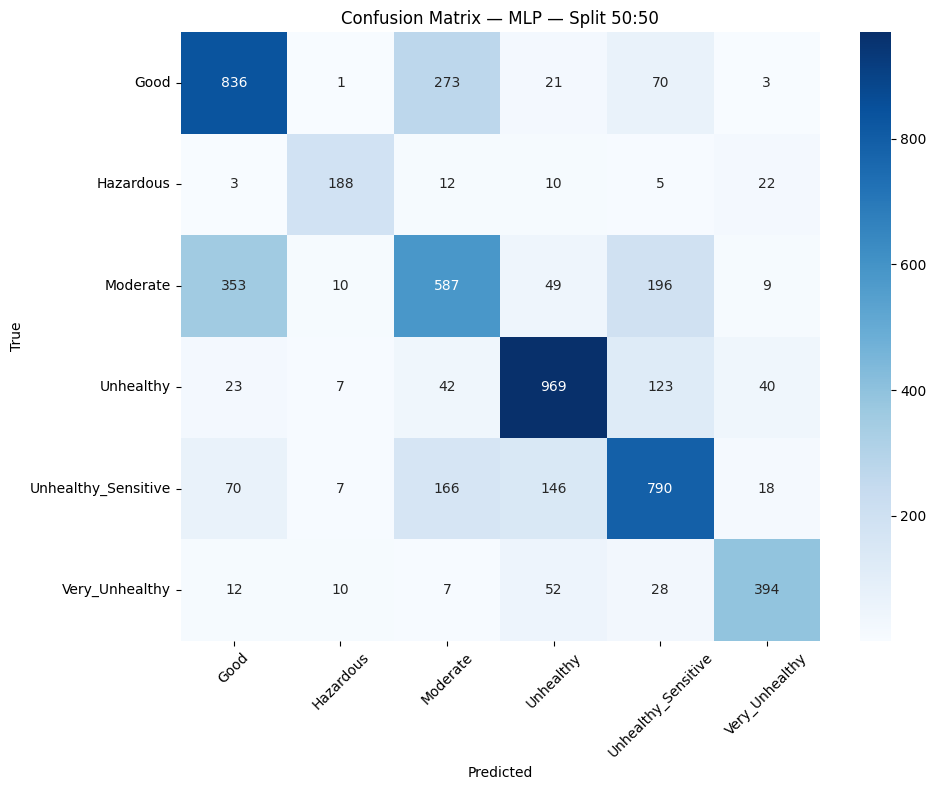


------------------------------
SVM — Split 50:50
------------------------------
Accuracy (SVM) — Split 50:50: 57.51%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.577     0.677     0.623      1204
          Hazardous      0.695     0.796     0.742       240
           Moderate      0.440     0.444     0.442      1204
          Unhealthy      0.658     0.657     0.657      1204
Unhealthy_Sensitive      0.543     0.450     0.492      1197
     Very_Unhealthy      0.708     0.642     0.674       503

           accuracy                          0.575      5552
          macro avg      0.603     0.611     0.605      5552
       weighted avg      0.574     0.575     0.573      5552



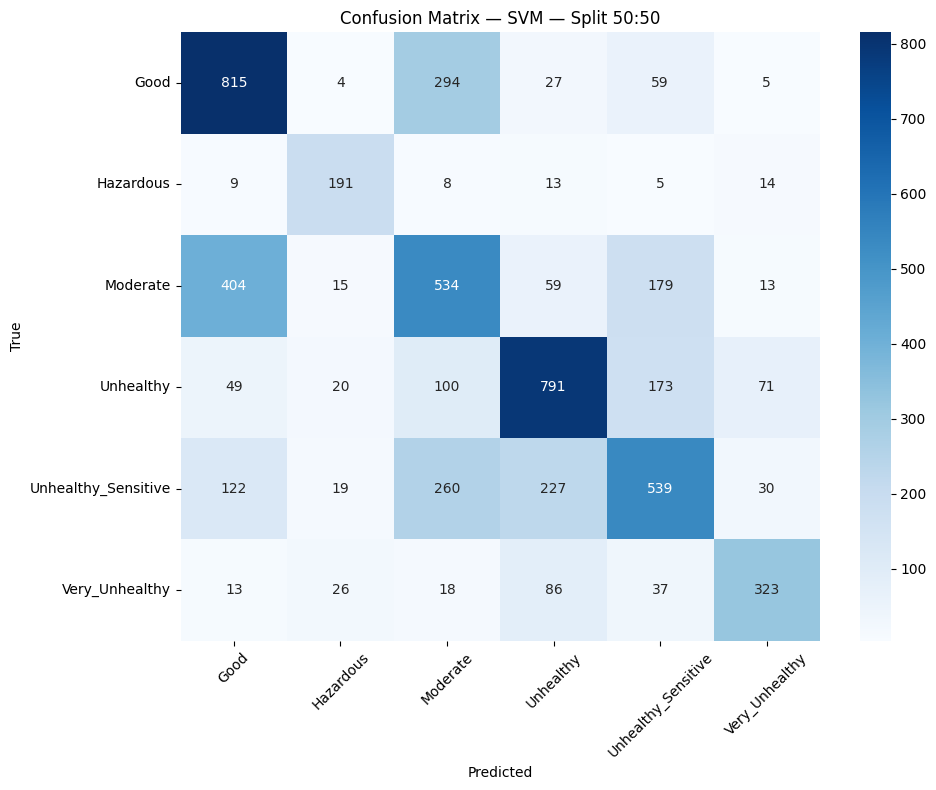


------------------------------
DecisionTree — Split 50:50
------------------------------
Accuracy (DecisionTree) — Split 50:50: 38.62%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.413     0.403     0.408      1204
          Hazardous      0.289     0.317     0.302       240
           Moderate      0.332     0.315     0.323      1204
          Unhealthy      0.456     0.483     0.469      1204
Unhealthy_Sensitive      0.349     0.351     0.350      1197
     Very_Unhealthy      0.410     0.404     0.407       503

           accuracy                          0.386      5552
          macro avg      0.375     0.379     0.376      5552
       weighted avg      0.385     0.386     0.386      5552



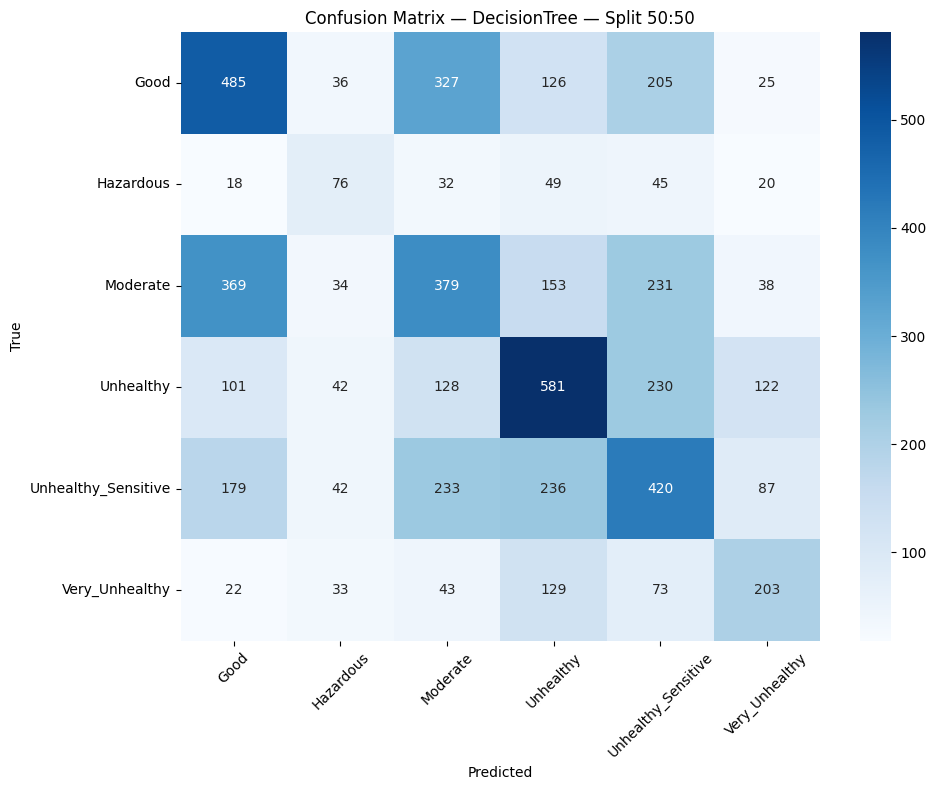


------------------------------
RandomForest — Split 50:50
------------------------------
Accuracy (RandomForest) — Split 50:50: 52.99%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.524     0.659     0.584      1204
          Hazardous      1.000     0.133     0.235       240
           Moderate      0.418     0.378     0.397      1204
          Unhealthy      0.590     0.740     0.657      1204
Unhealthy_Sensitive      0.492     0.516     0.504      1197
     Very_Unhealthy      1.000     0.304     0.466       503

           accuracy                          0.530      5552
          macro avg      0.671     0.455     0.474      5552
       weighted avg      0.572     0.530     0.516      5552



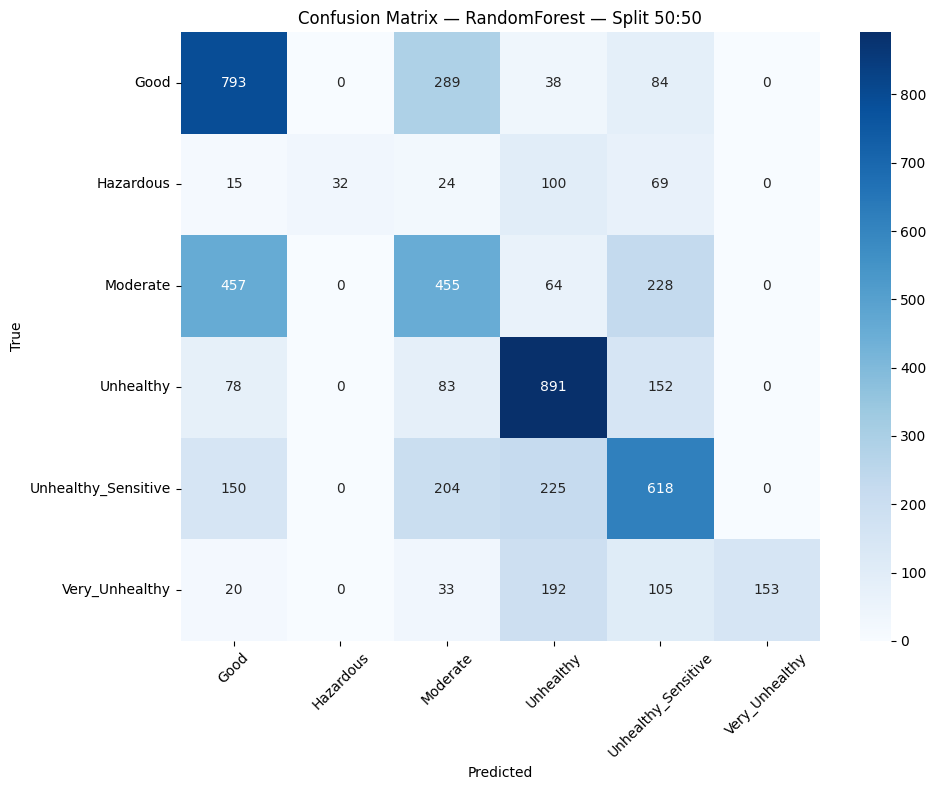


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 40:60

------------------------------
MLP — Split 40:60
------------------------------
Accuracy (MLP) — Split 40:60: 65.43%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.624     0.671     0.646      1445
          Hazardous      0.819     0.768     0.793       289
           Moderate      0.514     0.451     0.480      1444
          Unhealthy      0.757     0.810     0.782      1444
Unhealthy_Sensitive      0.620     0.627     0.624      1436
     Very_Unhealthy      0.780     0.740     0.760       604

           accuracy                          0.654      6662
          macro avg      0.686     0.678     0.681      6662
       weighted avg      0.651     0.654     0.652      6662



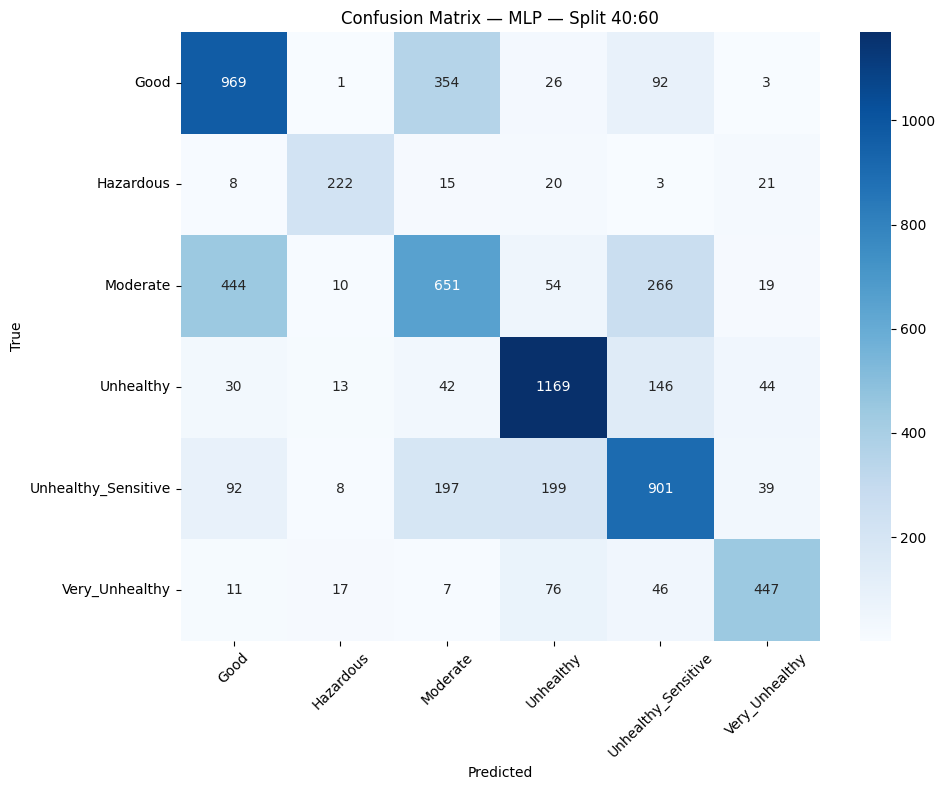


------------------------------
SVM — Split 40:60
------------------------------
Accuracy (SVM) — Split 40:60: 55.28%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.567     0.660     0.610      1445
          Hazardous      0.661     0.768     0.710       289
           Moderate      0.411     0.418     0.414      1444
          Unhealthy      0.641     0.625     0.633      1444
Unhealthy_Sensitive      0.511     0.439     0.472      1436
     Very_Unhealthy      0.698     0.613     0.653       604

           accuracy                          0.553      6662
          macro avg      0.581     0.587     0.582      6662
       weighted avg      0.553     0.553     0.551      6662



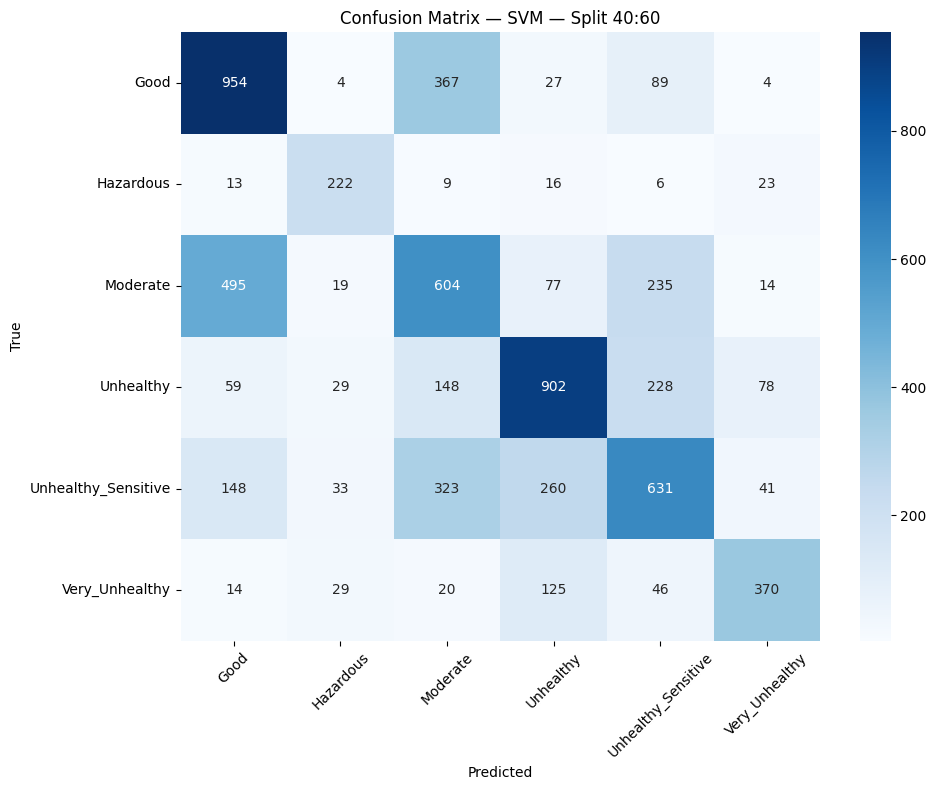


------------------------------
DecisionTree — Split 40:60
------------------------------
Accuracy (DecisionTree) — Split 40:60: 38.01%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.431     0.401     0.416      1445
          Hazardous      0.382     0.401     0.391       289
           Moderate      0.322     0.326     0.324      1444
          Unhealthy      0.445     0.447     0.446      1444
Unhealthy_Sensitive      0.325     0.327     0.326      1436
     Very_Unhealthy      0.381     0.416     0.397       604

           accuracy                          0.380      6662
          macro avg      0.381     0.386     0.383      6662
       weighted avg      0.381     0.380     0.380      6662



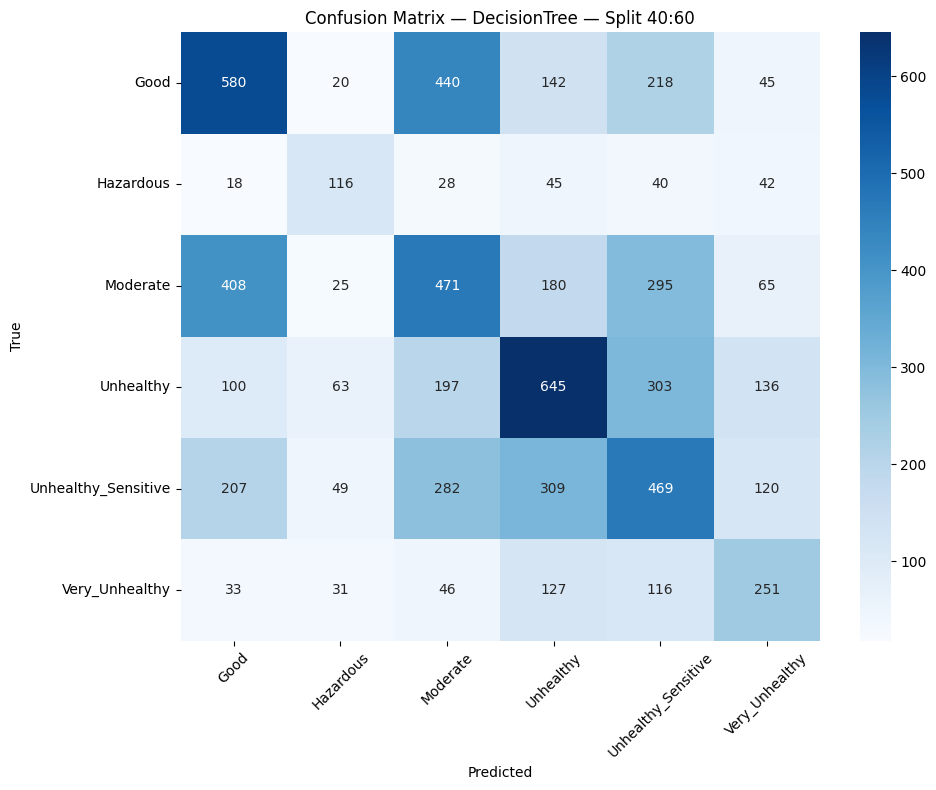


------------------------------
RandomForest — Split 40:60
------------------------------
Accuracy (RandomForest) — Split 40:60: 51.28%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.500     0.667     0.572      1445
          Hazardous      1.000     0.118     0.211       289
           Moderate      0.406     0.376     0.391      1444
          Unhealthy      0.560     0.732     0.634      1444
Unhealthy_Sensitive      0.499     0.456     0.477      1436
     Very_Unhealthy      1.000     0.270     0.425       604

           accuracy                          0.513      6662
          macro avg      0.661     0.436     0.451      6662
       weighted avg      0.559     0.513     0.497      6662



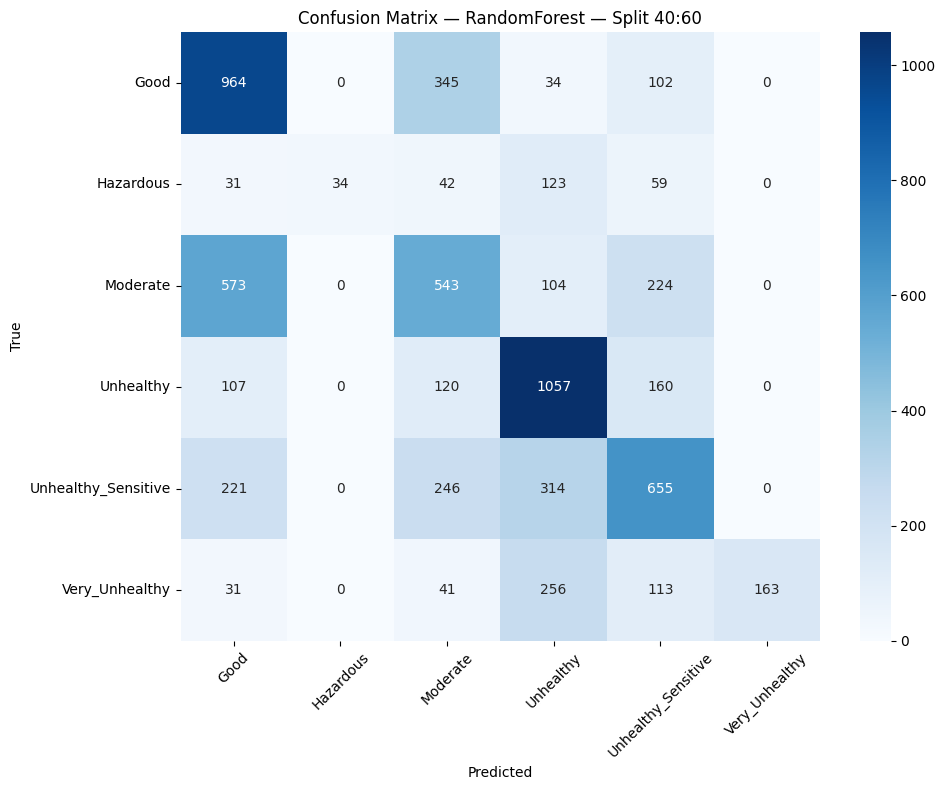


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 30:70

------------------------------
MLP — Split 30:70
------------------------------
Accuracy (MLP) — Split 30:70: 63.97%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.646     0.670     0.657      1686
          Hazardous      0.775     0.745     0.759       337
           Moderate      0.491     0.465     0.477      1685
          Unhealthy      0.734     0.776     0.755      1685
Unhealthy_Sensitive      0.591     0.593     0.592      1675
     Very_Unhealthy      0.790     0.719     0.753       705

           accuracy                          0.640      7773
          macro avg      0.671     0.661     0.666      7773
       weighted avg      0.638     0.640     0.638      7773



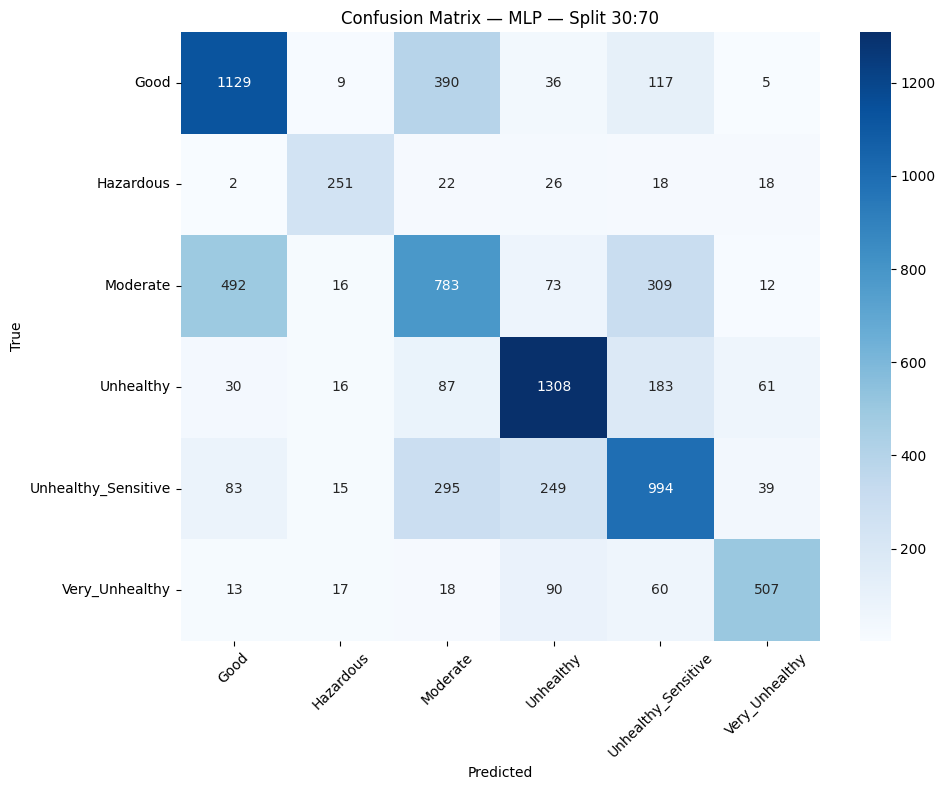


------------------------------
SVM — Split 30:70
------------------------------
Accuracy (SVM) — Split 30:70: 53.49%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.561     0.632     0.594      1686
          Hazardous      0.636     0.763     0.694       337
           Moderate      0.392     0.431     0.411      1685
          Unhealthy      0.625     0.606     0.615      1685
Unhealthy_Sensitive      0.484     0.392     0.433      1675
     Very_Unhealthy      0.686     0.614     0.648       705

           accuracy                          0.535      7773
          macro avg      0.564     0.573     0.566      7773
       weighted avg      0.536     0.535     0.533      7773



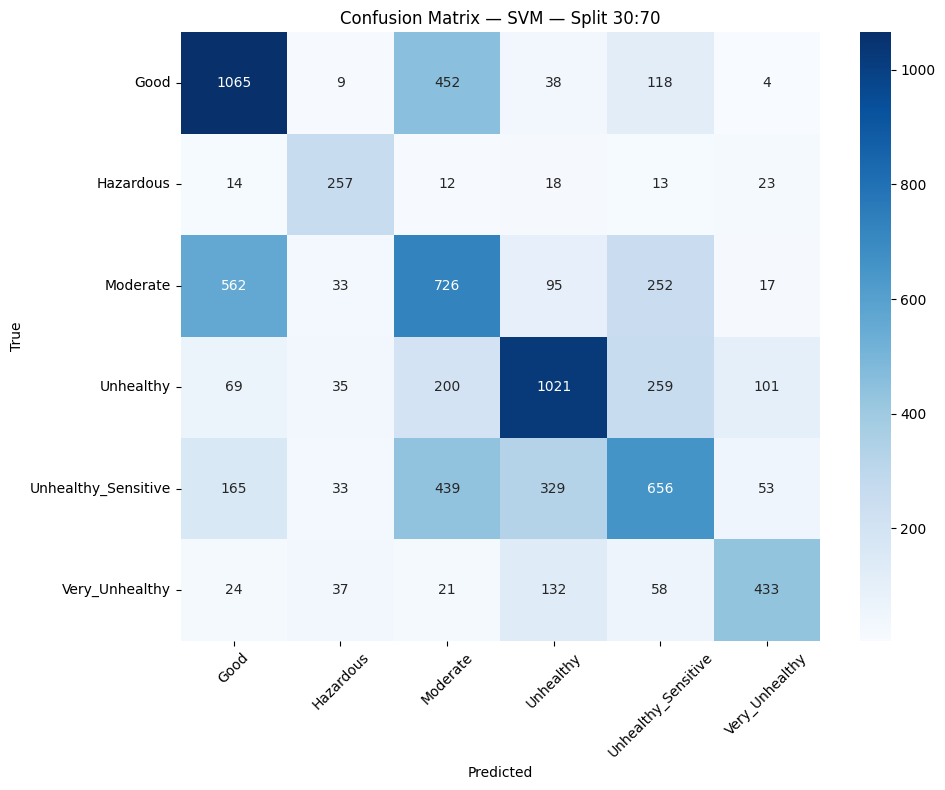


------------------------------
DecisionTree — Split 30:70
------------------------------
Accuracy (DecisionTree) — Split 30:70: 37.17%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.396     0.374     0.385      1686
          Hazardous      0.374     0.380     0.377       337
           Moderate      0.311     0.316     0.314      1685
          Unhealthy      0.443     0.437     0.440      1685
Unhealthy_Sensitive      0.334     0.353     0.343      1675
     Very_Unhealthy      0.388     0.382     0.385       705

           accuracy                          0.372      7773
          macro avg      0.374     0.374     0.374      7773
       weighted avg      0.373     0.372     0.372      7773



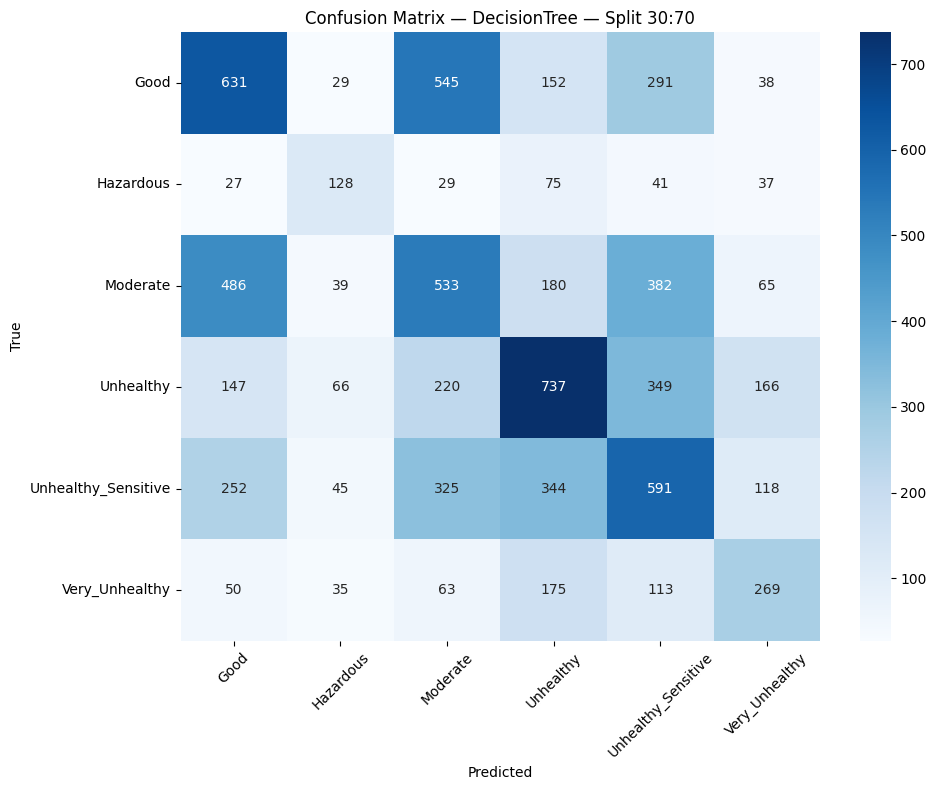


------------------------------
RandomForest — Split 30:70
------------------------------
Accuracy (RandomForest) — Split 30:70: 48.63%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.491     0.630     0.552      1686
          Hazardous      1.000     0.045     0.085       337
           Moderate      0.379     0.355     0.367      1685
          Unhealthy      0.530     0.706     0.605      1685
Unhealthy_Sensitive      0.475     0.460     0.467      1675
     Very_Unhealthy      0.980     0.206     0.340       705

           accuracy                          0.486      7773
          macro avg      0.642     0.400     0.403      7773
       weighted avg      0.538     0.486     0.466      7773



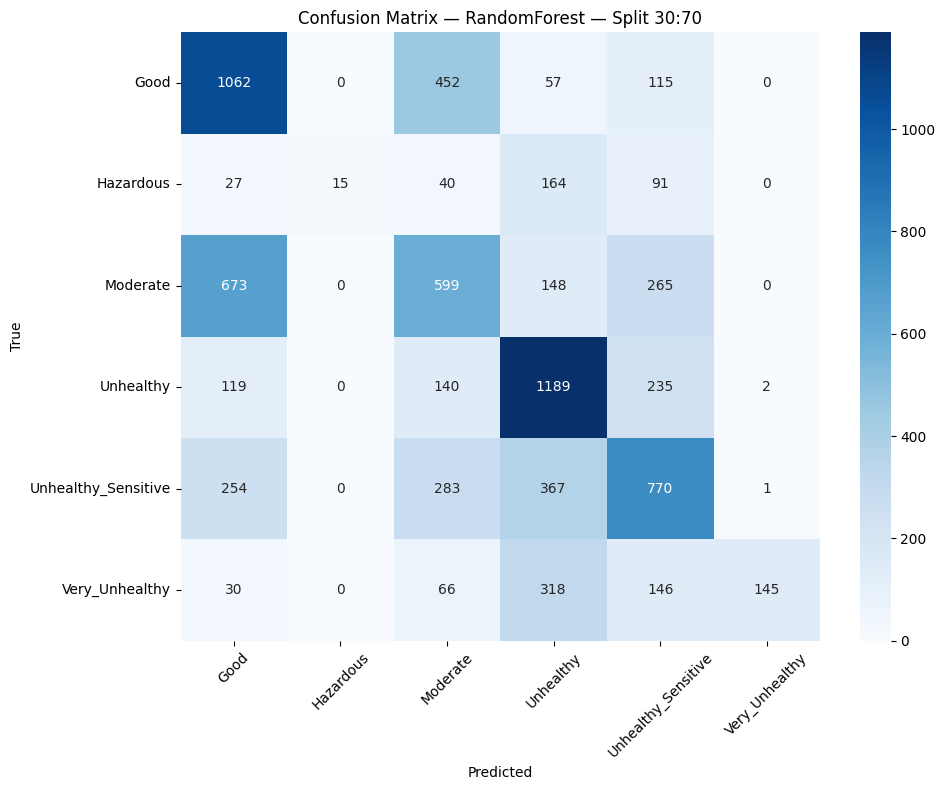


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 20:80

------------------------------
MLP — Split 20:80
------------------------------
Accuracy (MLP) — Split 20:80: 61.11%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.608     0.632     0.620      1926
          Hazardous      0.782     0.673     0.723       385
           Moderate      0.452     0.442     0.447      1926
          Unhealthy      0.707     0.763     0.734      1926
Unhealthy_Sensitive      0.585     0.555     0.570      1914
     Very_Unhealthy      0.735     0.706     0.720       806

           accuracy                          0.611      8883
          macro avg      0.645     0.628     0.636      8883
       weighted avg      0.610     0.611     0.610      8883



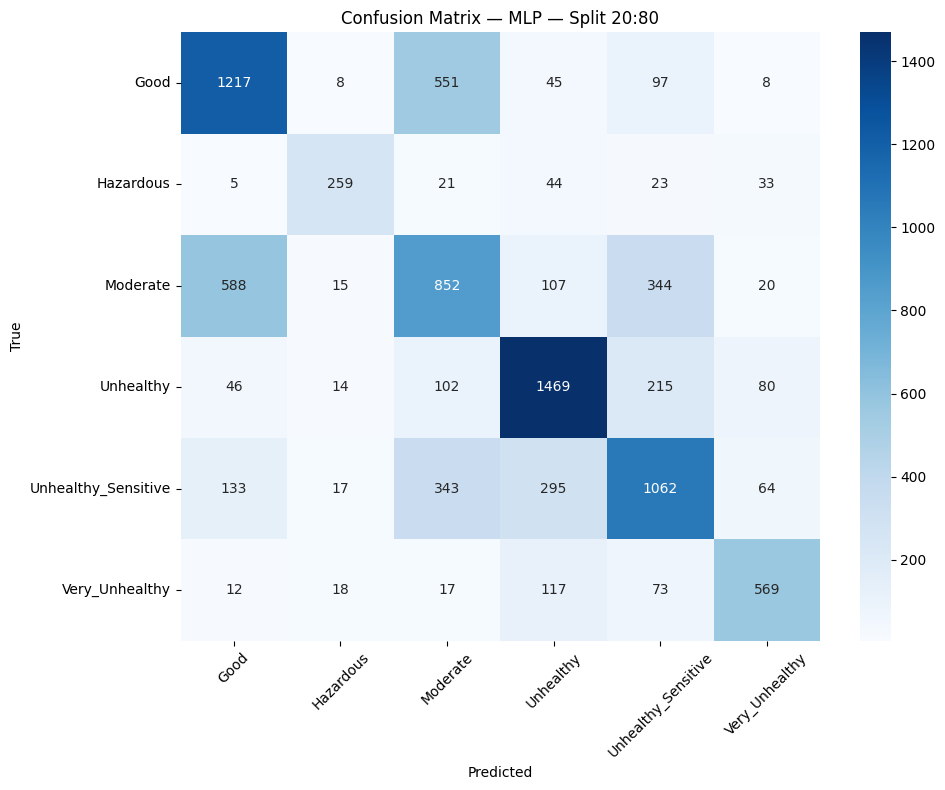


------------------------------
SVM — Split 20:80
------------------------------
Accuracy (SVM) — Split 20:80: 53.12%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.546     0.623     0.582      1926
          Hazardous      0.596     0.717     0.651       385
           Moderate      0.389     0.415     0.402      1926
          Unhealthy      0.622     0.621     0.622      1926
Unhealthy_Sensitive      0.490     0.397     0.439      1914
     Very_Unhealthy      0.702     0.604     0.649       806

           accuracy                          0.531      8883
          macro avg      0.558     0.563     0.557      8883
       weighted avg      0.533     0.531     0.530      8883



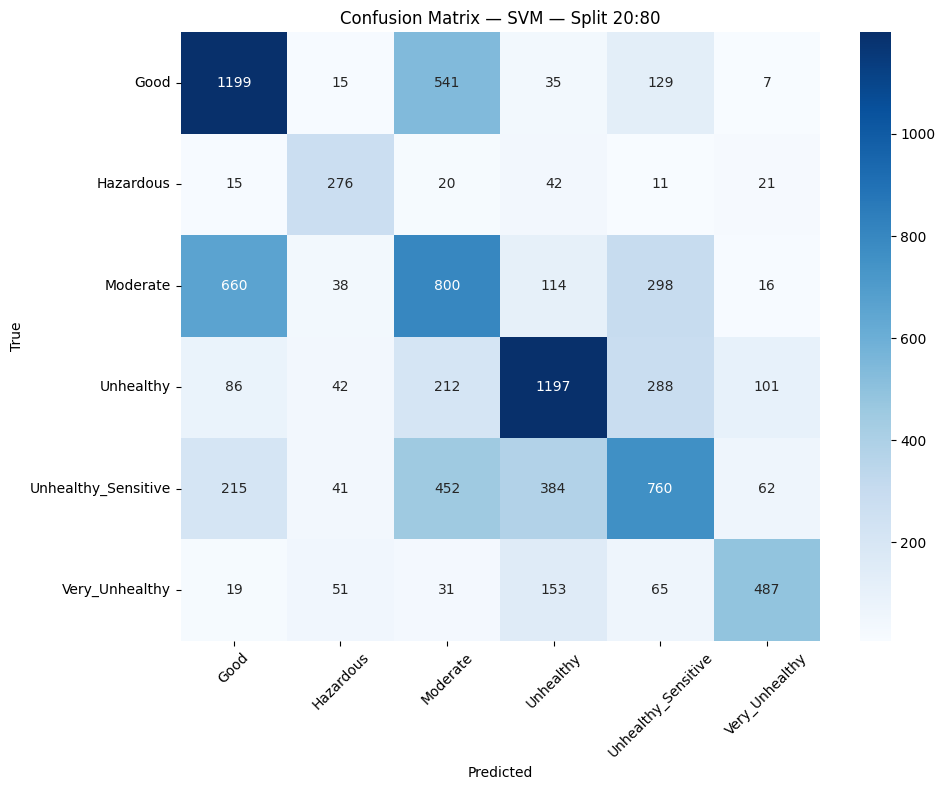


------------------------------
DecisionTree — Split 20:80
------------------------------
Accuracy (DecisionTree) — Split 20:80: 34.22%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.383     0.396     0.389      1926
          Hazardous      0.322     0.252     0.283       385
           Moderate      0.303     0.318     0.310      1926
          Unhealthy      0.410     0.420     0.415      1926
Unhealthy_Sensitive      0.295     0.275     0.285      1914
     Very_Unhealthy      0.287     0.288     0.287       806

           accuracy                          0.342      8883
          macro avg      0.333     0.325     0.328      8883
       weighted avg      0.341     0.342     0.341      8883



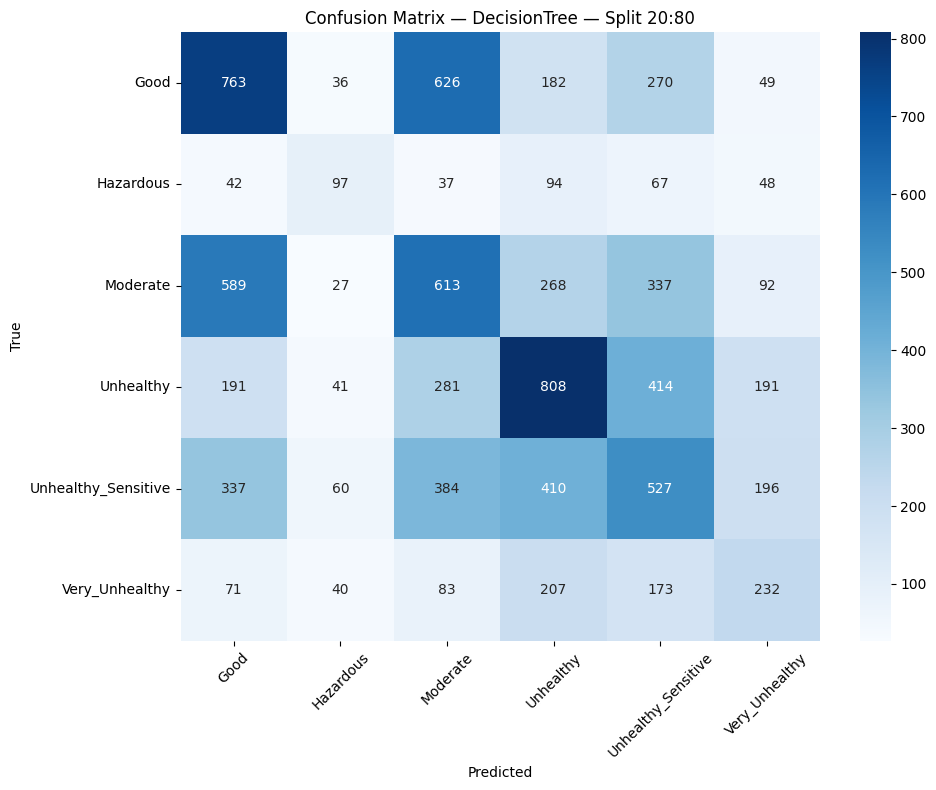


------------------------------
RandomForest — Split 20:80
------------------------------
Accuracy (RandomForest) — Split 20:80: 46.34%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.474     0.619     0.537      1926
          Hazardous      1.000     0.016     0.031       385
           Moderate      0.366     0.364     0.365      1926
          Unhealthy      0.521     0.657     0.581      1926
Unhealthy_Sensitive      0.439     0.434     0.436      1914
     Very_Unhealthy      0.976     0.150     0.260       806

           accuracy                          0.463      8883
          macro avg      0.629     0.373     0.368      8883
       weighted avg      0.522     0.463     0.440      8883



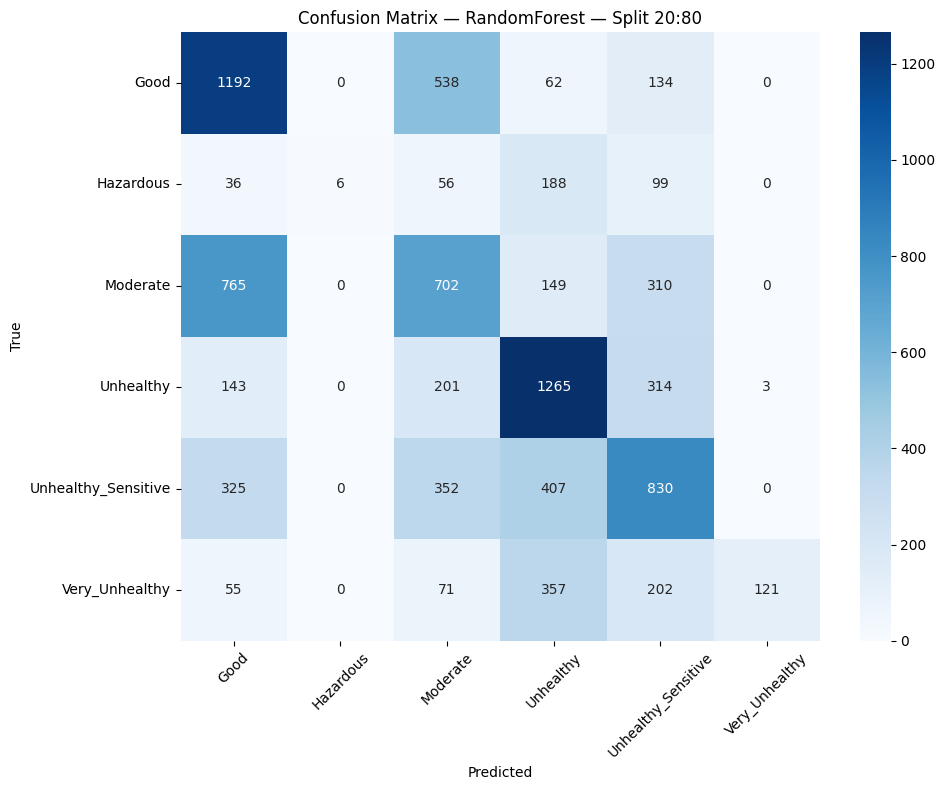


SPLIT-WISE EVALUATION (Confusion Matrix) — Split 10:90

------------------------------
MLP — Split 10:90
------------------------------
Accuracy (MLP) — Split 10:90: 55.96%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.583     0.626     0.604      2167
          Hazardous      0.747     0.545     0.630       433
           Moderate      0.432     0.394     0.412      2167
          Unhealthy      0.612     0.710     0.658      2166
Unhealthy_Sensitive      0.517     0.484     0.500      2154
     Very_Unhealthy      0.669     0.624     0.645       906

           accuracy                          0.560      9993
          macro avg      0.593     0.564     0.575      9993
       weighted avg      0.557     0.560     0.556      9993



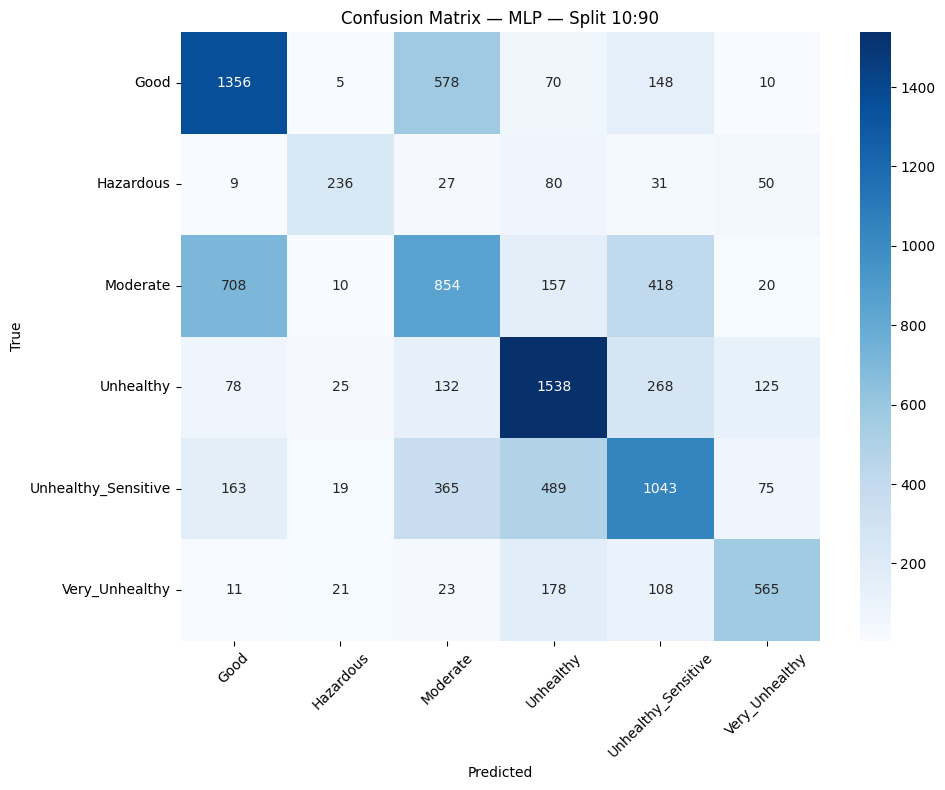


------------------------------
SVM — Split 10:90
------------------------------
Accuracy (SVM) — Split 10:90: 49.79%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.533     0.598     0.564      2167
          Hazardous      0.546     0.607     0.575       433
           Moderate      0.378     0.397     0.387      2167
          Unhealthy      0.563     0.590     0.576      2166
Unhealthy_Sensitive      0.459     0.350     0.397      2154
     Very_Unhealthy      0.589     0.581     0.585       906

           accuracy                          0.498      9993
          macro avg      0.511     0.520     0.514      9993
       weighted avg      0.496     0.498     0.495      9993



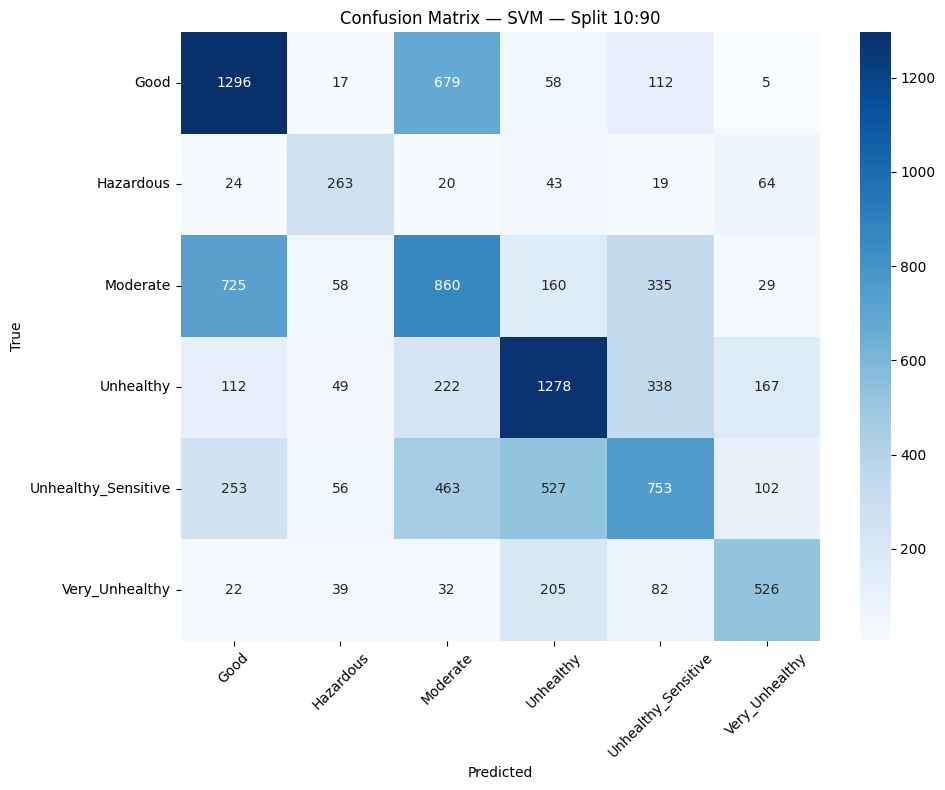


------------------------------
DecisionTree — Split 10:90
------------------------------
Accuracy (DecisionTree) — Split 10:90: 30.51%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.387     0.373     0.380      2167
          Hazardous      0.169     0.231     0.195       433
           Moderate      0.279     0.307     0.293      2167
          Unhealthy      0.370     0.333     0.351      2166
Unhealthy_Sensitive      0.254     0.246     0.250      2154
     Very_Unhealthy      0.250     0.246     0.248       906

           accuracy                          0.305      9993
          macro avg      0.285     0.289     0.286      9993
       weighted avg      0.309     0.305     0.307      9993



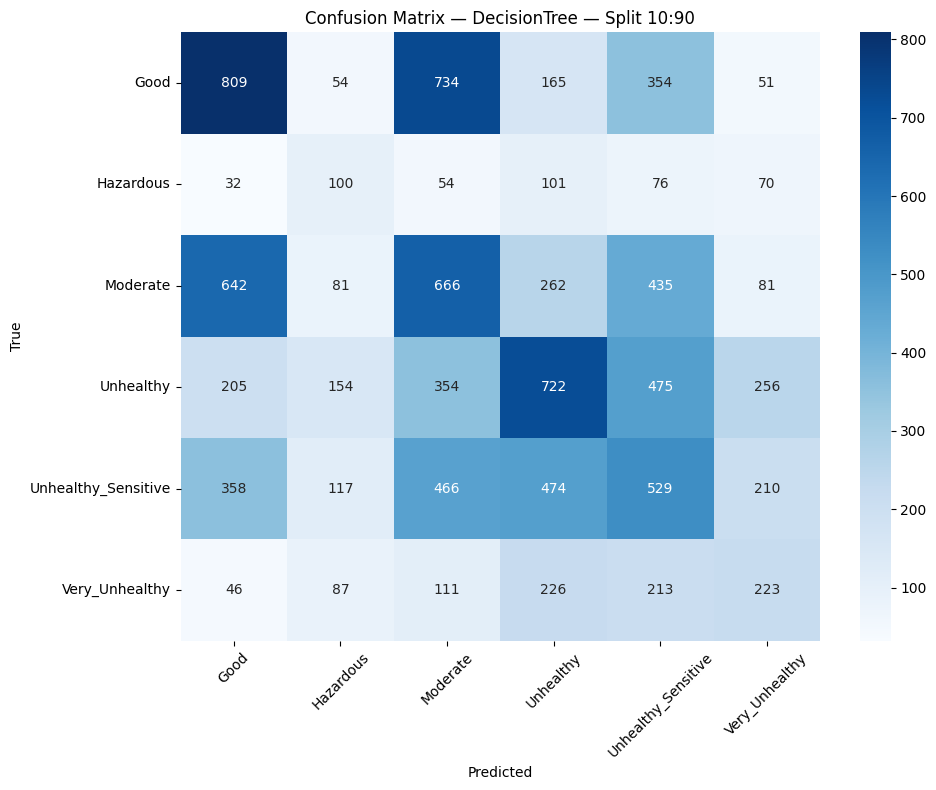


------------------------------
RandomForest — Split 10:90
------------------------------
Accuracy (RandomForest) — Split 10:90: 40.21%

Classification Report:
                     precision    recall  f1-score   support

               Good      0.434     0.610     0.507      2167
          Hazardous      1.000     0.002     0.005       433
           Moderate      0.331     0.299     0.314      2167
          Unhealthy      0.440     0.594     0.506      2166
Unhealthy_Sensitive      0.361     0.344     0.352      2154
     Very_Unhealthy      0.952     0.022     0.043       906

           accuracy                          0.402      9993
          macro avg      0.587     0.312     0.288      9993
       weighted avg      0.469     0.402     0.368      9993



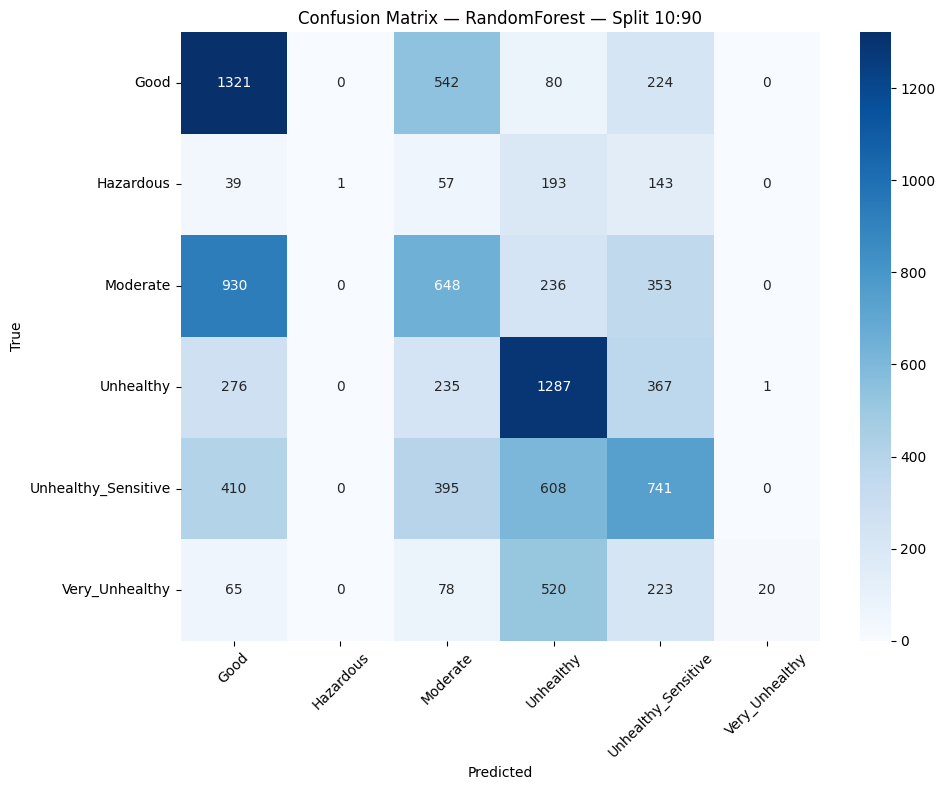

In [21]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

split_ratios = [(90,10),(80,20),(70,30),(60,40),(50,50),(40,60),(30,70),(20,80),(10,90)]

for tr, te in split_ratios:

    print("\n" + "="*90)
    print(f"SPLIT-WISE EVALUATION (Confusion Matrix) — Split {tr}:{te}")
    print("="*90)

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_all, y_all,
        test_size=te / 100,
        stratify=y_all,
        random_state=42
    )

    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_te = scaler.transform(X_te)

    pca = PCA(n_components=512)
    X_tr = pca.fit_transform(X_tr)
    X_te = pca.transform(X_te)

    classifiers = {
        "MLP": MLPClassifier(
            hidden_layer_sizes=(1024, 512, 256),
            activation='relu',
            solver='adam',
            learning_rate_init=0.0001,
            max_iter=1000,
            random_state=42,
            verbose=False
        ),
        "SVM": SVC(kernel="linear", probability=True),
        "DecisionTree": DecisionTreeClassifier(),
        "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42)
    }

    for name, model in classifiers.items():

        print(f"\n------------------------------")
        print(f"{name} — Split {tr}:{te}")
        print(f"------------------------------")

        model.fit(X_tr, y_tr)
        preds = model.predict(X_te)

        acc = accuracy_score(y_te, preds)
        print(f"Accuracy ({name}) — Split {tr}:{te}: {acc * 100:.2f}%")

        print("\nClassification Report:")
        print(classification_report(
            y_te, preds,
            target_names=[idx_to_class[i] for i in range(NUM_CLASSES)],
            digits=3
        ))

        cm = confusion_matrix(y_te, preds)

        plt.figure(figsize=(10, 8))
        sns.heatmap(
            cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[idx_to_class[i] for i in range(NUM_CLASSES)],
            yticklabels=[idx_to_class[i] for i in range(NUM_CLASSES)]
        )
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title(f"Confusion Matrix — {name} — Split {tr}:{te}")
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

This block benchmarks the classical classifiers by re-fitting each one to measure training time, then computing and printing both training and validation accuracy for comparison. It stores timing and accuracy results in dictionaries, keeps the MLP’s training loss curve (since only MLP provides loss_curve_), and finally visualizes (1) training time as a bar chart, (2) validation accuracy as a bar chart, and (3) the MLP loss curve over iterations to show its optimization behavior.


TRAINING TIME + ACCURACY — Split 90:10

------------------------------
⏳ Evaluating: MLP (Split 90:10)
------------------------------
Training Time: 76.61 sec
Train Accuracy: 100.00%
Test Accuracy: 70.39%

------------------------------
⏳ Evaluating: SVM (Split 90:10)
------------------------------
Training Time: 1550.11 sec
Train Accuracy: 78.09%
Test Accuracy: 59.68%

------------------------------
⏳ Evaluating: Decision Tree (Split 90:10)
------------------------------
Training Time: 10.23 sec
Train Accuracy: 100.00%
Test Accuracy: 41.85%

------------------------------
⏳ Evaluating: Random Forest (Split 90:10)
------------------------------
Training Time: 65.96 sec
Train Accuracy: 100.00%
Test Accuracy: 60.04%


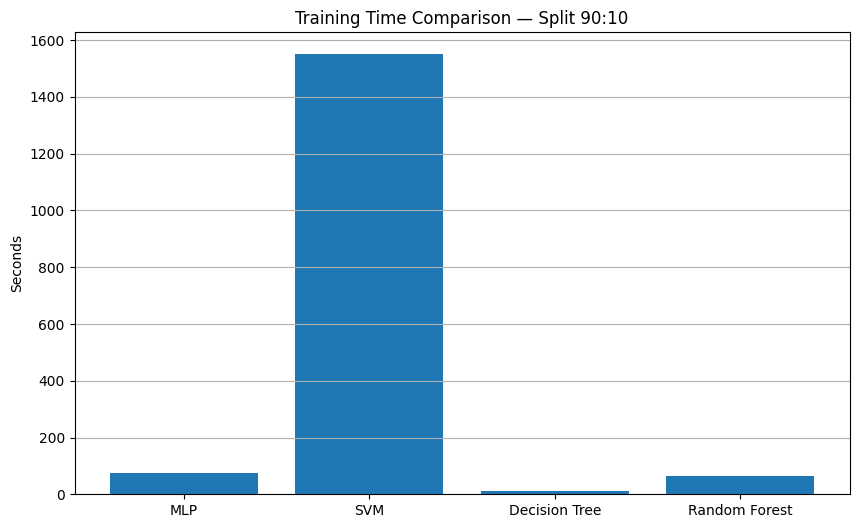

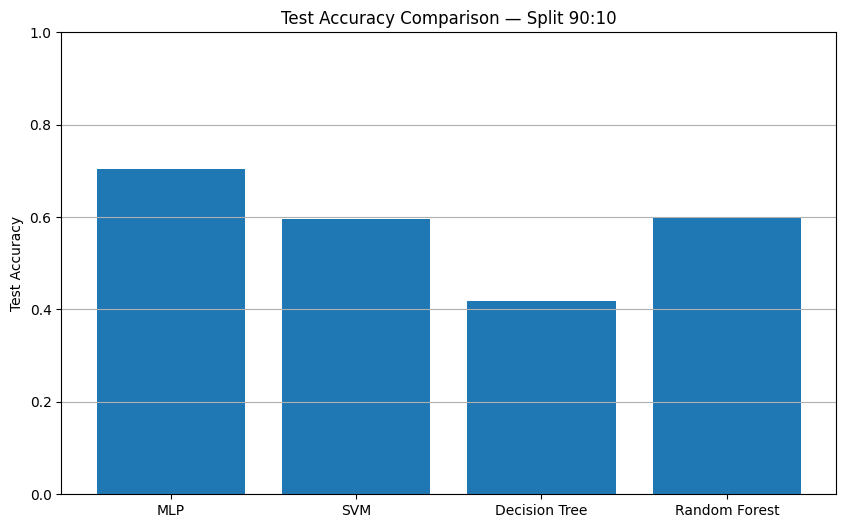

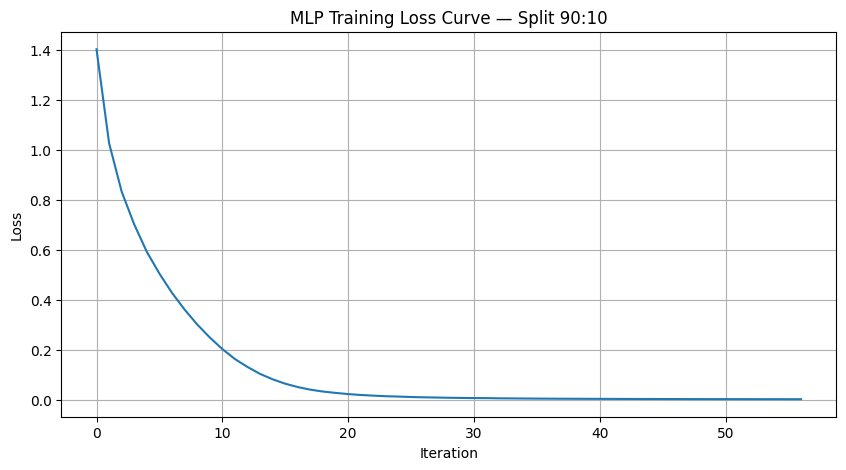


TRAINING TIME + ACCURACY — Split 80:20

------------------------------
⏳ Evaluating: MLP (Split 80:20)
------------------------------
Training Time: 71.14 sec
Train Accuracy: 100.00%
Test Accuracy: 70.78%

------------------------------
⏳ Evaluating: SVM (Split 80:20)
------------------------------
Training Time: 1216.63 sec
Train Accuracy: 79.26%
Test Accuracy: 60.06%

------------------------------
⏳ Evaluating: Decision Tree (Split 80:20)
------------------------------
Training Time: 8.87 sec
Train Accuracy: 100.00%
Test Accuracy: 42.01%

------------------------------
⏳ Evaluating: Random Forest (Split 80:20)
------------------------------
Training Time: 57.39 sec
Train Accuracy: 100.00%
Test Accuracy: 58.31%


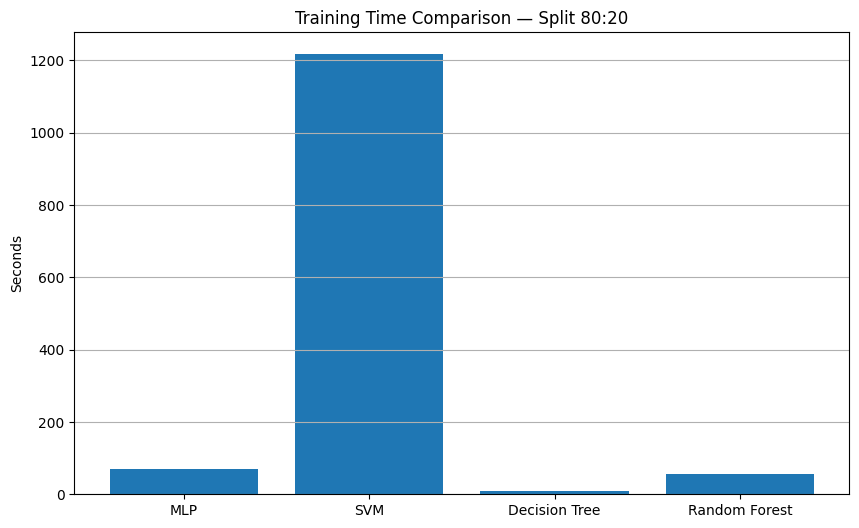

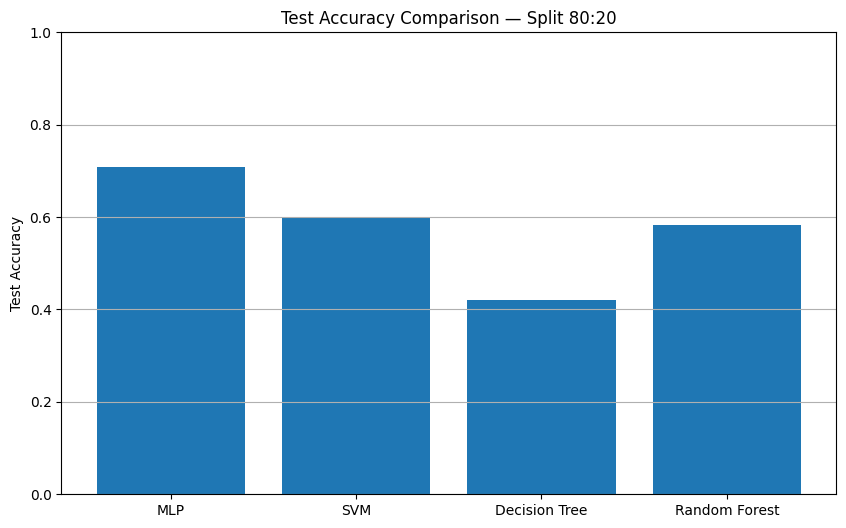

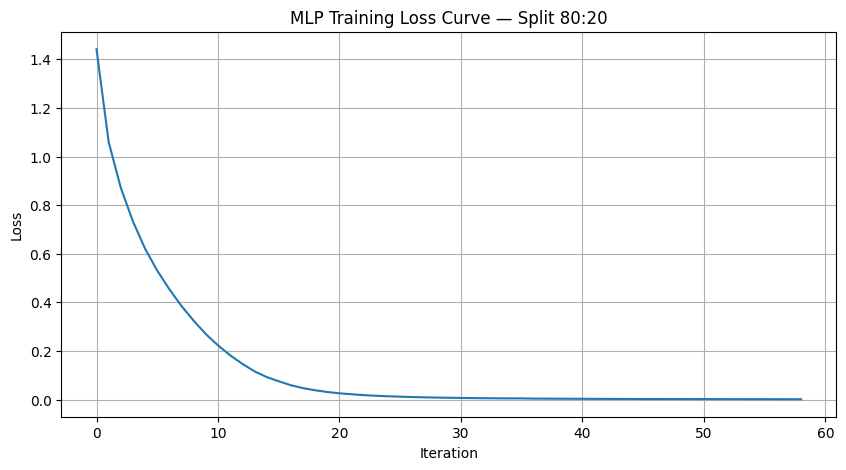


TRAINING TIME + ACCURACY — Split 70:30

------------------------------
⏳ Evaluating: MLP (Split 70:30)
------------------------------
Training Time: 55.70 sec
Train Accuracy: 100.00%
Test Accuracy: 69.56%

------------------------------
⏳ Evaluating: SVM (Split 70:30)
------------------------------
Training Time: 978.19 sec
Train Accuracy: 80.89%
Test Accuracy: 58.57%

------------------------------
⏳ Evaluating: Decision Tree (Split 70:30)
------------------------------
Training Time: 7.44 sec
Train Accuracy: 100.00%
Test Accuracy: 40.53%

------------------------------
⏳ Evaluating: Random Forest (Split 70:30)
------------------------------
Training Time: 50.57 sec
Train Accuracy: 100.00%
Test Accuracy: 57.70%


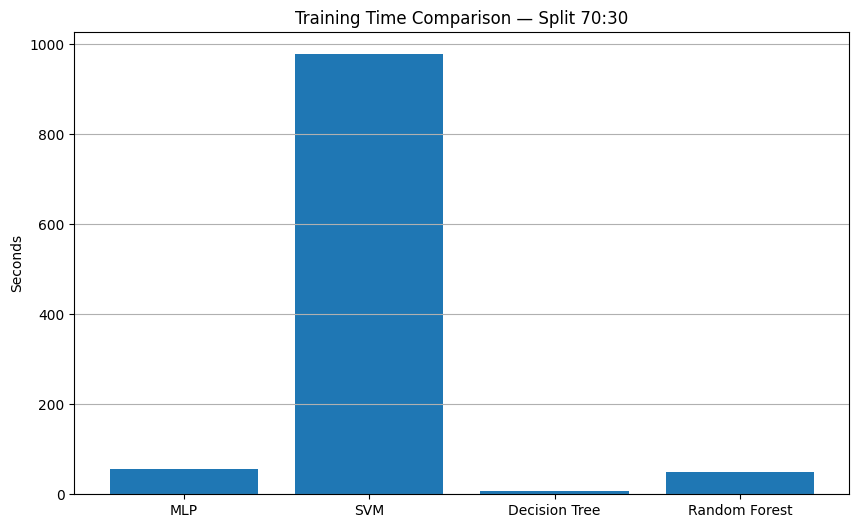

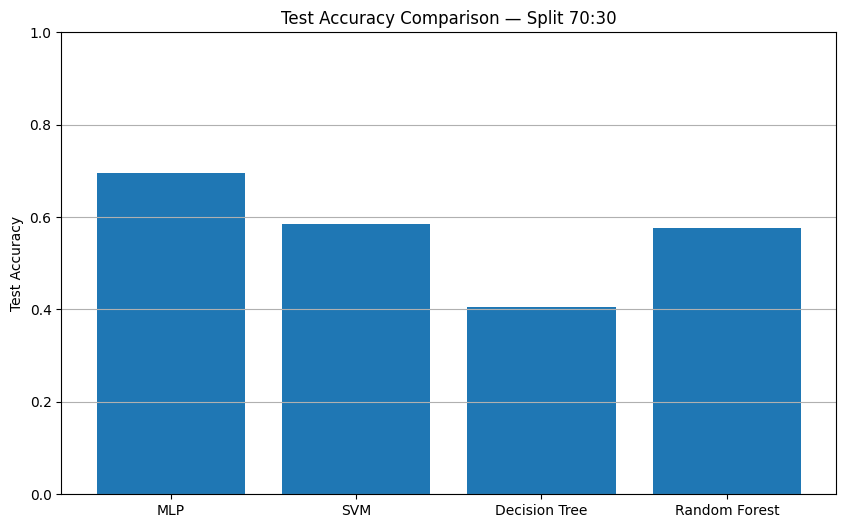

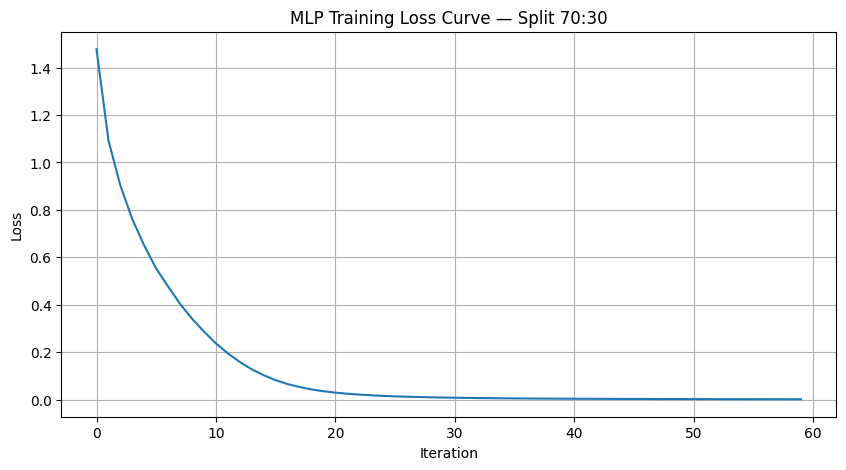


TRAINING TIME + ACCURACY — Split 60:40

------------------------------
⏳ Evaluating: MLP (Split 60:40)
------------------------------
Training Time: 52.84 sec
Train Accuracy: 100.00%
Test Accuracy: 68.78%

------------------------------
⏳ Evaluating: SVM (Split 60:40)
------------------------------
Training Time: 735.75 sec
Train Accuracy: 82.99%
Test Accuracy: 58.37%

------------------------------
⏳ Evaluating: Decision Tree (Split 60:40)
------------------------------
Training Time: 6.12 sec
Train Accuracy: 100.00%
Test Accuracy: 38.27%

------------------------------
⏳ Evaluating: Random Forest (Split 60:40)
------------------------------
Training Time: 42.02 sec
Train Accuracy: 100.00%
Test Accuracy: 55.25%


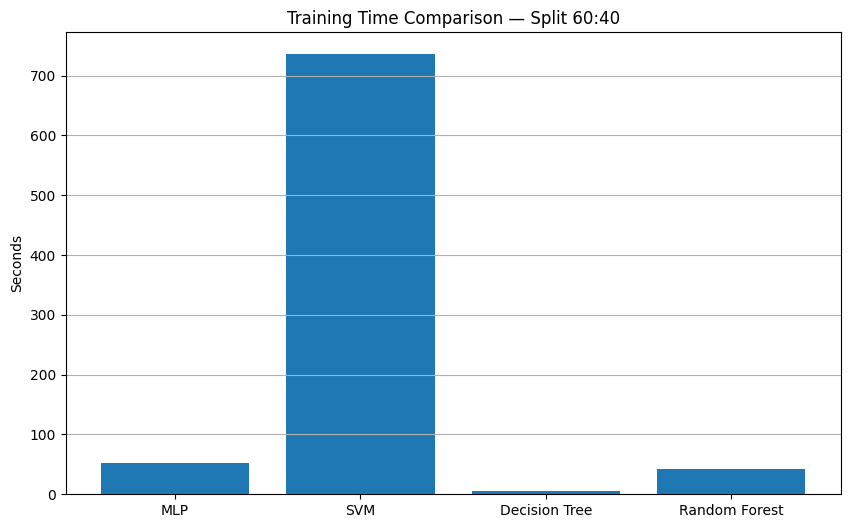

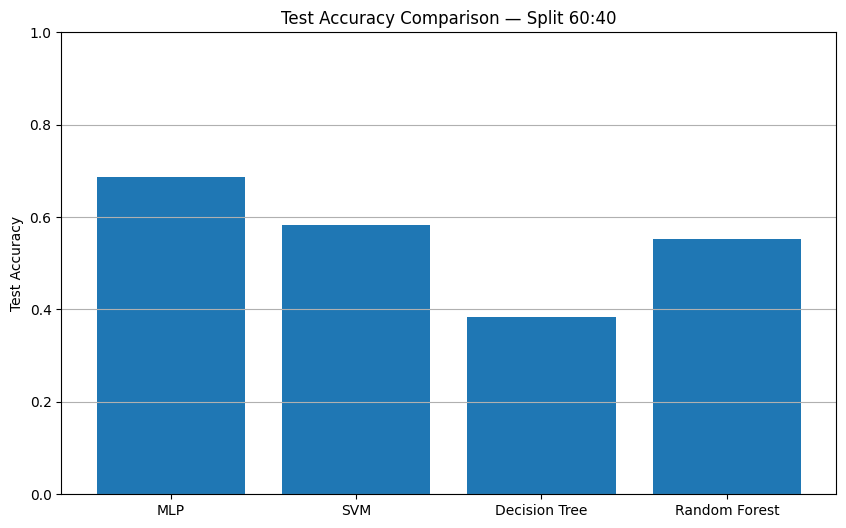

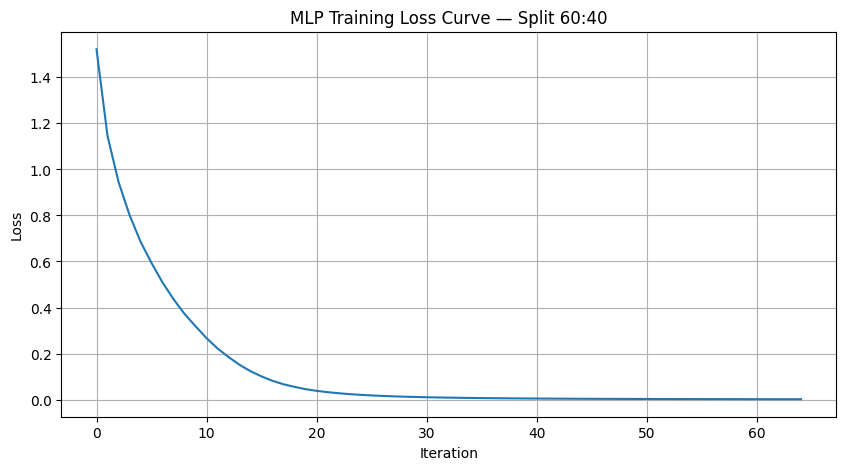


TRAINING TIME + ACCURACY — Split 50:50

------------------------------
⏳ Evaluating: MLP (Split 50:50)
------------------------------
Training Time: 45.30 sec
Train Accuracy: 100.00%
Test Accuracy: 67.96%

------------------------------
⏳ Evaluating: SVM (Split 50:50)
------------------------------
Training Time: 462.43 sec
Train Accuracy: 85.66%
Test Accuracy: 57.42%

------------------------------
⏳ Evaluating: Decision Tree (Split 50:50)
------------------------------
Training Time: 4.93 sec
Train Accuracy: 100.00%
Test Accuracy: 39.18%

------------------------------
⏳ Evaluating: Random Forest (Split 50:50)
------------------------------
Training Time: 32.28 sec
Train Accuracy: 100.00%
Test Accuracy: 53.01%


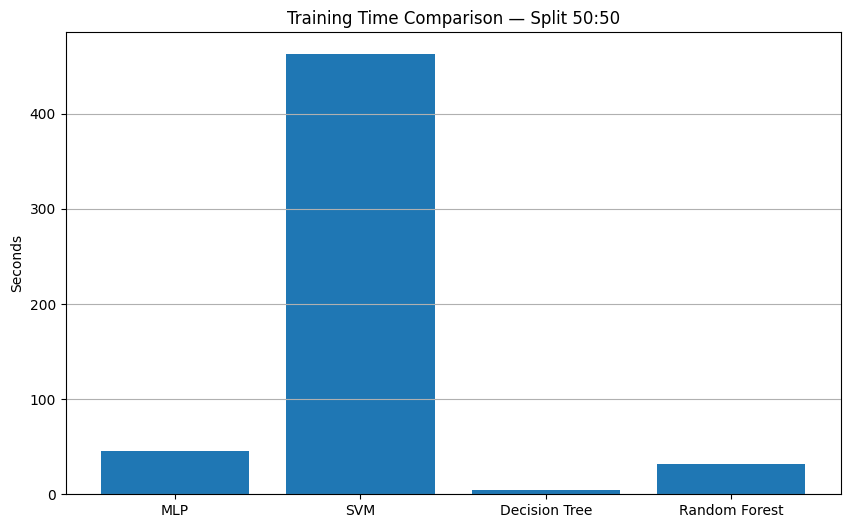

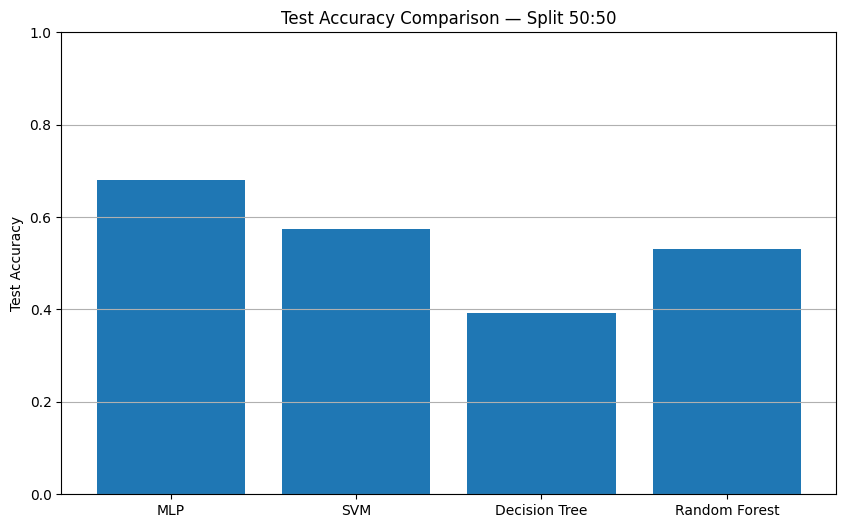

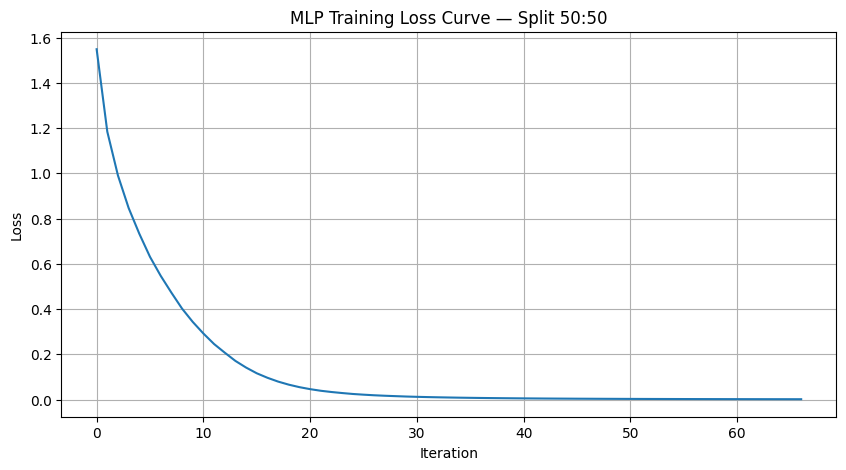


TRAINING TIME + ACCURACY — Split 40:60

------------------------------
⏳ Evaluating: MLP (Split 40:60)
------------------------------
Training Time: 39.65 sec
Train Accuracy: 100.00%
Test Accuracy: 65.57%

------------------------------
⏳ Evaluating: SVM (Split 40:60)
------------------------------
Training Time: 248.96 sec
Train Accuracy: 88.43%
Test Accuracy: 55.22%

------------------------------
⏳ Evaluating: Decision Tree (Split 40:60)
------------------------------
Training Time: 3.65 sec
Train Accuracy: 100.00%
Test Accuracy: 38.23%

------------------------------
⏳ Evaluating: Random Forest (Split 40:60)
------------------------------
Training Time: 25.51 sec
Train Accuracy: 100.00%
Test Accuracy: 51.28%


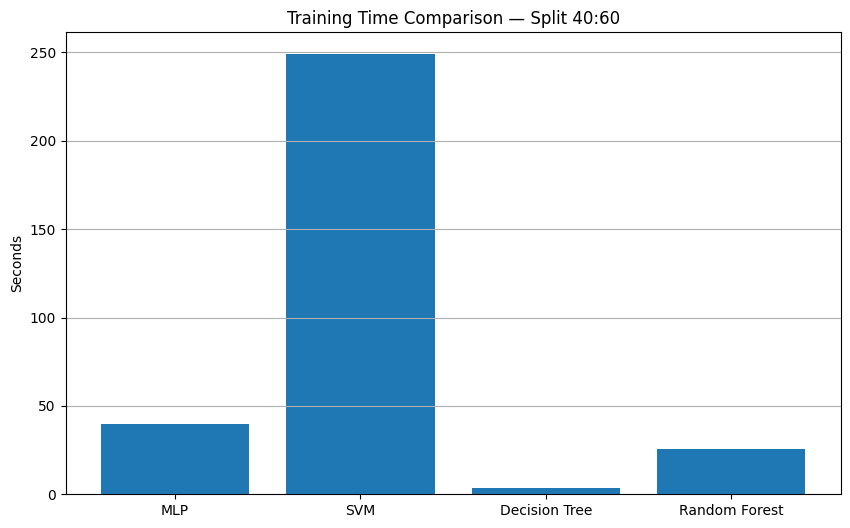

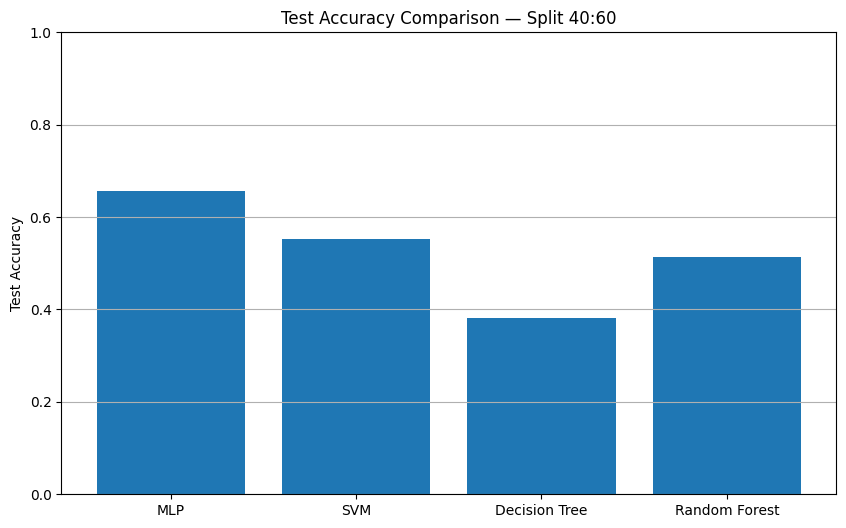

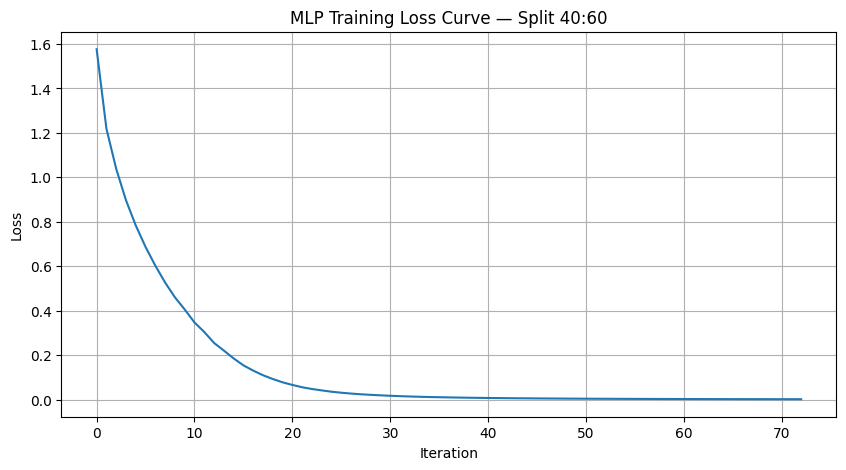


TRAINING TIME + ACCURACY — Split 30:70

------------------------------
⏳ Evaluating: MLP (Split 30:70)
------------------------------
Training Time: 31.23 sec
Train Accuracy: 100.00%
Test Accuracy: 64.09%

------------------------------
⏳ Evaluating: SVM (Split 30:70)
------------------------------
Training Time: 73.32 sec
Train Accuracy: 93.33%
Test Accuracy: 53.67%

------------------------------
⏳ Evaluating: Decision Tree (Split 30:70)
------------------------------
Training Time: 2.69 sec
Train Accuracy: 100.00%
Test Accuracy: 37.09%

------------------------------
⏳ Evaluating: Random Forest (Split 30:70)
------------------------------
Training Time: 18.24 sec
Train Accuracy: 100.00%
Test Accuracy: 48.78%


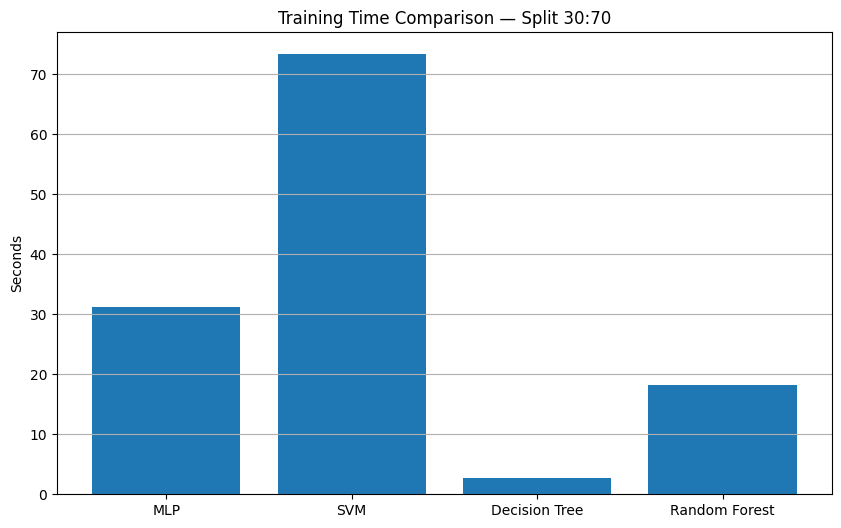

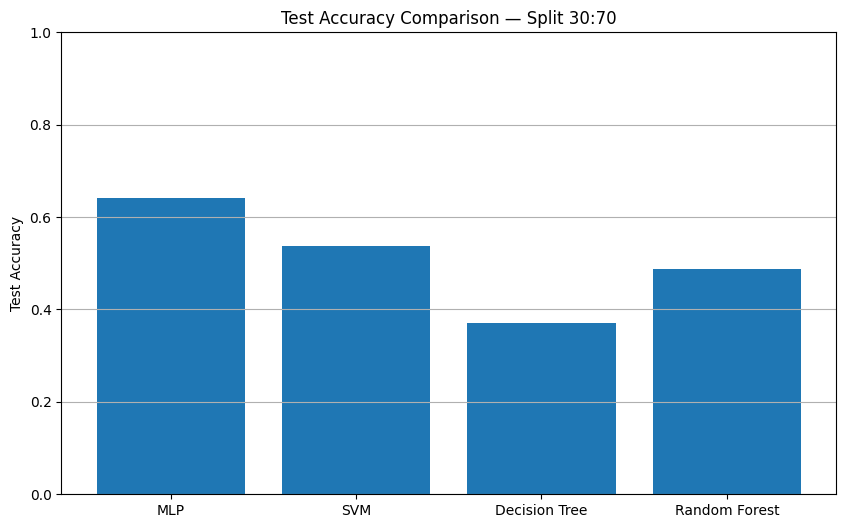

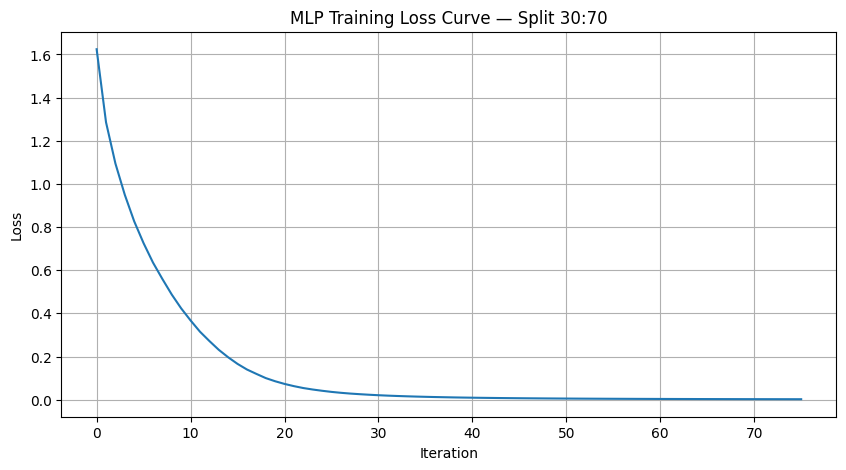


TRAINING TIME + ACCURACY — Split 20:80

------------------------------
⏳ Evaluating: MLP (Split 20:80)
------------------------------
Training Time: 26.88 sec
Train Accuracy: 100.00%
Test Accuracy: 61.12%

------------------------------
⏳ Evaluating: SVM (Split 20:80)
------------------------------
Training Time: 9.81 sec
Train Accuracy: 99.68%
Test Accuracy: 53.03%

------------------------------
⏳ Evaluating: Decision Tree (Split 20:80)
------------------------------
Training Time: 1.62 sec
Train Accuracy: 100.00%
Test Accuracy: 34.67%

------------------------------
⏳ Evaluating: Random Forest (Split 20:80)
------------------------------
Training Time: 11.66 sec
Train Accuracy: 100.00%
Test Accuracy: 46.65%


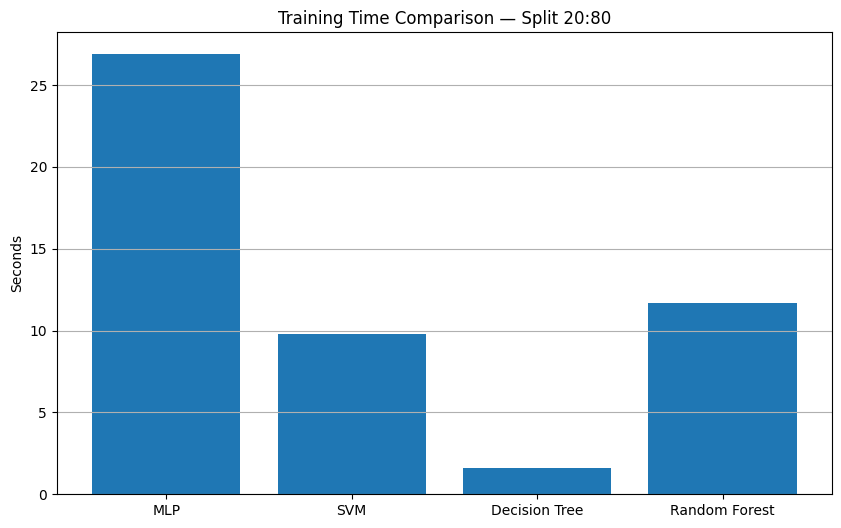

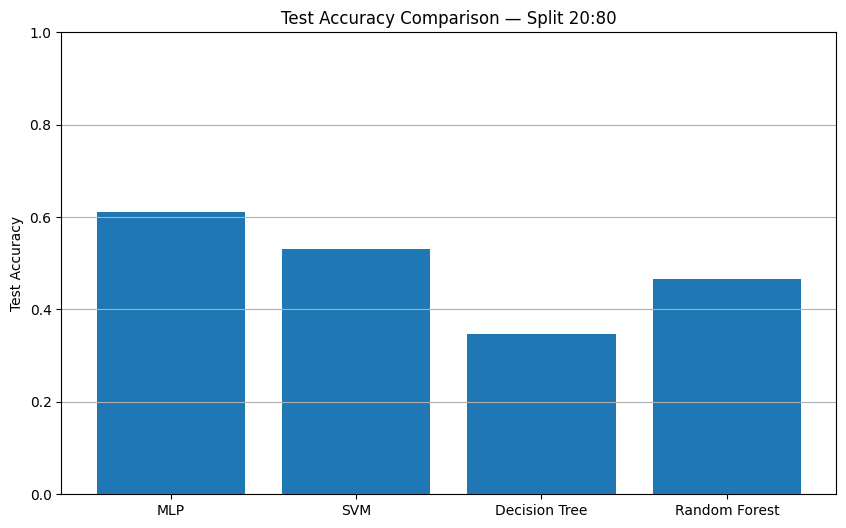

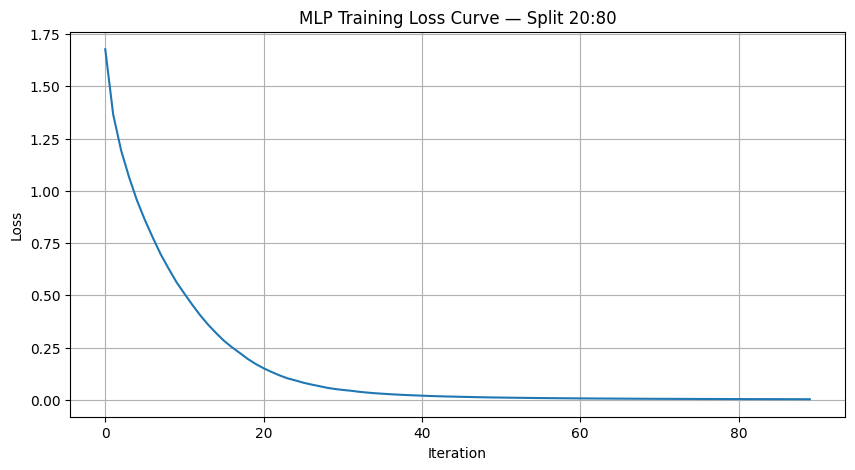


TRAINING TIME + ACCURACY — Split 10:90

------------------------------
⏳ Evaluating: MLP (Split 10:90)
------------------------------
Training Time: 14.64 sec
Train Accuracy: 100.00%
Test Accuracy: 55.89%

------------------------------
⏳ Evaluating: SVM (Split 10:90)
------------------------------
Training Time: 1.45 sec
Train Accuracy: 100.00%
Test Accuracy: 50.07%

------------------------------
⏳ Evaluating: Decision Tree (Split 10:90)
------------------------------
Training Time: 0.78 sec
Train Accuracy: 100.00%
Test Accuracy: 30.58%

------------------------------
⏳ Evaluating: Random Forest (Split 10:90)
------------------------------
Training Time: 5.13 sec
Train Accuracy: 100.00%
Test Accuracy: 41.00%


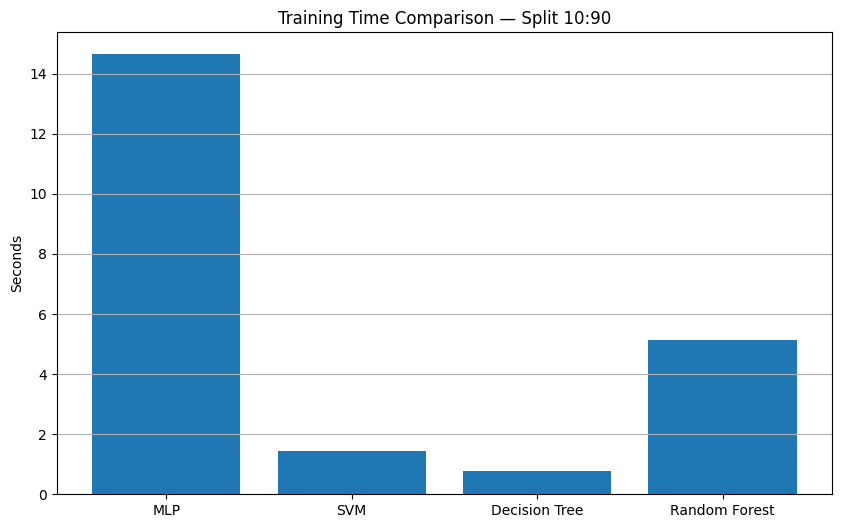

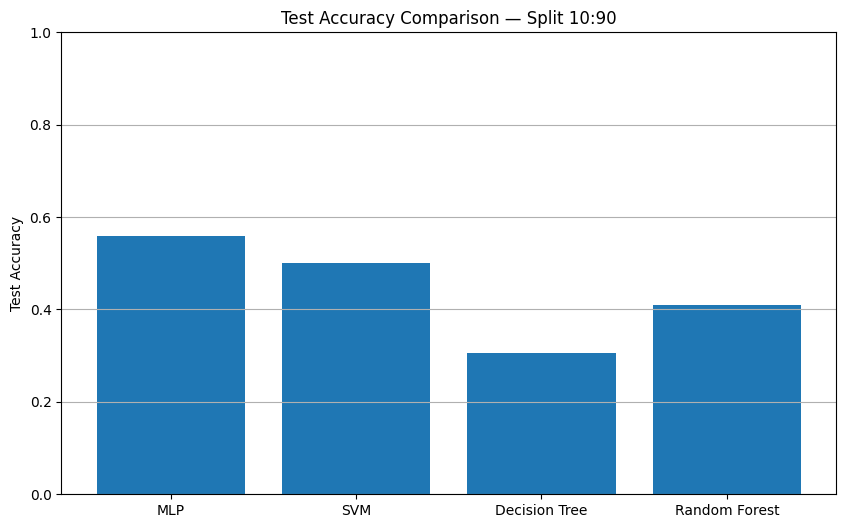

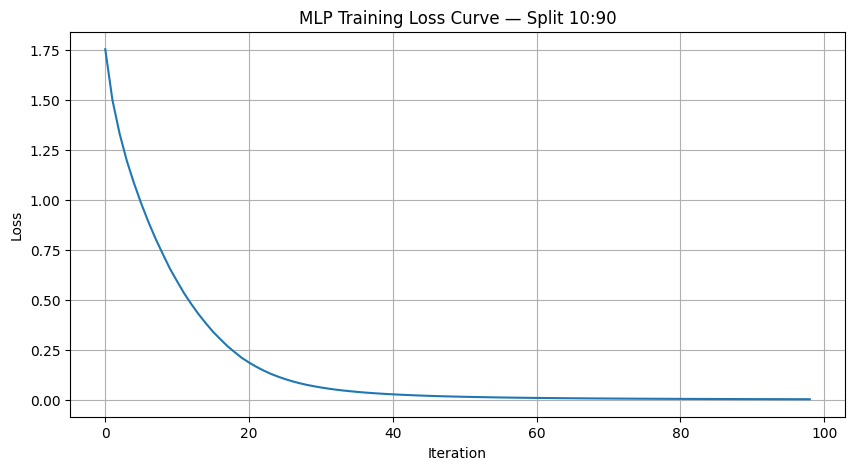

In [22]:
import time
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

split_ratios = [(90,10),(80,20),(70,30),(60,40),(50,50),(40,60),(30,70),(20,80),(10,90)]

for tr, te in split_ratios:

    print("\n" + "="*90)
    print(f"TRAINING TIME + ACCURACY — Split {tr}:{te}")
    print("="*90)

    X_tr, X_te, y_tr, y_te = train_test_split(
        X_all, y_all,
        test_size=te / 100,
        stratify=y_all,
        random_state=42
    )

    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_te = scaler.transform(X_te)

    pca = PCA(n_components=512)
    X_tr = pca.fit_transform(X_tr)
    X_te = pca.transform(X_te)

    classifiers = {
        "MLP": MLPClassifier(
            hidden_layer_sizes=(1024, 512, 256),
            activation='relu',
            solver='adam',
            learning_rate_init=0.0001,
            max_iter=1000,
            random_state=42,
            verbose=False
        ),
        "SVM": SVC(kernel="linear", probability=True),
        "Decision Tree": DecisionTreeClassifier(),
        "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42)
    }

    train_times = {}
    train_accuracies = {}
    test_accuracies = {}
    loss_curves = {}

    for name, model in classifiers.items():

        print(f"\n------------------------------")
        print(f"⏳ Evaluating: {name} (Split {tr}:{te})")
        print(f"------------------------------")

        start = time.time()
        model.fit(X_tr, y_tr)
        end = time.time()

        train_times[name] = end - start

        train_preds = model.predict(X_tr)
        test_preds = model.predict(X_te)

        train_acc = accuracy_score(y_tr, train_preds)
        test_acc = accuracy_score(y_te, test_preds)

        train_accuracies[name] = train_acc
        test_accuracies[name] = test_acc

        print(f"Training Time: {train_times[name]:.2f} sec")
        print(f"Train Accuracy: {train_acc*100:.2f}%")
        print(f"Test Accuracy: {test_acc*100:.2f}%")

        if name == "MLP":
            loss_curves[name] = model.loss_curve_
        else:
            loss_curves[name] = None

    # Plot training time (per split)
    plt.figure(figsize=(10, 6))
    plt.bar(train_times.keys(), train_times.values())
    plt.ylabel("Seconds")
    plt.title(f"Training Time Comparison — Split {tr}:{te}")
    plt.grid(axis='y')
    plt.show()

    # Plot test accuracy (per split)
    plt.figure(figsize=(10, 6))
    x = range(len(classifiers))
    plt.bar(x, [test_accuracies[c] for c in classifiers], tick_label=list(classifiers.keys()))
    plt.ylabel("Test Accuracy")
    plt.title(f"Test Accuracy Comparison — Split {tr}:{te}")
    plt.ylim(0, 1)
    plt.grid(axis='y')
    plt.show()

    # Plot MLP loss curve (per split)
    if loss_curves["MLP"] is not None:
        plt.figure(figsize=(10, 5))
        plt.plot(loss_curves["MLP"])
        plt.title(f"MLP Training Loss Curve — Split {tr}:{te}")
        plt.xlabel("Iteration")
        plt.ylabel("Loss")
        plt.grid(True)
        plt.show()

This block tests a cosine-distance k-NN classifier on the extracted feature vectors by training separate KNN models with different neighbor counts (k = 1, 5, 20). For each k, it fits on the training features, predicts the validation labels, computes validation accuracy, and prints the result to compare how k affects performance.

In [23]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

k_values = [1, 5, 20]

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k, metric='cosine')
    knn.fit(train_X, train_y)

    val_preds = knn.predict(val_X)
    acc = accuracy_score(val_y, val_preds)

    print(f"🔹 k = {k}: Validation Accuracy = {acc * 100:.2f}%")


🔹 k = 1: Validation Accuracy = 69.20%
🔹 k = 5: Validation Accuracy = 67.00%
🔹 k = 20: Validation Accuracy = 63.10%


This block measures label efficiency by repeatedly training classifiers on small random subsets of the training features (1%, 5%, 10%, 25%, 50%) and evaluating on the full validation set. For each fraction, it samples a subset with a fixed seed for reproducibility, trains four models (multinomial logistic regression as a linear probe, linear SVM, decision tree, and random forest), stores their validation accuracies, and finally plots accuracy vs. percentage of labeled data to compare how quickly each method improves as more labels are available.

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fraction 1% complete.


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fraction 5% complete.


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fraction 10% complete.


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fraction 25% complete.


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fraction 50% complete.


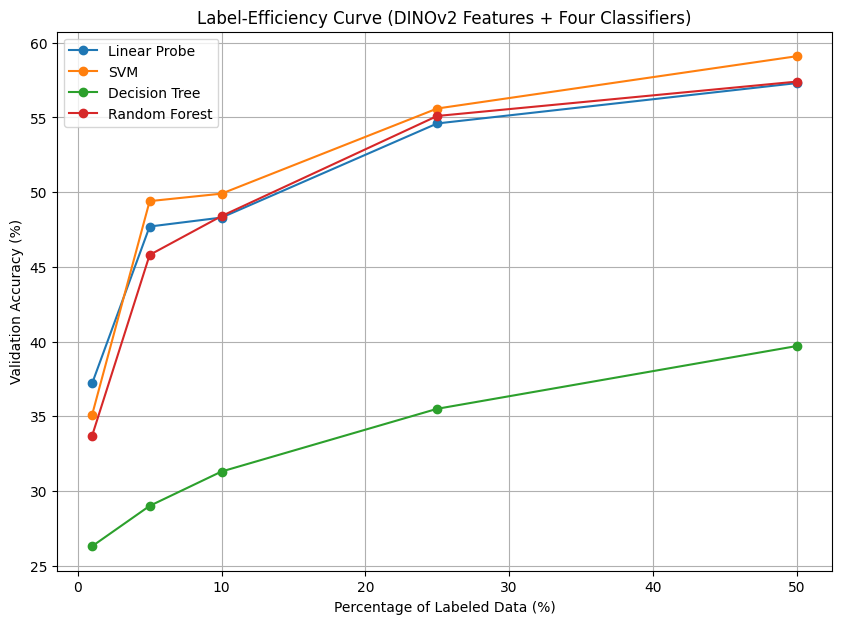

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

fractions = [0.01, 0.05, 0.10, 0.25, 0.50]
n_train = train_X.shape[0]

linear_probe_accuracies = []
svm_accuracies = []
dt_accuracies = []
rf_accuracies = []

for frac in fractions:
    n_samples = max(1, int(n_train * frac))
    np.random.seed(42)
    indices = np.random.choice(n_train, n_samples, replace=False)

    X_subset = train_X[indices]
    y_subset = train_y[indices]

    clf = LogisticRegression(
        multi_class='multinomial',
        solver='lbfgs',
        max_iter=1000
    )
    clf.fit(X_subset, y_subset)
    val_preds = clf.predict(val_X)
    linear_probe_accuracies.append(accuracy_score(val_y, val_preds))

    svm = SVC(kernel="linear", probability=True)
    svm.fit(X_subset, y_subset)
    svm_accuracies.append(accuracy_score(val_y, svm.predict(val_X)))

    dt = DecisionTreeClassifier()
    dt.fit(X_subset, y_subset)
    dt_accuracies.append(accuracy_score(val_y, dt.predict(val_X)))

    rf = RandomForestClassifier(n_estimators=200)
    rf.fit(X_subset, y_subset)
    rf_accuracies.append(accuracy_score(val_y, rf.predict(val_X)))

    print(f"Fraction {frac*100:.0f}% complete.")

plt.figure(figsize=(10,7))
plt.plot([f*100 for f in fractions], [x*100 for x in linear_probe_accuracies], marker='o', label="Linear Probe")
plt.plot([f*100 for f in fractions], [x*100 for x in svm_accuracies], marker='o', label="SVM")
plt.plot([f*100 for f in fractions], [x*100 for x in dt_accuracies], marker='o', label="Decision Tree")
plt.plot([f*100 for f in fractions], [x*100 for x in rf_accuracies], marker='o', label="Random Forest")

plt.xlabel("Percentage of Labeled Data (%)")
plt.ylabel("Validation Accuracy (%)")
plt.title("Label-Efficiency Curve (DINOv2 Features + Four Classifiers)")
plt.grid(True)
plt.legend()
plt.show()
